In [1]:
library(ggplot2)
library(reshape2)
library(gridExtra)
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR) 
library(factoextra)
library(glmnet) 
library(ggfortify)
library(pROC)
library(ROCR)
library(RColorBrewer)
library(mapview)
library(leaflet)
library(viridis)
### supprimer les packages inutiles

── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.2     ✔ tidyr     1.3.1
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine() masks gridExtra::combine()
✖ dplyr::filter()  masks stats::filter()
✖ dplyr::lag()     masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attachement du package : 'plotly'


L'objet suivant est masqué depuis 'package:ggplot2':

    last_plot


L'objet suivant est masqué depuis 'package:stats':

    filter


L'objet suivant est masqué depuis 'package:graphics':

    layout


corrplot 0.92 loaded

Welcome! Want to learn more?

In [2]:
load('data/velib.RData')
summary(velib)

         Length Class      Mode     
data      181   data.frame list     
position    2   data.frame list     
dates     181   -none-     character
bonus    1189   -none-     numeric  
names    1189   -none-     character

In [3]:
# data preparation
loading = as.matrix(velib$data)
colnames(loading) = 1:ncol(loading)
rownames(loading) = velib$names

stations = 1:nrow(loading)
coord = velib$position[stations,]
coord$bonus = velib$bonus[stations]

# select exactly 7 days of data (we remove the first 13 dates)
dates = 14:181
loading = loading[stations, dates]
colnames(loading) = 1:length(dates)
head(loading)
head(coord)

,1,2,3,4,5,6,7,8,9,10,⋯,159,160,161,162,163,164,165,166,167,168
EURYALE DEHAYNIN,0.03846154,0.03846154,0.07692308,0.03846154,0.03846154,0.03846154,0.03846154,0.03846154,0.10714286,0.00000000,⋯,0.29629630,0.11111111,0.1111111,0.14814815,0.30769231,0.07692308,0.11538462,0.07692308,0.1538462,0.1538462
LEMERCIER,0.47826087,0.47826087,0.47826087,0.43478261,0.43478261,0.43478261,0.43478261,0.43478261,0.26086957,0.04347826,⋯,0.04347826,0.00000000,0.2173913,0.13043478,0.04545455,0.17391304,0.17391304,0.17391304,0.2608696,0.3913043
MEZIERES RENNES,0.21818182,0.14545455,0.12727273,0.10909091,0.10909091,0.10909091,0.09090909,0.09090909,0.05454545,0.10909091,⋯,0.25925926,0.25925926,0.2037037,0.12962963,0.14814815,0.29629630,0.31481481,0.37037037,0.3703704,0.4074074
FARMAN,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,1.00000000,1.00000000,1.00000000,⋯,1.00000000,1.00000000,0.9047619,0.85714286,0.85714286,0.85714286,0.76190476,0.76190476,0.7619048,0.7619048
QUAI DE LA RAPEE,0.92753623,0.81159420,0.73913043,0.72463768,0.72463768,0.72463768,0.72463768,0.72463768,0.75362319,0.97101449,⋯,0.22727273,0.45454545,0.5909091,0.83333333,1.00000000,0.81818182,0.63636364,0.71212121,0.6212121,0.5757576
CHOISY POINT D'IVRY,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.08333333,0.00000000,⋯,0.34782609,0.08695652,0.1153846,0.08695652,0.13043478,0.08695652,0.08695652,0.43478261,0.3913043,0.5217391


,longitude,latitude,bonus
,<dbl>,<dbl>,<dbl>
19117,2.377389,48.88630,0
17111,2.317591,48.89002,0
6103,2.330447,48.85030,0
15042,2.271396,48.83373,0
12003,2.366897,48.84589,0
13038,2.363335,48.82191,0


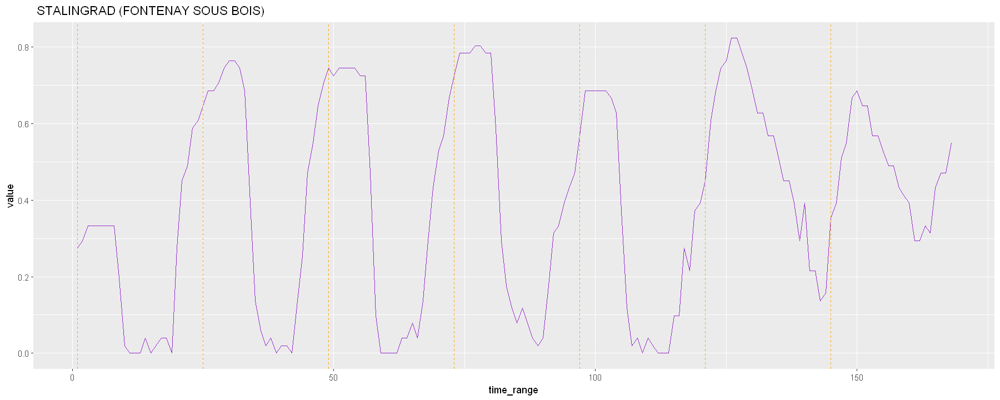

In [16]:
options(repr.plot.width = 15, repr.plot.height = 6)
time_tick = 1 + 24*(0:6)
i = sample(1:1189,1)
df = melt(loading[8,])
df$time_range = 1:ncol(loading)
ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(title=velib$names[8])
### changer les légendes abscisse et ordonnée

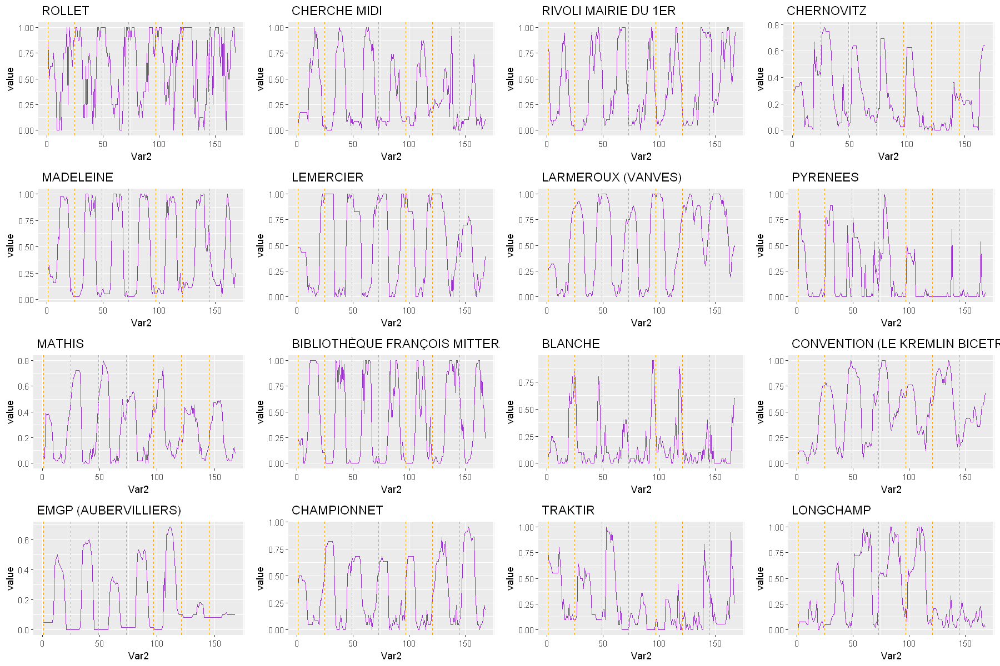

In [5]:
options(repr.plot.width = 15, repr.plot.height = 10)

# --- #

timeTick = 1 + 24*(0:6)  # vector corresponding to the beginning of days

# select 16 stations
stations = sample.int(nrow(loading), 16)

df = melt(loading[stations,])  #the function melt reshapes it from wide to 

p = list()
for (i in 1:16){
    dfi = df[df$Var1 == velib$names[stations[i]],]
    p[[i]] = ggplot(dfi, aes(x=Var2, y=value)) + 
        geom_line(col="darkorchid") + 
       geom_vline(xintercept=timeTick, col="orange", linetype="dashed") +
       labs(title=velib$names[stations[i]])
}
do.call(grid.arrange,p)
### pareil qu'au dessus

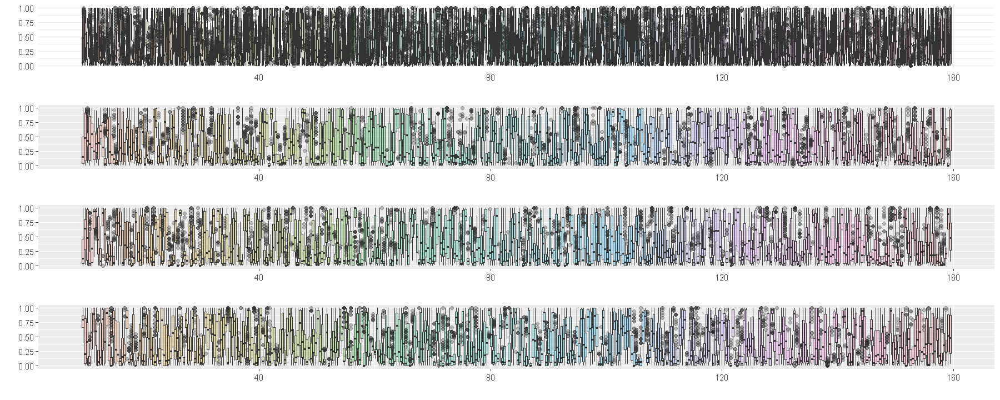

In [6]:
options(repr.plot.width = 15, repr.plot.height = 6)

# --- #

df = melt(loading)
p1 = ggplot(df, aes(x=Var2, y=value, fill=Var1)) + 
    geom_boxplot(alpha=.3, show.legend = FALSE) +
    xlab('') + ylab('') + theme_minimal()

# --- #

# Only a third of the data
df = melt(loading[ seq(from=1, to=+floor(nrow(loading)/3)) ,])
p2 = ggplot(df, aes(x=Var2, y=value, fill=Var1)) + 
    geom_boxplot(alpha=.3, show.legend = FALSE) +
    xlab('') + ylab('')

# The next third
df = melt(loading[ seq(from=1+floor(nrow(loading)/3), to=2*floor(nrow(loading)/3)) ,])
p3 = ggplot(df, aes(x=Var2, y=value, fill=Var1)) + 
    geom_boxplot(alpha=.3, show.legend = FALSE) +
    xlab('') + ylab('')

# The remaining third
df = melt(loading[ seq(from=1+2*floor(nrow(loading)/3), to=nrow(loading)) ,])
p4 = ggplot(df, aes(x=Var2, y=value, fill=Var1)) + 
    geom_boxplot(alpha=.3, show.legend = FALSE) +
    xlab('') + ylab('')

# --- #

grid.arrange(p1, p2, p3, p4, nrow=4)
### à supprimer

In [27]:
### on peut voir que certaines stations ont des cycles de chargement distinctifs, présentent des spécificités particulières
### en fonction de l'heure de la journée, jour de la semaine, parfois présence de pics...

In [7]:
print('--- Average fill rate ---')
print(mean(loading))
# --- #
print('')

print('--- Least crowded station, on average ---')
i = which.min(rowMeans(loading)) 
print(rowMeans(loading)[i])

# --- #
print('')

print('--- Fullest station, on average ---')
i = which.max(rowMeans(loading))
print(rowMeans(loading)[i])

[1] "--- Average fill rate ---"
[1] 0.3816218
[1] ""
[1] "--- Least crowded station, on average ---"
 HORNET (BAGNOLET) 
        0.01613284 
[1] ""
[1] "--- Fullest station, on average ---"
 INSURRECTION AOUT 1944 (IVRY) 
                     0.9193723 


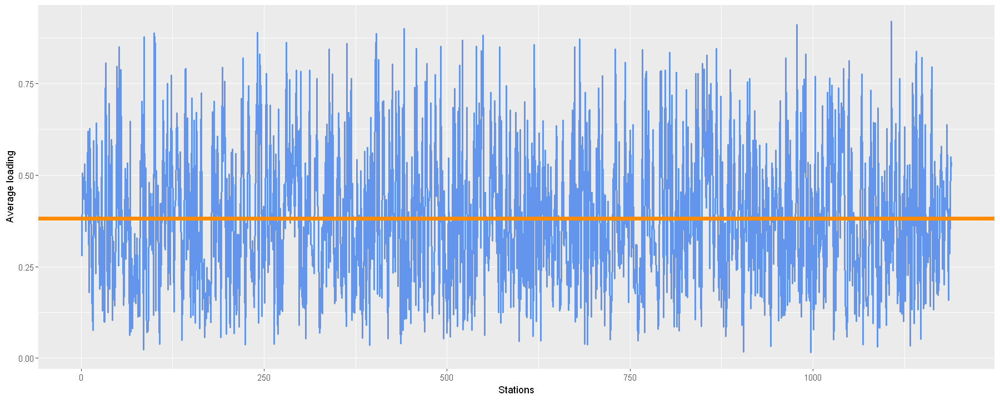

In [8]:
options(repr.plot.width = 15, repr.plot.height = 6)

df = data.frame(stations = c(1:nrow(loading)), mean = rowMeans(loading))
ggplot(df, aes(x = stations, y= mean)) + 
    geom_line(color = 'cornflowerblue', linewidth=1) +
    geom_hline(yintercept = mean(loading), color = 'darkorange', linewidth=2) +
    labs(x = "Stations", y = "Average loading")

In [ ]:
### Certaines stations sont plus souvent chargées (pleines) que d'autres.
### Remarque : ce n'est pas parce qu'une station est toujours vide qu'elle correspond à une zone pauvre en activités. En effet, cela signifie seulement 
### qu'elle n'a jamais un taux de chargement très élevé : dès qu'un vélo arrive, il est peut-être repris dans la foulée. 
### De plus, ce qui serait intéressant d'analyser, ce serait plutôt les dynamiques de circulation des vélos, les échanges de vélo entre stations. 

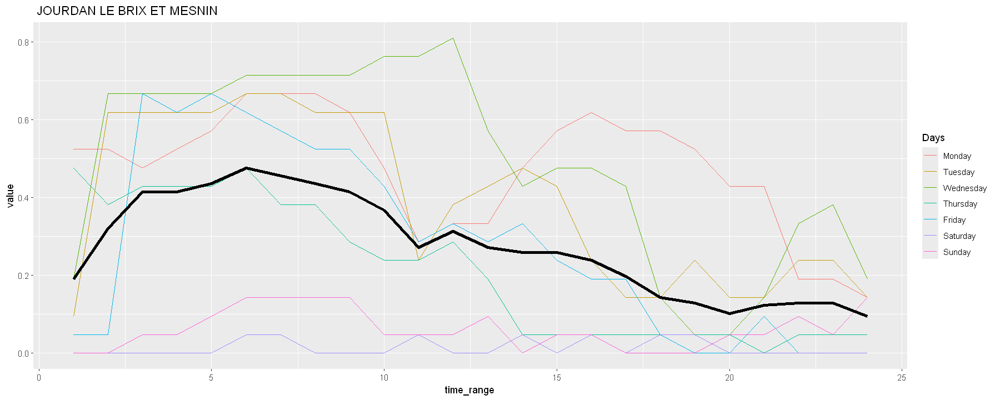

In [9]:
### Influence de l'heure de la journée
options(repr.plot.width = 15, repr.plot.height = 6)
time_range = 1:24
i = sample(1:1189,1)
df = loading[i,]
mean_per_hour_per_day = matrix(df, nrow = 24)
mean_per_hour         = rowMeans(mean_per_hour_per_day)

mean_per_hour_per_day            = as.data.frame(mean_per_hour_per_day)
colnames(mean_per_hour_per_day)  = list("Monday", "Tuesday", "Wednesday","Thursday", "Friday", "Saturday", "Sunday")
mean_per_hour_per_day$time_range = c(1:24)
mean_per_hour_per_day            = melt(mean_per_hour_per_day, id='time_range', variable.name='Days')

mean_per_hour            = as.data.frame(mean_per_hour)
colnames(mean_per_hour)  = list("Weekly")
mean_per_hour$time_range = c(1:24)

ggplot() +  
       geom_line(data=mean_per_hour_per_day, aes(x=time_range, y=value, color=Days)) + 
       geom_line(data=mean_per_hour, aes(x = time_range , y=Weekly), linewidth = 1.5) +
       labs(title=velib$names[i])
### pareil : abscisse et ordonnée

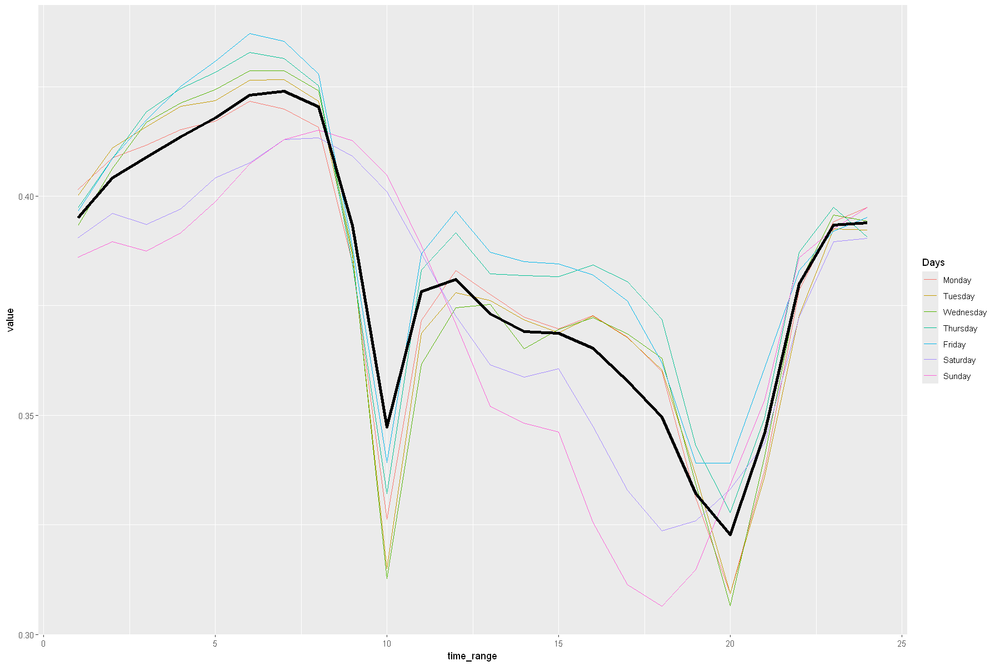

In [10]:
mean_per_hour_per_day = colMeans(loading)
mean_per_hour_per_day = matrix(mean_per_hour_per_day, nrow = 24)
mean_per_hour         = rowMeans(mean_per_hour_per_day)
# --- #

mean_per_hour_per_day            = as.data.frame(mean_per_hour_per_day)
colnames(mean_per_hour_per_day)  = list("Monday", "Tuesday", "Wednesday","Thursday", "Friday", "Saturday", "Sunday")
mean_per_hour_per_day$time_range = c(1:24)
mean_per_hour_per_day            = melt(mean_per_hour_per_day, id='time_range', variable.name='Days')

mean_per_hour            = as.data.frame(mean_per_hour)
colnames(mean_per_hour)  = list("Weekly")
mean_per_hour$time_range = c(1:24)

# --- #
options(repr.plot.width = 15, repr.plot.height = 10)

ggplot() +  
        geom_line(data=mean_per_hour_per_day, aes(x=time_range, y=value, color=Days)) + 
        geom_line(data=mean_per_hour, aes(x = time_range , y=Weekly), linewidth = 1.5)
### pareil

In [15]:
### conclusion : on ne peut pas distinguer de comportement jour/nuit en moyenne car ça s'équilibre sur les stations (on varie entre 42,5 et 37,5)
### Néanmoins, on peut voir que certaines stations sont plus pleines la nuit que le jour et inversement d'autres sont plus pleines le jour que la nuit
### Donc pourquoi pas envisager des classes entre les stations prises la nuit et celles prises le jour (et imaginer des va et vient de vélos entre elles)
### stations proches des lieux de travail donc pleines le jour, d'autres proches des lieux de résidence (en périphérie) donc pleines la nuit.
### voir map

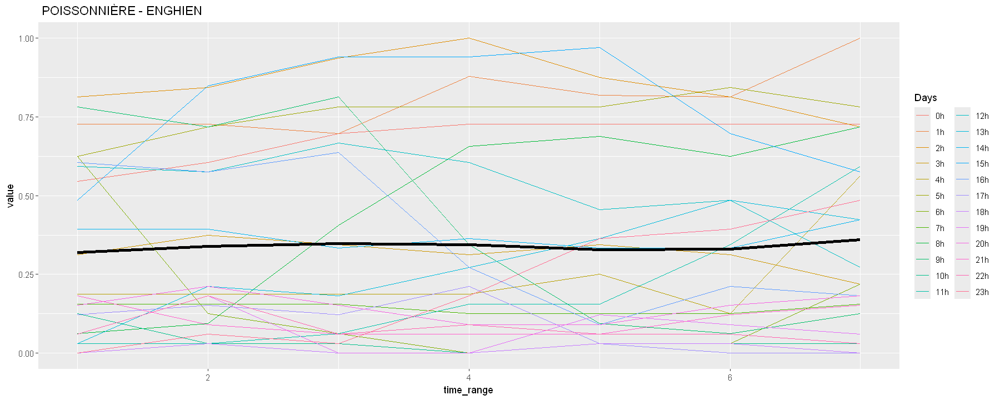

In [14]:
### Influence du jour de la semaine
options(repr.plot.width = 15, repr.plot.height = 6)
time_range = 1:7
i = sample(1:1189,1)
df = loading[i,]
mean_per_hour_per_day = matrix(df, nrow = 7)
mean_per_hour         = rowMeans(mean_per_hour_per_day)

mean_per_hour_per_day            = as.data.frame(mean_per_hour_per_day)
colnames(mean_per_hour_per_day)  = list("0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h")
mean_per_hour_per_day$time_range = c(1:7)
mean_per_hour_per_day            = melt(mean_per_hour_per_day, id='time_range', variable.name='Days')

mean_per_hour            = as.data.frame(mean_per_hour)
colnames(mean_per_hour)  = list("Weekly")
mean_per_hour$time_range = c(1:7)

ggplot() +  
       geom_line(data=mean_per_hour_per_day, aes(x=time_range, y=value, color=Days)) + 
       geom_line(data=mean_per_hour, aes(x = time_range , y=Weekly), linewidth = 1.5) +
       labs(title=velib$names[i])
### pareil

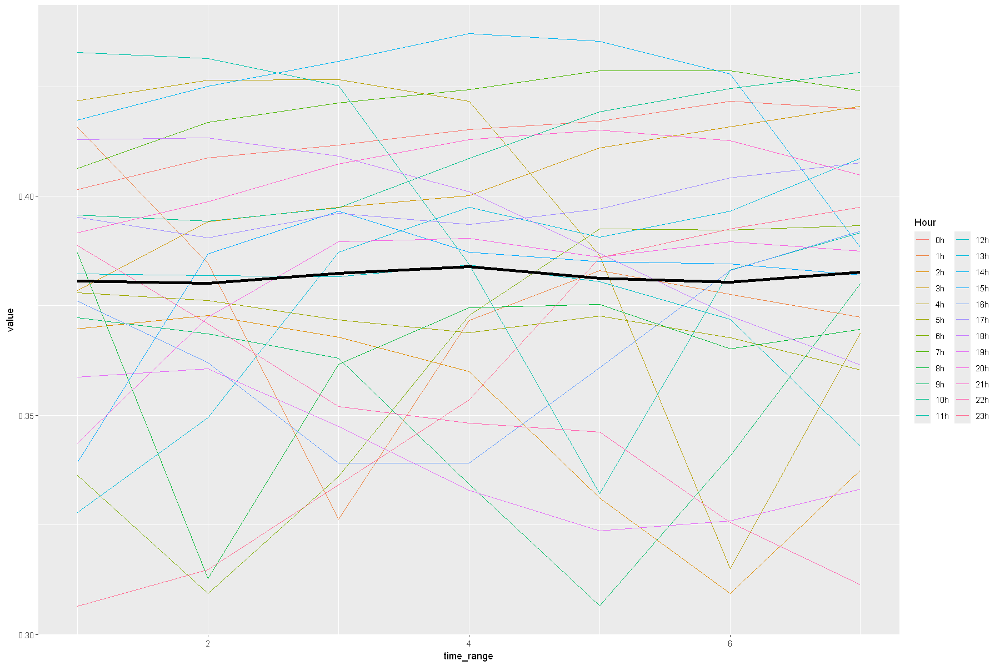

In [12]:
mean_per_hour_per_day = colMeans(loading)
mean_per_hour_per_day = matrix(mean_per_hour_per_day, nrow = 7)
mean_per_hour         = rowMeans(mean_per_hour_per_day)
# --- #

mean_per_hour_per_day            = as.data.frame(mean_per_hour_per_day)
colnames(mean_per_hour_per_day) <- list("0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h")
mean_per_hour_per_day$time_range = c(1:7)
mean_per_hour_per_day            = melt(mean_per_hour_per_day, id='time_range', variable.name='Hour')

mean_per_hour            = as.data.frame(mean_per_hour)
colnames(mean_per_hour)  = list("Weekly")
mean_per_hour$time_range = c(1:7)

# --- #
options(repr.plot.width = 15, repr.plot.height = 10)

ggplot() +  
        geom_line(data=mean_per_hour_per_day, aes(x=time_range, y=value, color=Hour)) + 
        geom_line(data=mean_per_hour, aes(x = time_range , y=Weekly), linewidth = 1.5)
### pareil

In [24]:
### conclusion : on ne peut pas distinguer de comportement semaine/week-end en moyenne
### En plus de ça, on s'aperçoit que le taux de chargement de chaque station (prise induviduellement) ne varie pas en fonction des jours

In [18]:
library(ggmap)
register_stadiamaps("d4f81b8a-655d-418e-841e-c5339e89ba9b", write = TRUE)
library(viridis)

ℹ Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service/>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles/>
ℹ Please cite ggmap if you use it! Use `citation("ggmap")` for details.

Attachement du package : 'ggmap'


L'objet suivant est masqué depuis 'package:plotly':

    wind


ℹ Replacing old key (d4f81b8a) with new key in C:\Users\pauld\Documents/.Renviron



ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



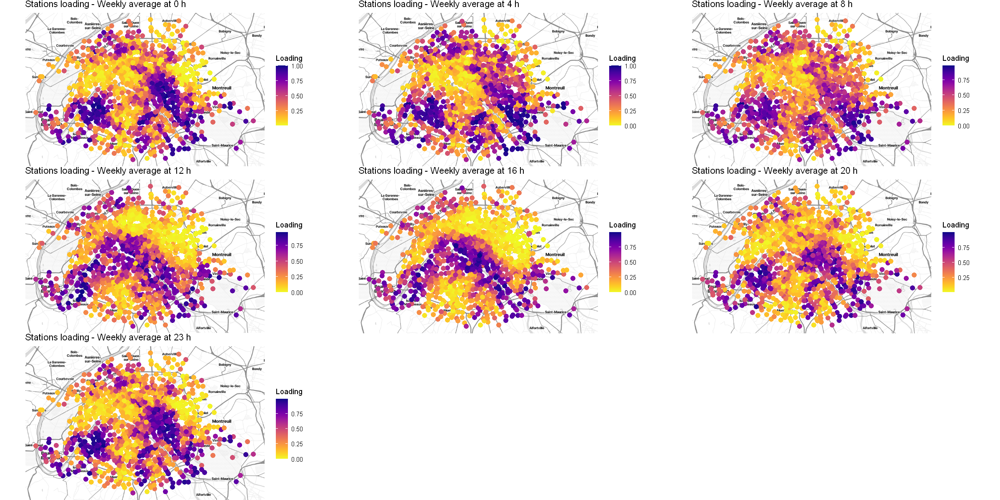

In [23]:
options(repr.plot.width = 20, repr.plot.height = 10)
hour = c(1,5,9,13,17,21,24)

dfi = coord
p = list()
for (i in 1:length(hour)){
    h    = hour[i]
    hours = seq(h, 168, 24)
    load_per_hour = rowMeans(loading[,hours])

    df = coord
    df$loading = load_per_hour
    p[[i]] = qmplot(data=df, longitude, latitude, color=loading) + 
          geom_point(size = 3) + 
          scale_color_viridis(name = "Loading", option = "C", direction = -1) +
          labs(title = paste('Stations loading - Weekly average at',(h-1),'h'))
}

do.call(grid.arrange,c(p, ncol=3))

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



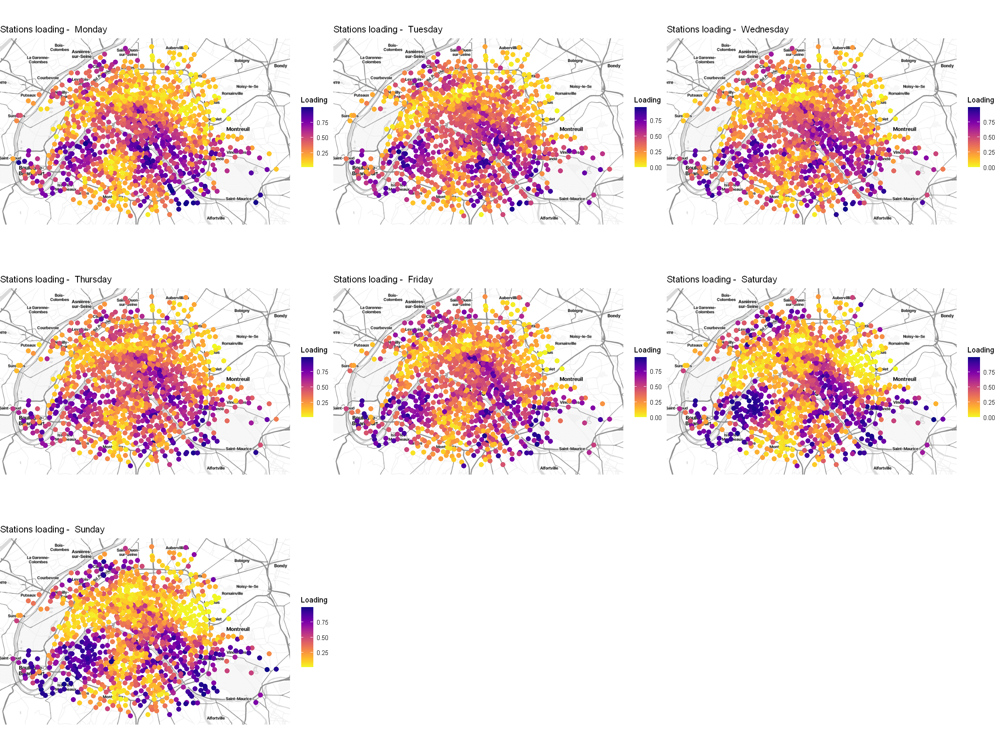

In [17]:
lundi <- rowMeans(loading[,c(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24)])
mardi <- rowMeans(loading[,c(25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48)])
mercredi <- rowMeans(loading[,c(49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72)])
jeudi <- rowMeans(loading[,c(73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96)])
vendredi <- rowMeans(loading[,c(97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120)])
samedi <- rowMeans(loading[,c(121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144)])
dimanche <- rowMeans(loading[,c(145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168)])


options(repr.plot.width = 20, repr.plot.height = 15)

days  = list("Monday", "Tuesday", "Wednesday","Thursday", "Friday", "Saturday", "Sunday")

df = coord
df$lundi = lundi
df$mardi = mardi
df$mercredi = mercredi
df$jeudi = jeudi
df$vendredi = vendredi
df$samedi = samedi
df$dimanche = dimanche
p = list()
for (i in 1:7){
    load_per_day = df[,3+i]

    dfi = coord
    dfi$loading = load_per_day
    p[[i]] = qmplot(data=dfi, longitude, latitude, color=loading) + 
          geom_point(size = 3) + 
          scale_color_viridis(name = "Loading", option = "C", direction = -1) +
          labs(title = paste('Stations loading - ',days[i]))
}


do.call(grid.arrange,c(p, ncol=3))

In [ ]:
### déplacement des résidences vers le centre ville puis retour des vélos vers 19h.

In [26]:
### le week-end par rapport à la semaine : énormes disparités de chargement entre stations : des stations très pleines et d'autres bcp moins
### le week-end accentue les disparités

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



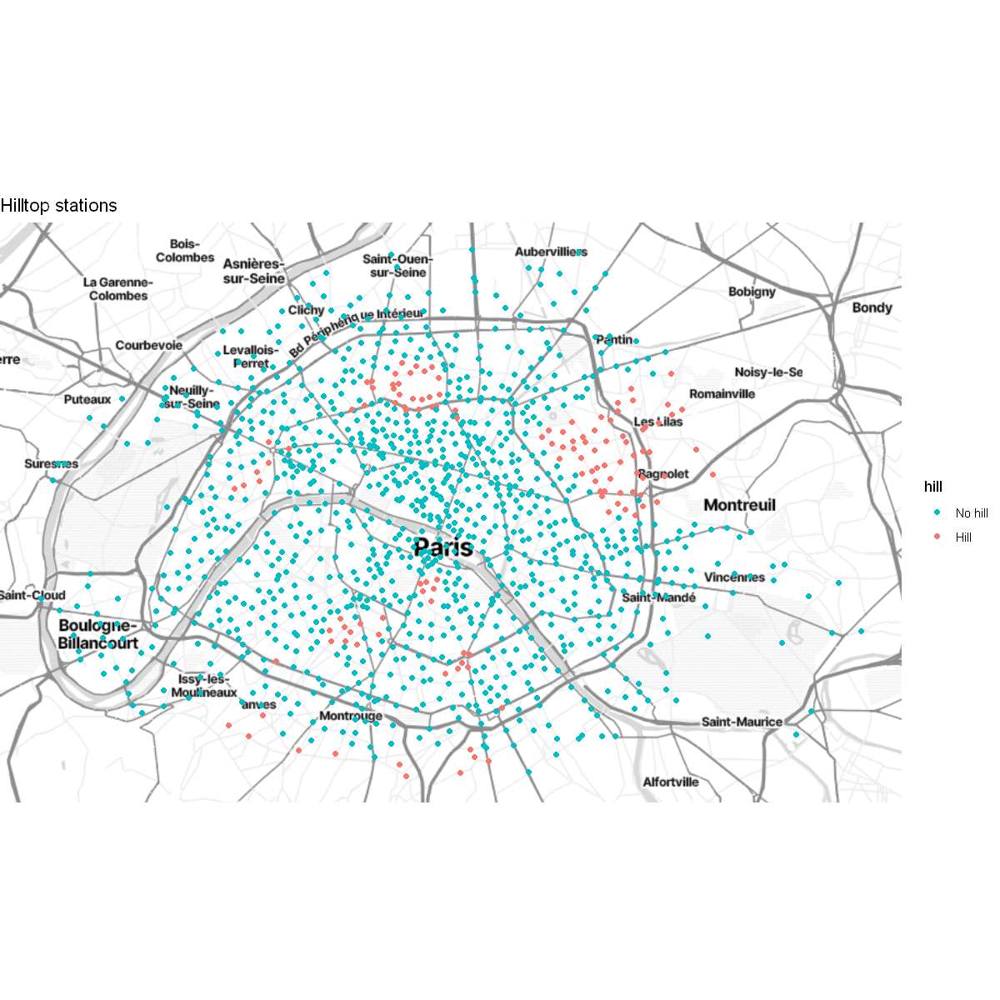

In [19]:
coord$hill = as.factor(coord$bonus)
levels(coord$hill) = c('No hill','Hill')

options(repr.plot.width = 10, repr.plot.height = 10)

qmplot(data=coord, longitude, latitude, color=hill) +
    scale_color_hue(direction = -1) +
    labs(title = 'Hilltop stations')

In [18]:
### plot d'un graph qui montre que les stations hill sont souvent vides

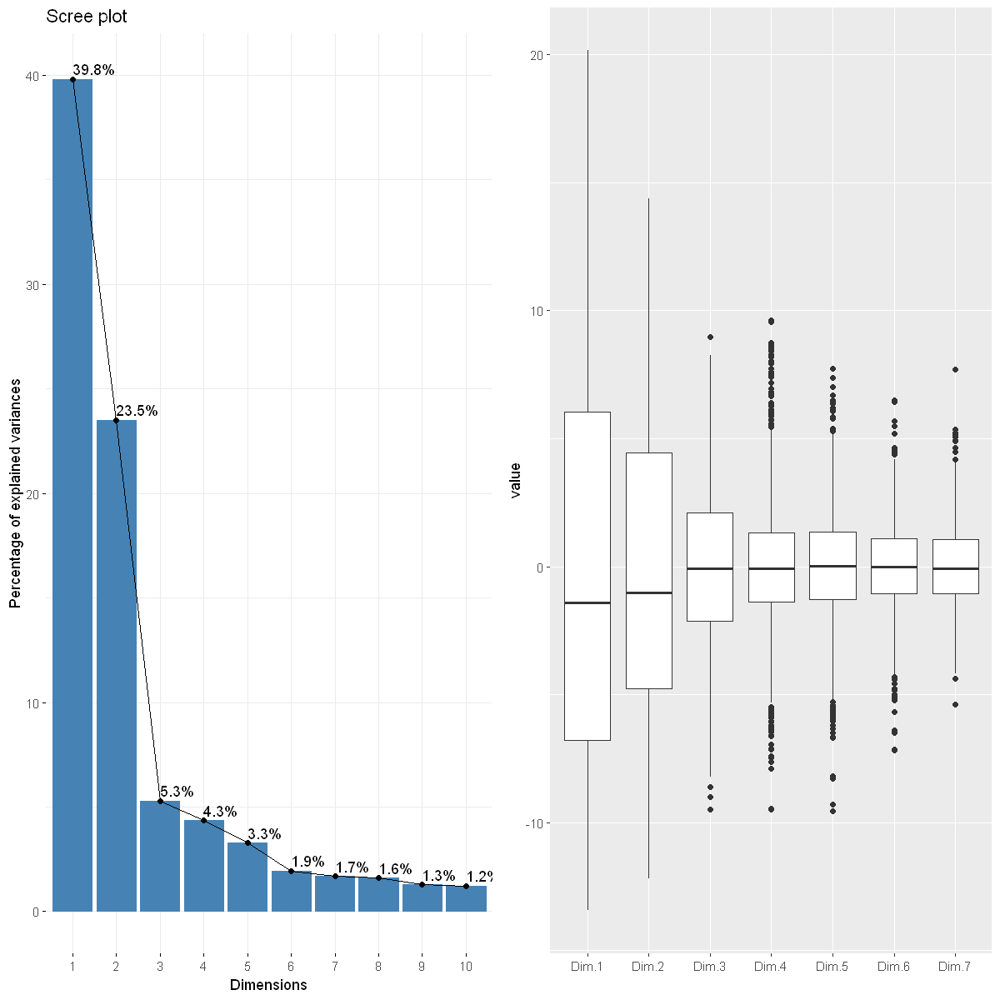

In [20]:
### ACP
loading <- as.data.frame(loading)
loading$Hill <- as.factor(coord$bonus)
acp <- PCA(loading, scale.unit = TRUE,
           graph = FALSE, quali.sup=169, ncp = 7)
g1<-fviz_eig(acp, addlabels = TRUE, ylim = c(0, 40))
g2<-ggplot(melt(acp$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

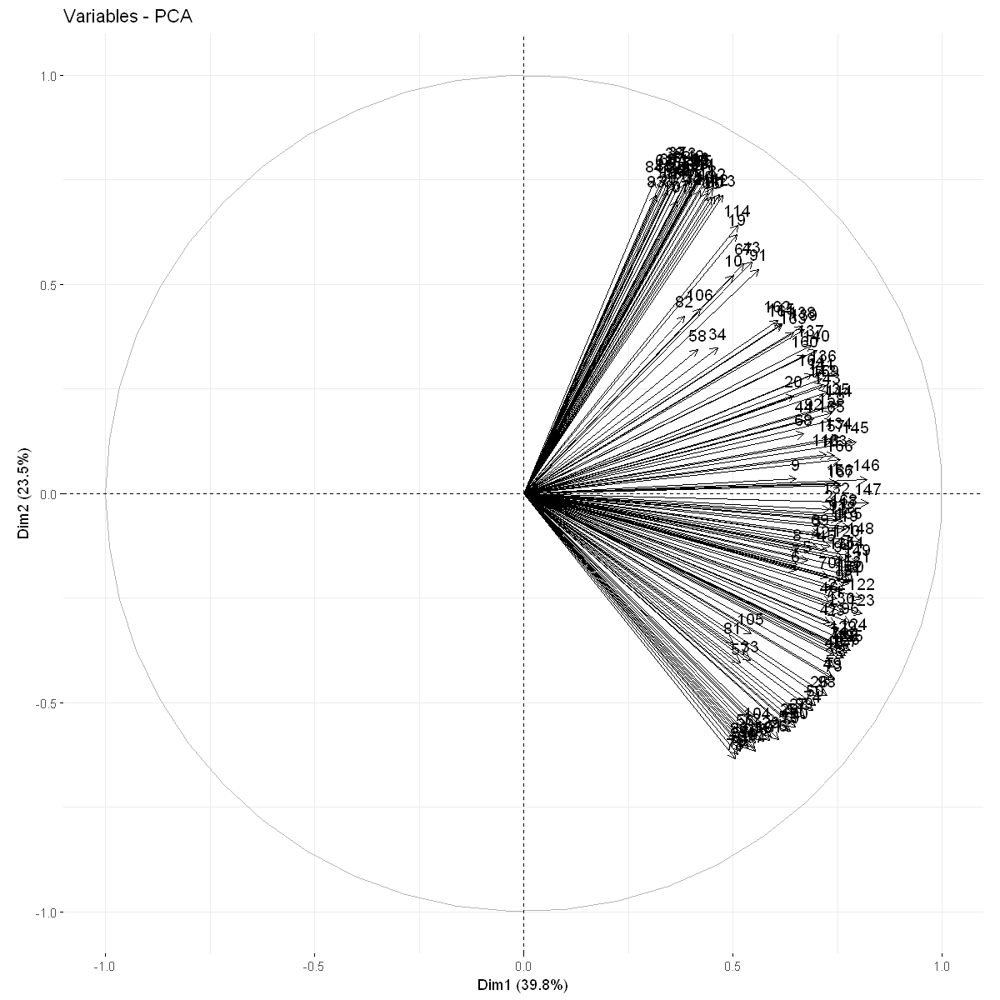

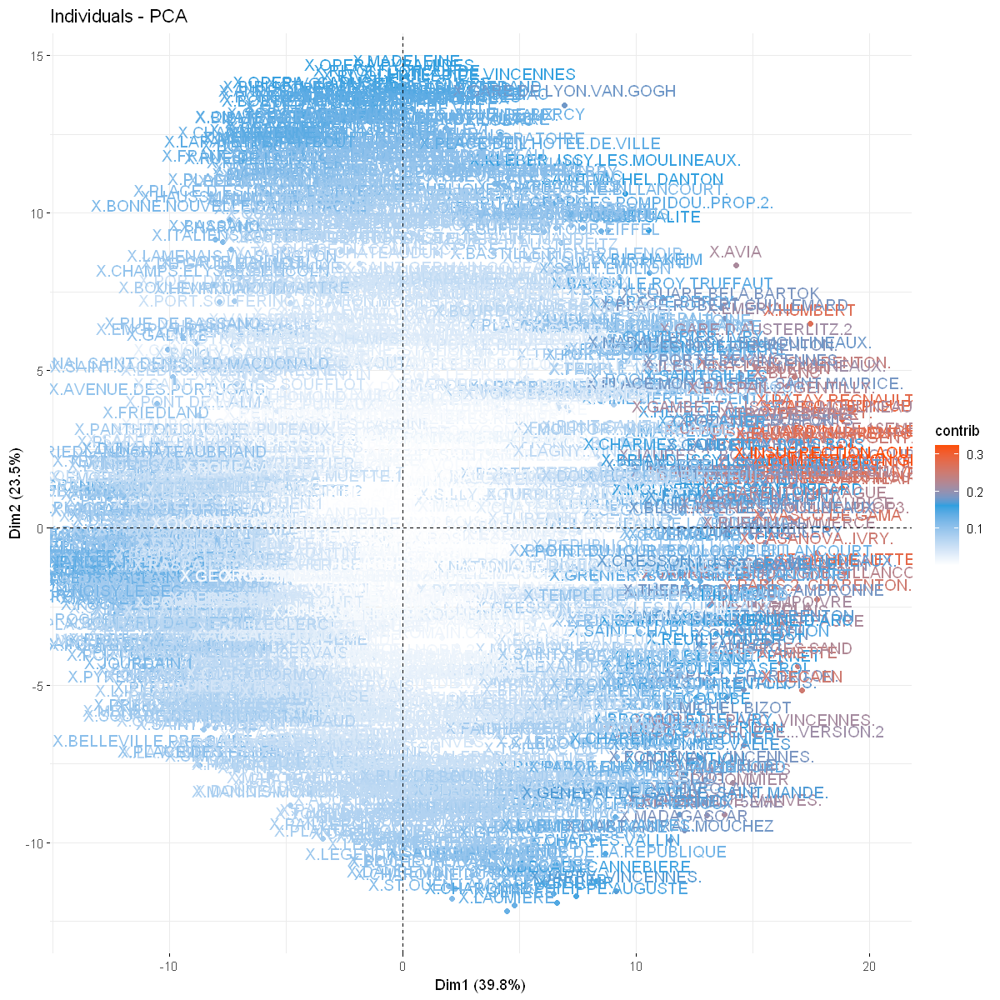

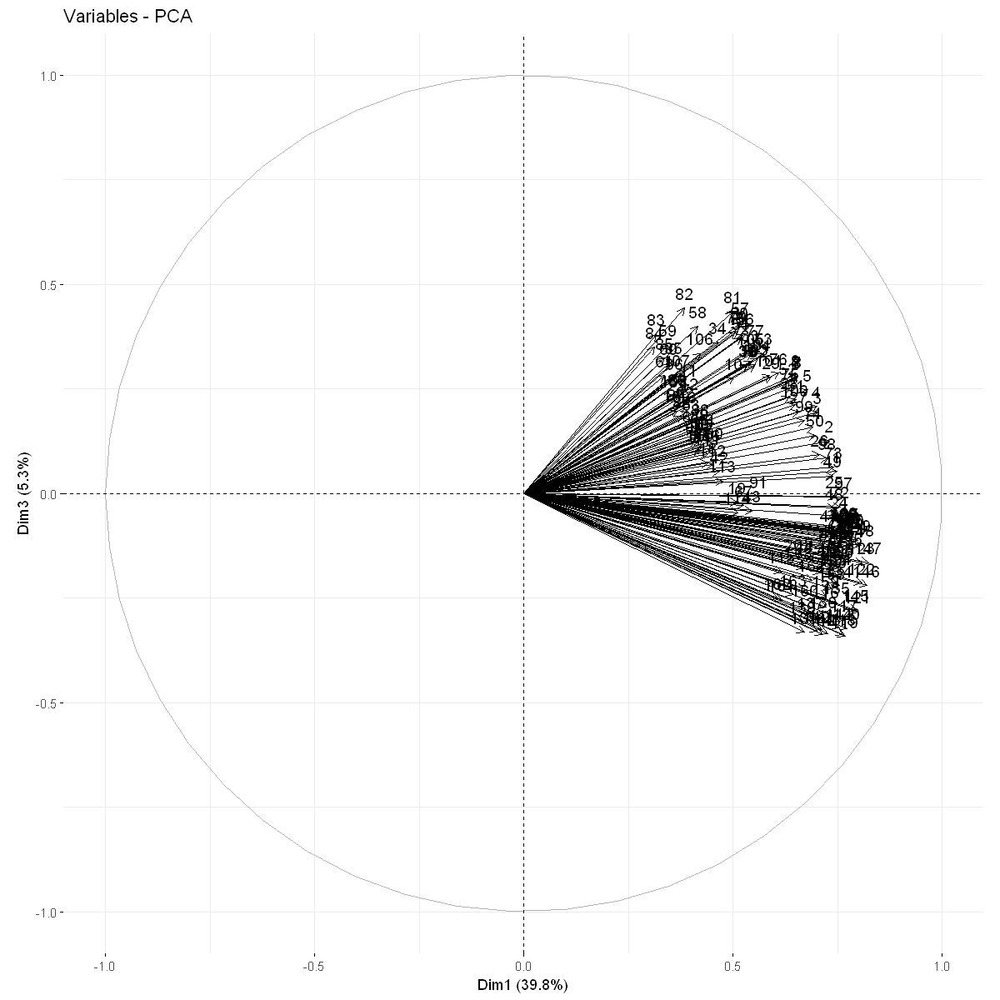

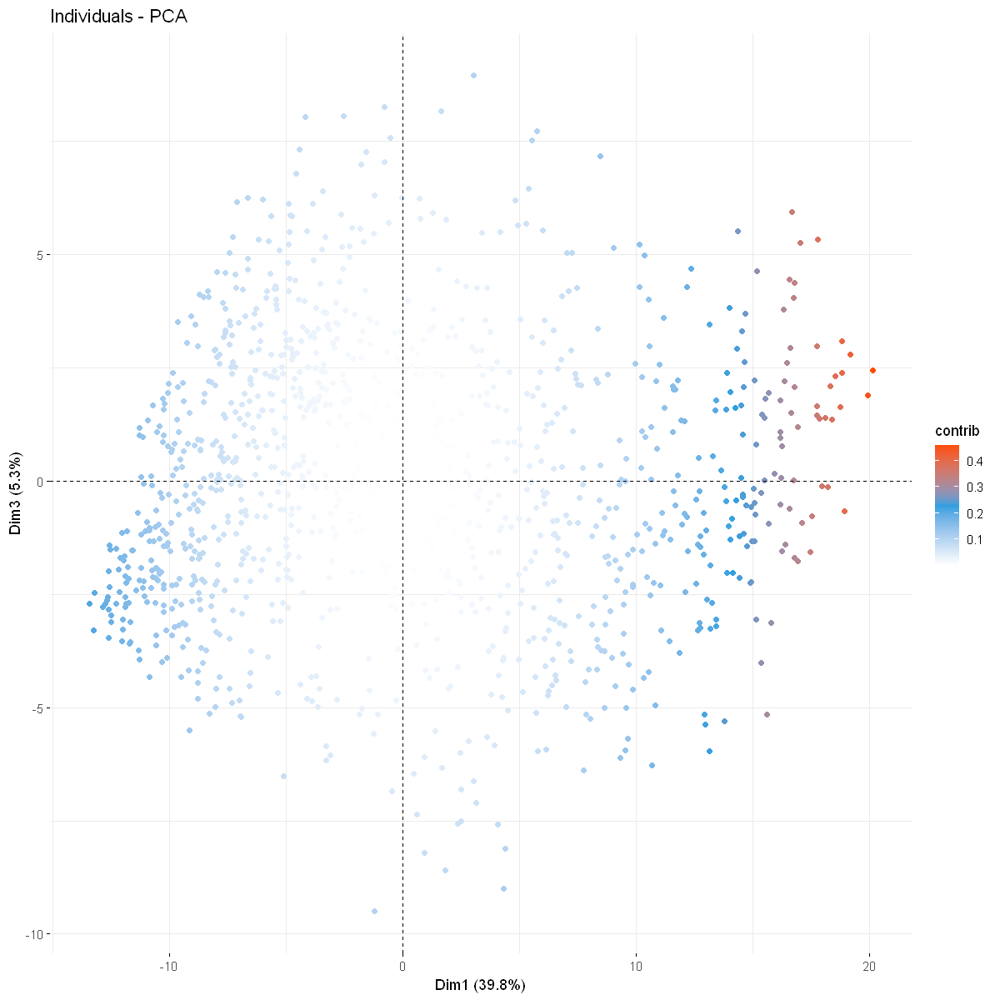

In [21]:
fviz_pca_var(acp, axes = c(1,2))
fviz_pca_ind(acp,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp,axes=c(1,3))
fviz_pca_ind(acp,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(1,3))

In [95]:
minuit_am <- rowMeans(loading[,c(1,25,49,73,97,121,145)])
une_am <- rowMeans(loading[,c(2,26,50,74,98,122,146)])
deux_am <- rowMeans(loading[,c(3,27,51,75,99,123,147)])
trois_am <- rowMeans(loading[,c(4,28,52,76,100,124,148)])
quatre_am <- rowMeans(loading[,c(5,29,53,77,101,125,149)])
cinq_am <- rowMeans(loading[,c(6,30,54,78,102,126,150)])
six_am <- rowMeans(loading[,c(7,31,55,79,103,127,151)])
sept_am <- rowMeans(loading[,c(8,32,56,80,104,128,152)])
huit_am <- rowMeans(loading[,c(9,33,57,81,105,129,153)])
neuf_am <- rowMeans(loading[,c(10,34,58,82,106,130,154)])
dix_am <- rowMeans(loading[,c(11,35,59,83,107,131,155)])
onze_am <- rowMeans(loading[,c(12,36,60,84,108,132,156)])
minuit_pm <- rowMeans(loading[,c(13,37,61,85,109,133,157)])
une_pm <- rowMeans(loading[,c(14,38,62,86,110,134,158)])
deux_pm <- rowMeans(loading[,c(15,39,63,87,111,135,159)])
trois_pm <- rowMeans(loading[,c(16,40,64,88,112,136,160)])
quatre_pm <- rowMeans(loading[,c(17,41,65,89,113,137,161)])
cinq_pm <- rowMeans(loading[,c(18,42,66,90,114,138,162)])
six_pm <- rowMeans(loading[,c(19,43,67,91,115,139,163)])
sept_pm <- rowMeans(loading[,c(20,44,68,92,116,140,164)])
huit_pm <- rowMeans(loading[,c(21,45,69,93,117,141,165)])
neuf_pm <- rowMeans(loading[,c(22,46,70,94,118,142,166)])
dix_pm <- rowMeans(loading[,c(23,47,71,95,119,143,167)])
onze_pm <- rowMeans(loading[,c(24,48,72,96,120,144,168)])
df1 <- data.frame(Minuit = minuit_am, "une h" = une_am, "2h" = deux_am, "3h" = trois_am, "4h" = quatre_am, "5h" = cinq_am, "6h" = six_am, "7h" = sept_am, "8h" = huit_am, "9h" = neuf_am
                 , "10h" = dix_am, "11h" = onze_am, "12h" = minuit_pm, "13h" = une_pm, "14h" = deux_pm, "15h" = trois_pm, "16h" = quatre_pm, "17h" = cinq_pm, "18h" = six_pm, 
                 "19h" = sept_pm, "20h" = huit_pm, "21h" = neuf_pm, "22h" = dix_pm, "23h" = onze_pm)

colnames(df1) <- list("0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h")
df1$Station <- velib$names
df1$Hill <- as.factor(coord$bonus)
df1$Station <- as.factor(df1$Station)
head(df1)

,0h,1h,2h,3h,4h,5h,6h,7h,8h,9h,⋯,16h,17h,18h,19h,20h,21h,22h,23h,Station,Hill
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
1,0.3174749,0.3316472,0.3639746,0.3839903,0.3951393,0.4000523,0.4106343,0.3843683,0.3996599,0.1249055,⋯,0.05158730,0.06216931,0.1724519,0.2515408,0.5242311,0.5019187,0.5754550,0.5119629,EURYALE DEHAYNIN,0
2,0.8385093,0.8260870,0.8074534,0.8198758,0.8260870,0.8260870,0.8260870,0.8136646,0.6956522,0.2298137,⋯,0.09937888,0.12422360,0.1431395,0.4409938,0.7204969,0.7391304,0.7888199,0.8074534,LEMERCIER,0
3,0.4757743,0.4134847,0.3914403,0.3887948,0.3756635,0.3548842,0.3522868,0.3524311,0.2828659,0.3371813,⋯,0.57743480,0.59124579,0.5814125,0.5651965,0.5287513,0.5691700,0.5728799,0.5572558,MEZIERES RENNES,0
4,0.2312925,0.2380952,0.2312925,0.2517007,0.2517007,0.2517007,0.2517007,0.2811791,0.4565826,0.7823129,⋯,0.73809524,0.63605442,0.2664399,0.2312925,0.2335601,0.2108844,0.2040816,0.1972789,FARMAN,0
5,0.5578916,0.5081458,0.4617051,0.4190691,0.3768585,0.3475134,0.3139657,0.3111874,0.3011764,0.4912834,⋯,0.74598169,0.73575961,0.6653876,0.5577936,0.4690331,0.5199493,0.5043376,0.5094532,QUAI DE LA RAPEE,0
6,0.4001035,0.4653209,0.4593685,0.4831781,0.4764493,0.4945652,0.5007764,0.4169255,0.3276398,0.1669255,⋯,0.21886447,0.26371636,0.1863354,0.4138199,0.3713768,0.4492754,0.4252070,0.4679089,CHOISY POINT D'IVRY,0


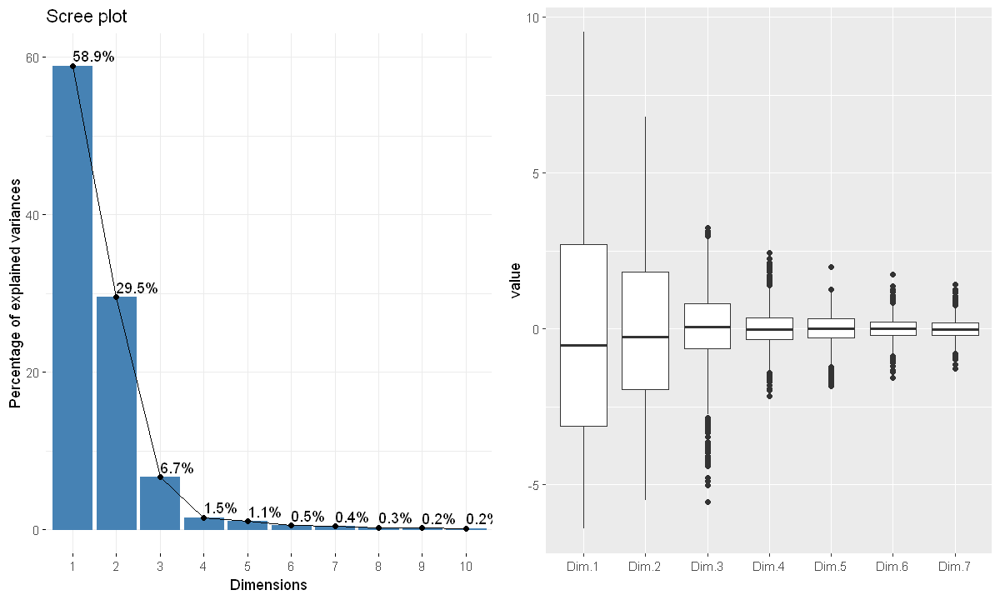

In [96]:
# ACP1
acp1 <- PCA(df1, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(25,26), ncp = 7)
g1<-fviz_eig(acp1, addlabels = TRUE, ylim = c(0, 60))
g2<-ggplot(melt(acp1$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

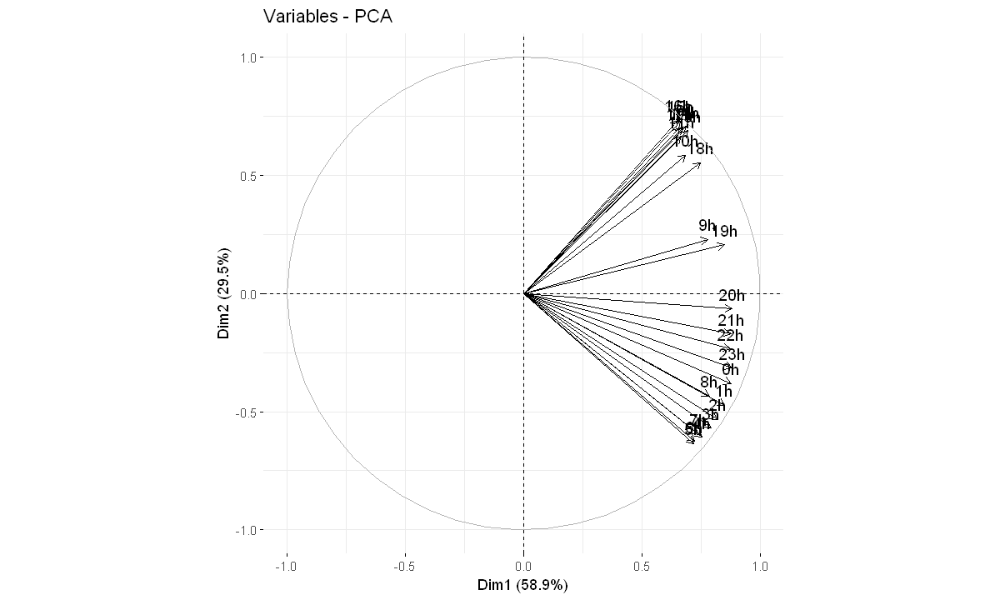

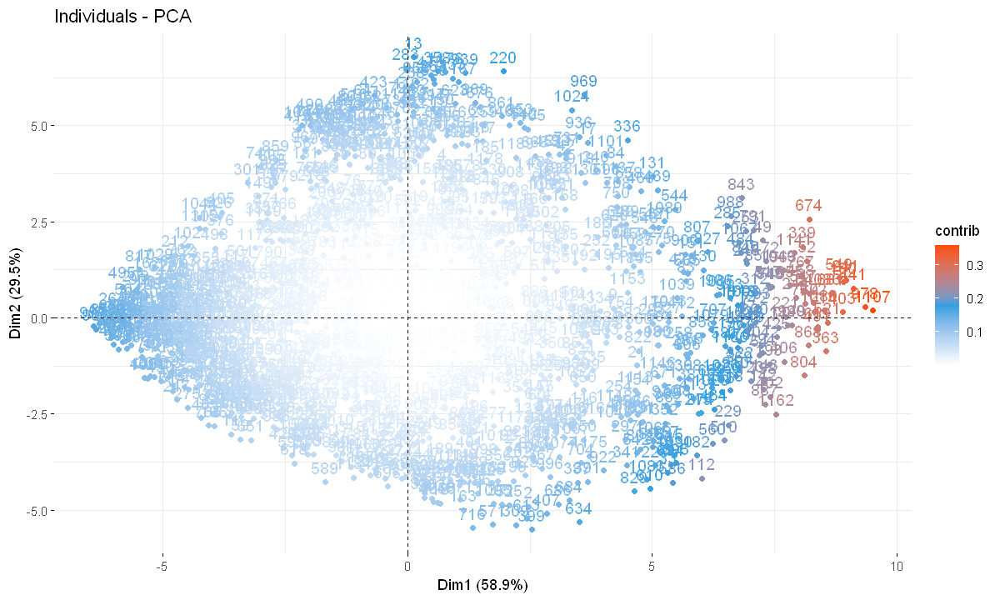

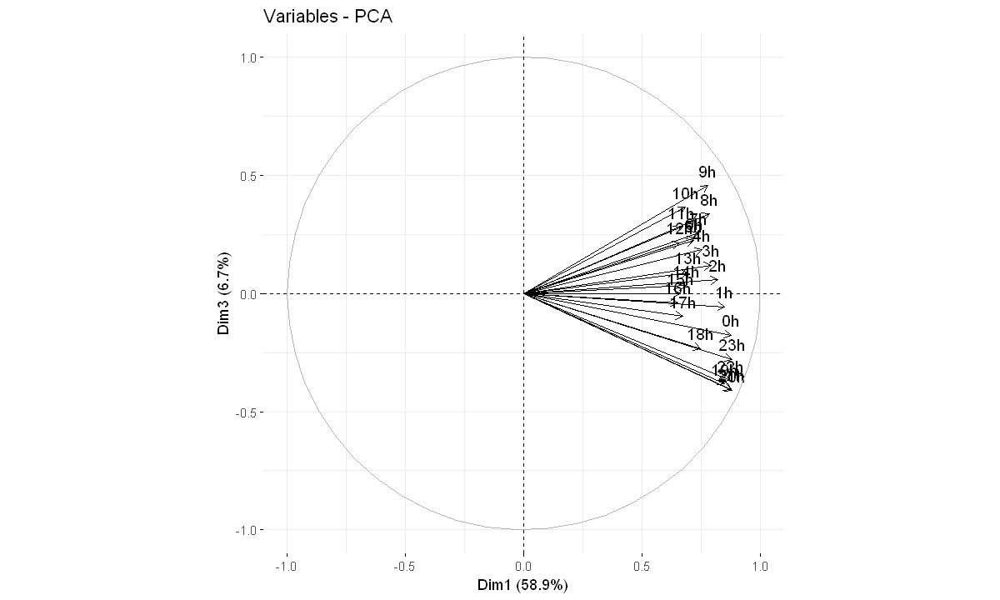

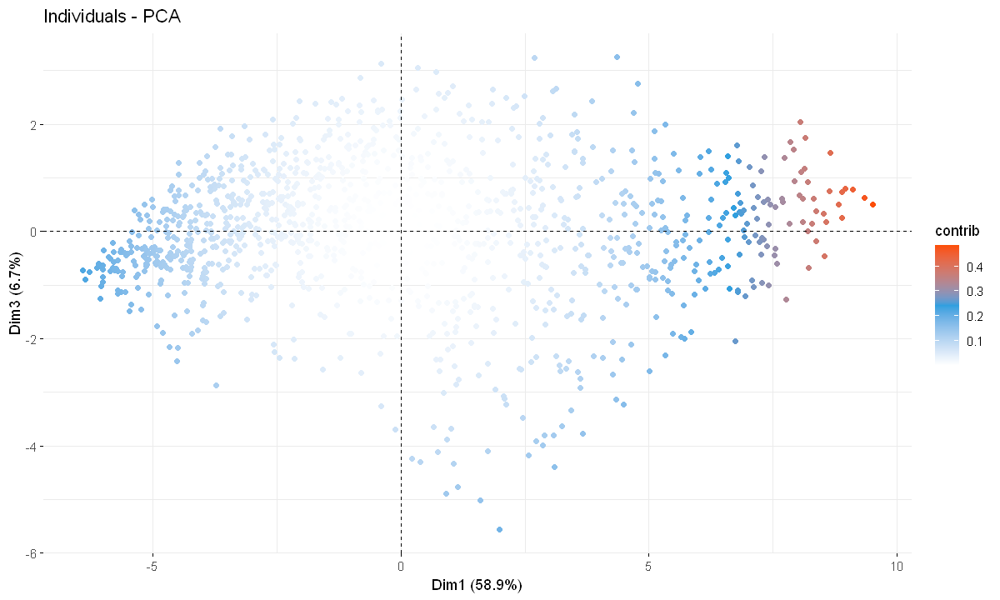

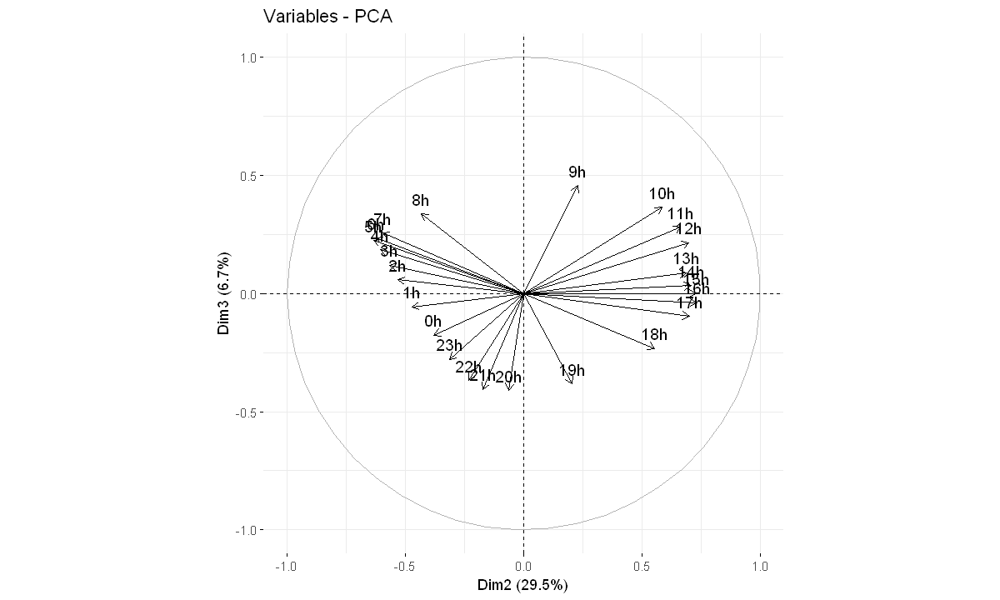

In [97]:
fviz_pca_var(acp1)
fviz_pca_ind(acp1,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp1,axes=c(1,3))
fviz_pca_ind(acp1,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(1,3))
fviz_pca_var(acp1,axes=c(2,3))

In [ ]:
### dim 1 : stations chargées ou pas
### dim 2 : diff jour/nuit
### dim 3 : exprime à quelle heures les loading changent le +
### en haut : l'heure ou on  va bosser
### en bas : l'heure ou on rentre du travail

In [25]:
lundi <- rowMeans(loading[,c(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24)])
mardi <- rowMeans(loading[,c(25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48)])
mercredi <- rowMeans(loading[,c(49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72)])
jeudi <- rowMeans(loading[,c(73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96)])
vendredi <- rowMeans(loading[,c(97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120)])
samedi <- rowMeans(loading[,c(121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144)])
dimanche <- rowMeans(loading[,c(145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168)])

df2 <- data.frame(lundi,mardi,mercredi,jeudi,vendredi,samedi,dimanche)

colnames(df2) <- list("Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche")
df2$Station <- velib$names
df2$Station <- as.factor(df2$Station)
df2$Hill <- as.factor(coord$bonus)
head(df2)

,Lundi,Mardi,Mercredi,Jeudi,Vendredi,Samedi,Dimanche,Station,Hill
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
X.EURYALE.DEHAYNIN,0.1111493,0.2964616,0.3785273,0.3613867,0.4185957,0.2448192,0.1340812,EURYALE DEHAYNIN,0
X.LEMERCIER,0.3423913,0.5797101,0.5108696,0.5724638,0.5289855,0.6050725,0.4040679,LEMERCIER,0
X.MEZIERES.RENNES,0.2738741,0.6266798,0.3893939,0.4568182,0.5717312,0.5321409,0.4166667,MEZIERES RENNES,0
X.FARMAN,0.7599206,0.3670635,0.3091931,0.3302599,0.3115079,0.3115079,0.6527778,FARMAN,0
X.QUAI.DE.LA.RAPEE,0.7366092,0.6083758,0.5507157,0.4502161,0.5980819,0.3568320,0.4084596,QUAI DE LA RAPEE,0
X.CHOISY.POINT.D.IVRY,0.2031250,0.4548611,0.3645833,0.3489583,0.2588315,0.6255284,0.1678512,CHOISY POINT D'IVRY,0


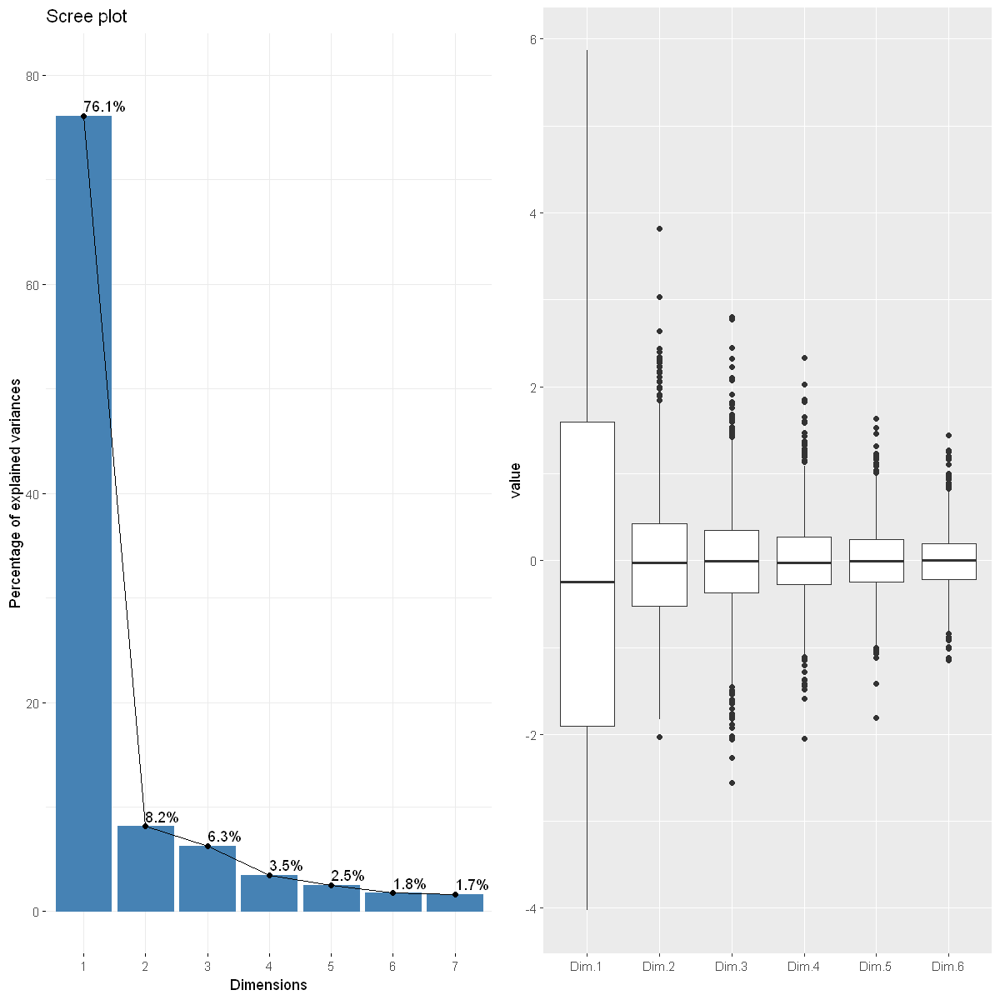

In [26]:
# ACP réduite
acp2 <- PCA(df2, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(8,9), ncp = 6)
g1<-fviz_eig(acp2, addlabels = TRUE, ylim = c(0, 80))
g2<-ggplot(melt(acp2$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

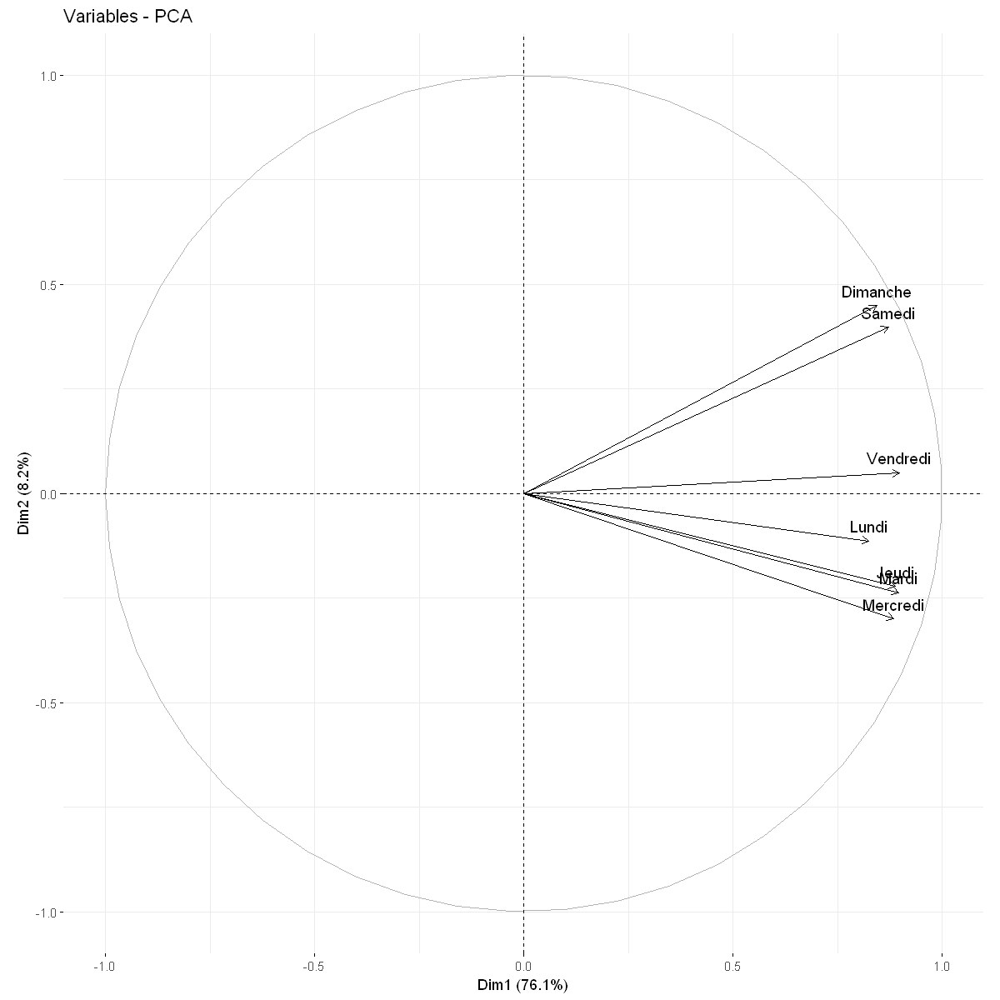

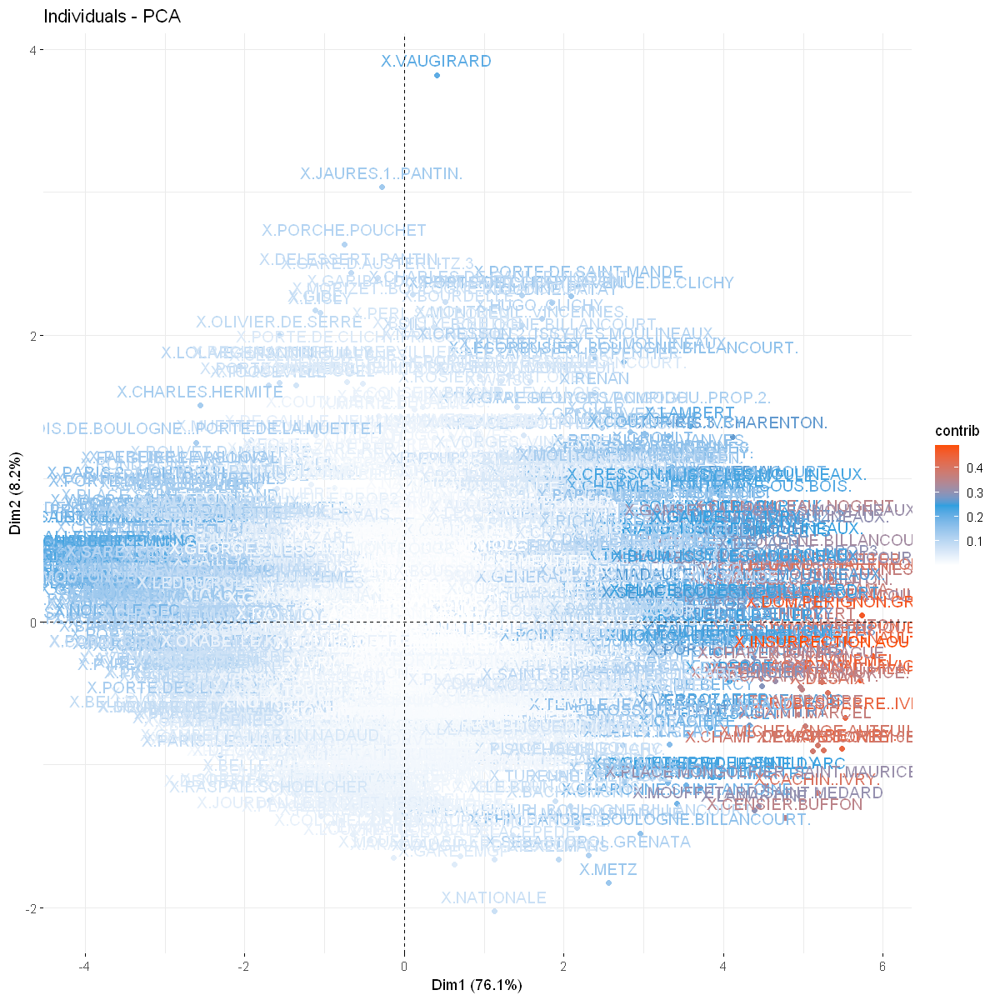

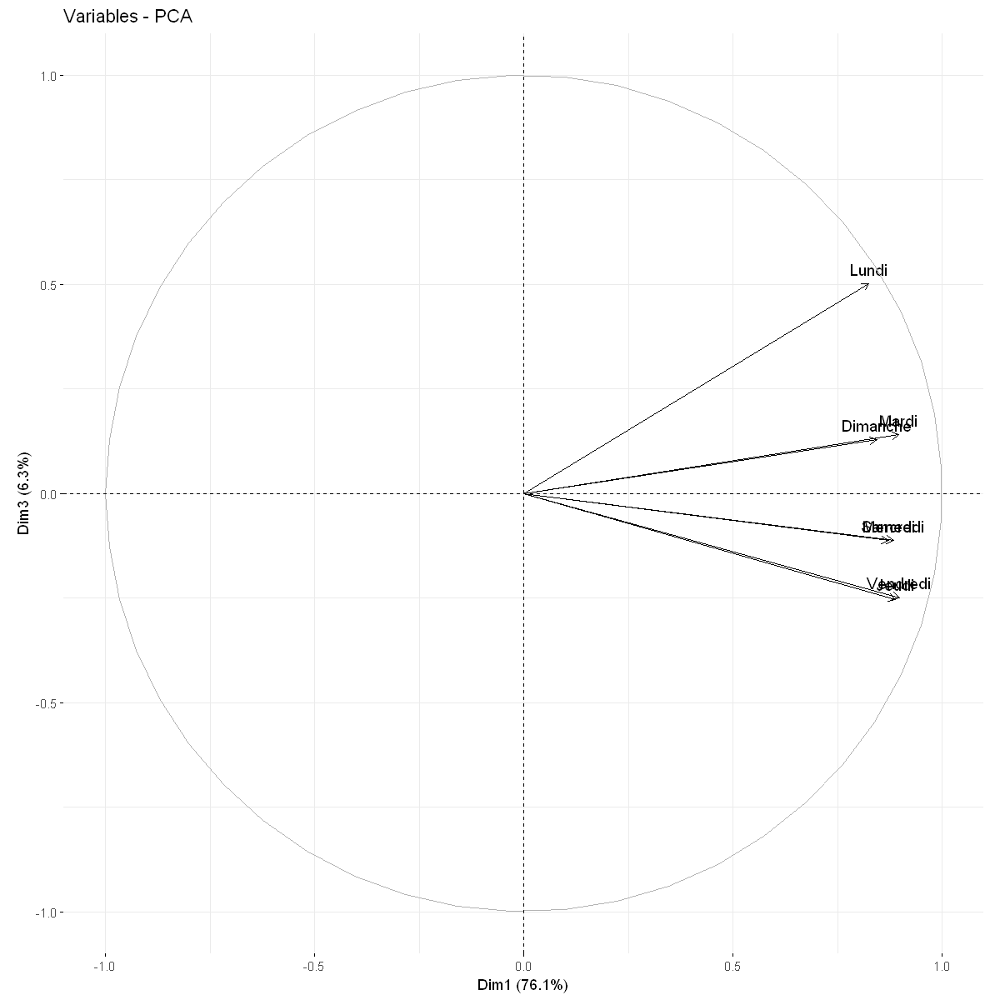

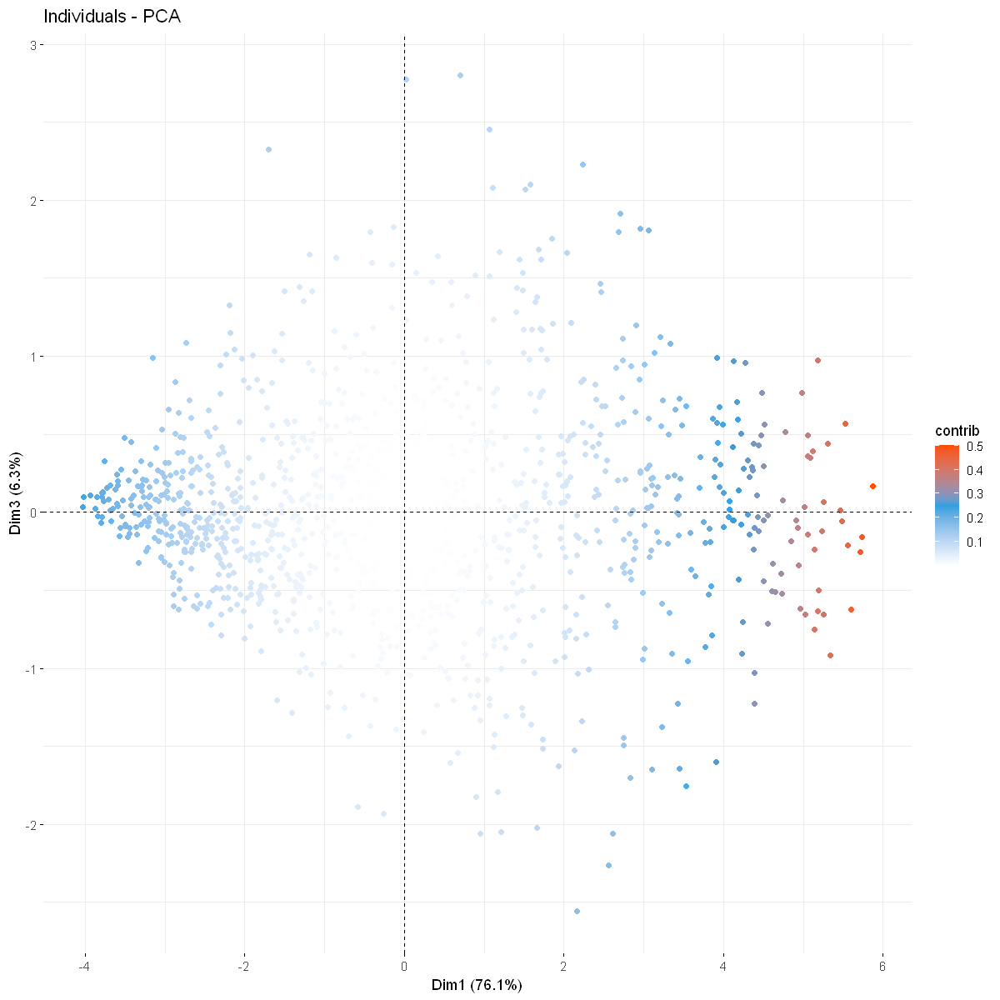

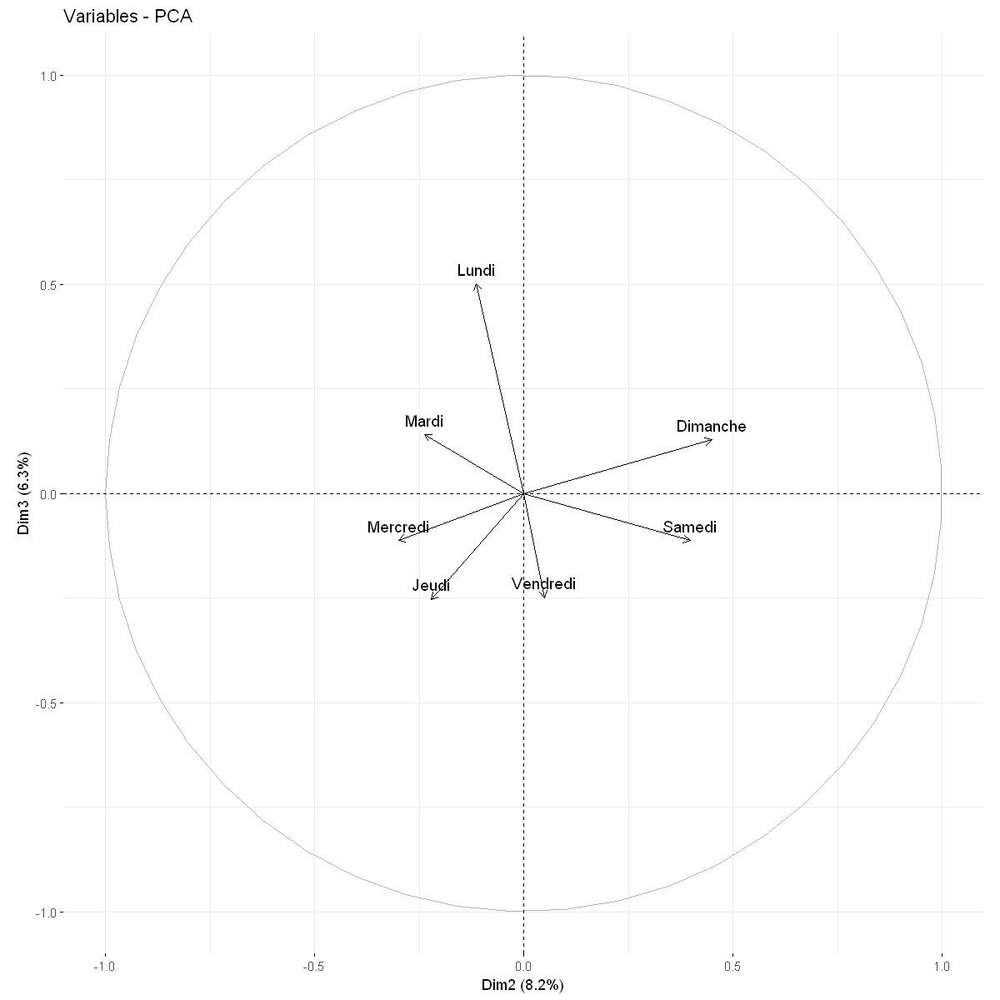

In [27]:
fviz_pca_var(acp2)
fviz_pca_ind(acp2,col.ind="contrib",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ))
fviz_pca_var(acp2,axes=c(1,3))
fviz_pca_ind(acp2,col.ind="contrib",label="none",gradient.cols = c("white", "#2E9FDF", "#FC4E07" ),axes=c(1,3))
fviz_pca_var(acp2,axes=c(2,3))

In [28]:
library(cluster)

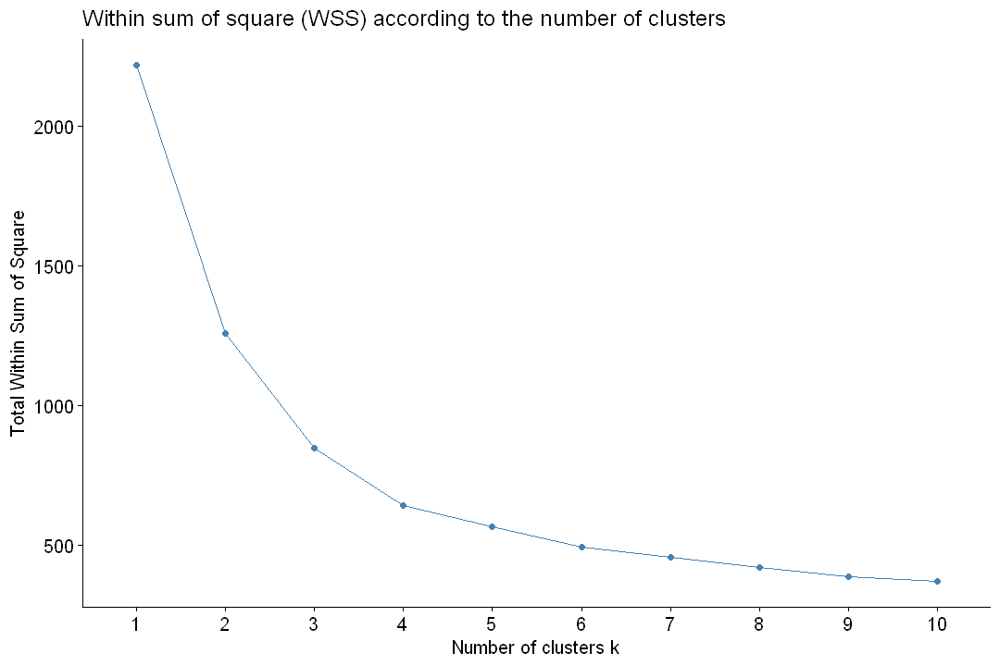

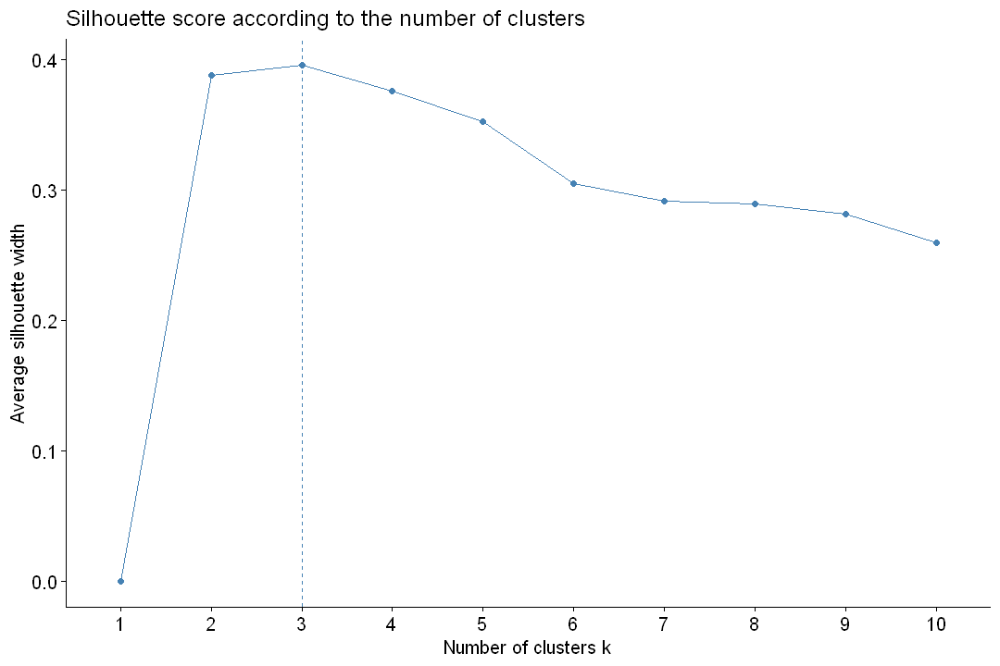

In [98]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_nbclust(df1[,-c(25,26)], FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(df1[,-c(25,26)], FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

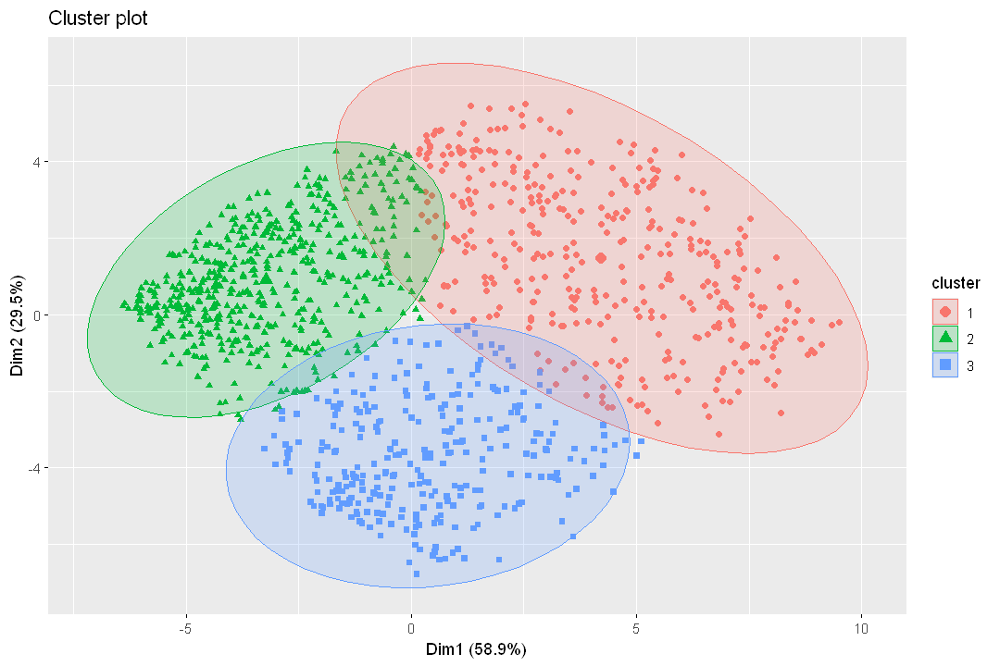

In [30]:
reskmeans = kmeans(df1[,-c(25,26)], centers=3) 

fviz_cluster(reskmeans, data=df1[,-c(25,26)], ellipse.type="norm", labelsize=8, geom=c("point"))

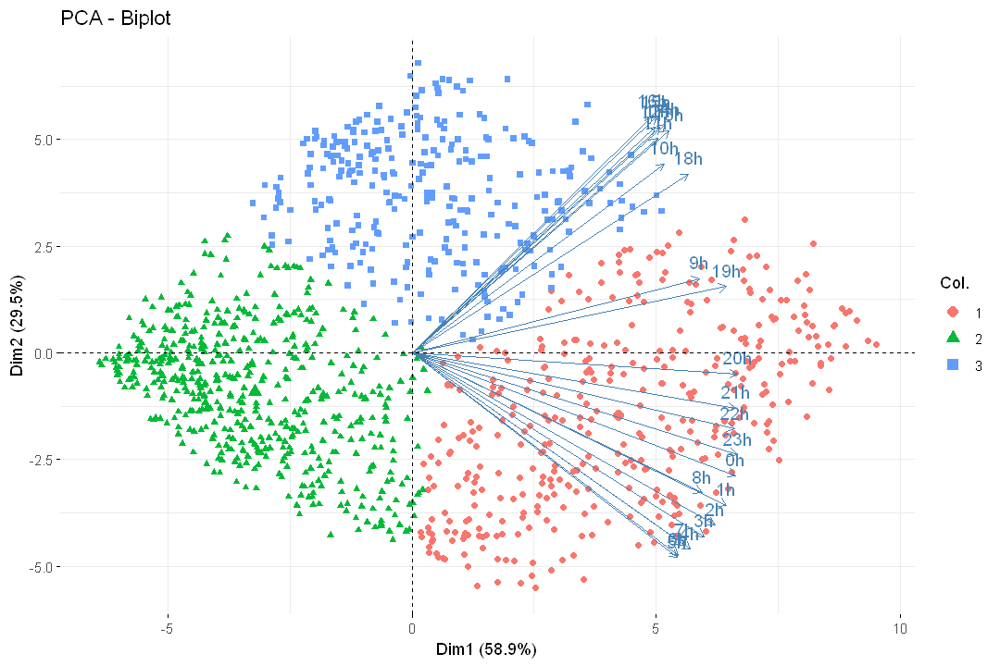

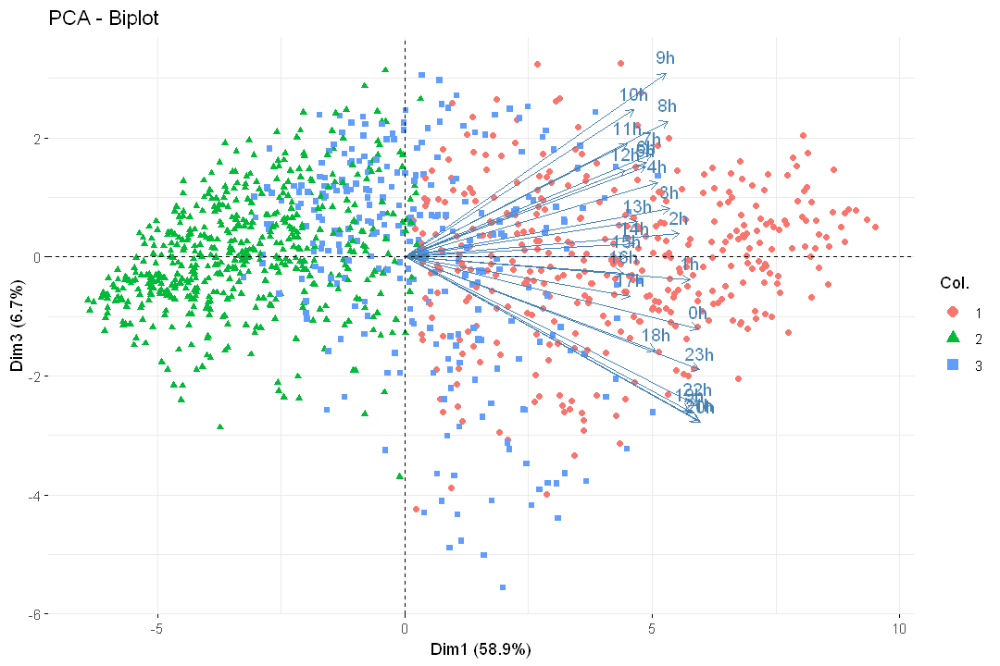

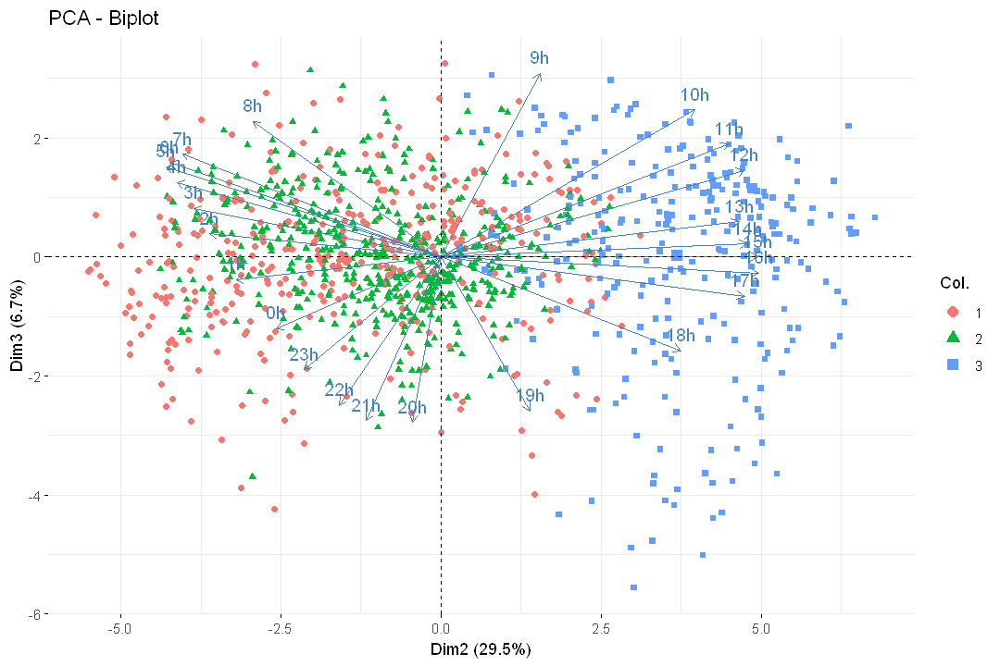

In [31]:
options(repr.plot.width = 9, repr.plot.height = 6)

fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(reskmeans$cluster))
fviz_pca(acp1, axes=c(1,3), geom=c("point"), col.ind=as.factor(reskmeans$cluster))
fviz_pca(acp1, axes=c(2,3), geom=c("point"), col.ind=as.factor(reskmeans$cluster))

In [36]:
cluster_palette <- colorFactor(c("#E41A1C","#4DAF4A","#377EB8"), domain = unique(reskmeans$cluster))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(reskmeans$cluster),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~reskmeans$cluster,
            title = "Cluster",
            opacity = 1)
### fixer la carte ou pas ? légende sur le nom de la station quand on passe la souris dessus

HTML widgets cannot be represented in plain text (need html)

In [ ]:
### vert : stations vides plutôt en périphérie : lieux sans activité particulière
### bleu : stations pleines le jour en centre ville : lieux touristiques ou de travail 
### rouge : stations pleines la nuit en périph proche du centre : lieux de divertissement nocture ou résidence

In [ ]:
## les arbres donnent des résultats similaires, réduit le cluster bleu

In [101]:
library(mclust)

Package 'mclust' version 6.1
Type 'citation("mclust")' for citing this R package in publications.


Attachement du package : 'mclust'


L'objet suivant est masqué depuis 'package:htmltools':

    em


L'objet suivant est masqué depuis 'package:purrr':

    map




Best BIC values:
            VVE,8       VVE,9       VVE,6
BIC      11490.13 11457.43977 11453.86104
BIC diff     0.00   -32.68555   -36.26428

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVE (ellipsoidal, equal orientation) model with 8 components: 

 log-likelihood    n  df      BIC      ICL
       8106.532 1189 667 11490.13 11281.97

Clustering table:
  1   2   3   4   5   6   7   8 
161 254 310  67  66 127 102 102 

Warning message:
"`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>."


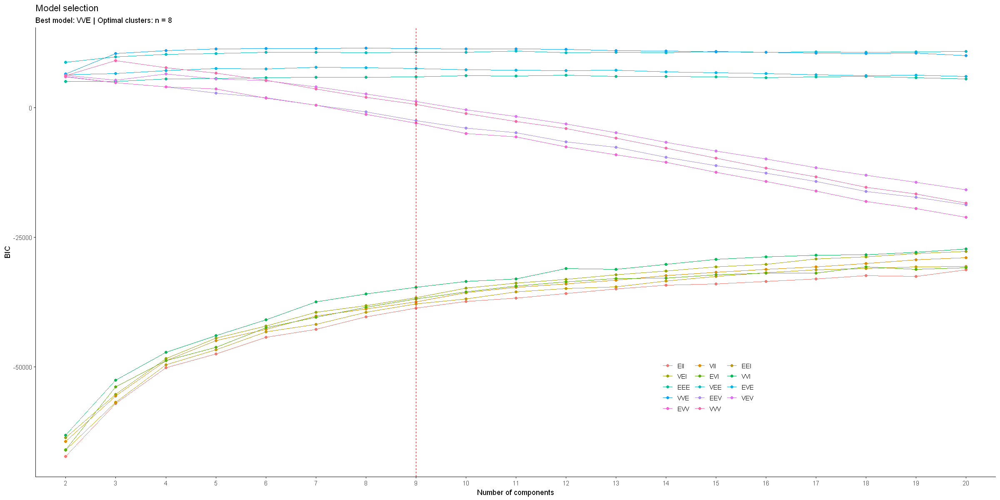

In [104]:
resBICall = mclustBIC(df1[,-c(25,26)], G=2:20)
summary(resBICall)

# --- #

resBICall = Mclust(df1[,-c(25,26)], G=2:20)
summary(resBICall)


fviz_mclust(resBICall, what="BIC")

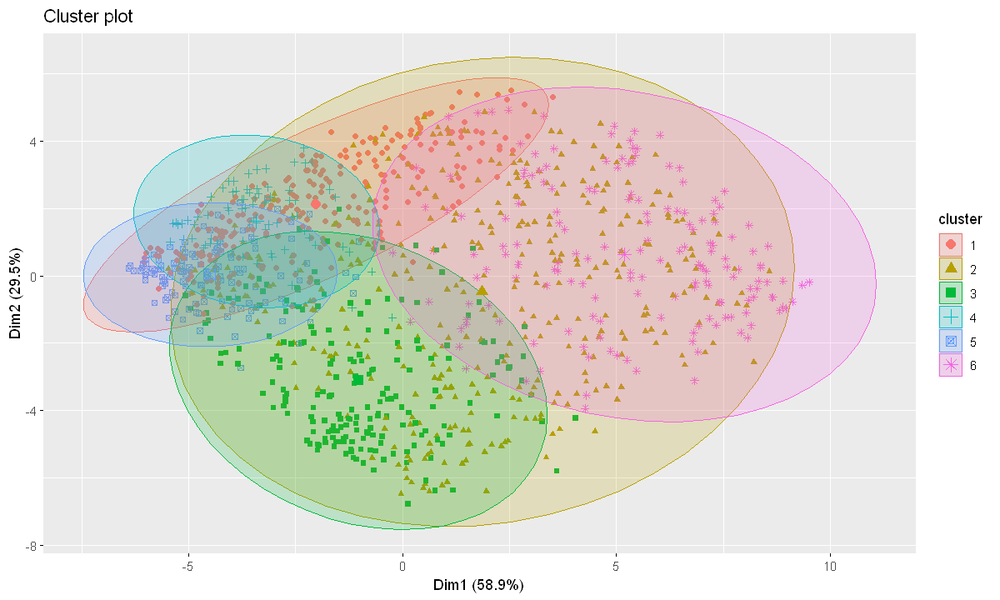

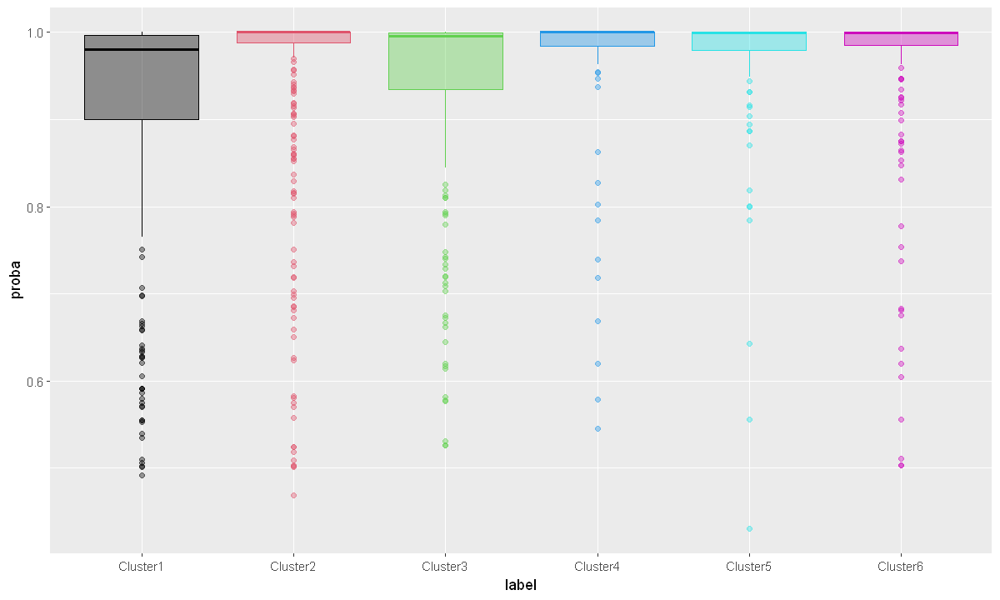

In [102]:
options(repr.plot.width = 10, repr.plot.height = 6)
resBIC = Mclust(df1[,-c(25,26)], G=6, modelNames = "VVE")
fviz_cluster(resBIC, data=df1[,-c(25,26)], ellipse.type="norm", geom="point")

# --- #

aux = data.frame(
    label = paste("Cluster", resBIC$classification, sep=""), 
    proba = apply(resBIC$z, 1, max))

ggplot(aux, aes(x=label, y=proba)) + 
    geom_boxplot(colour=1:6, fill=1:6, alpha=.4)

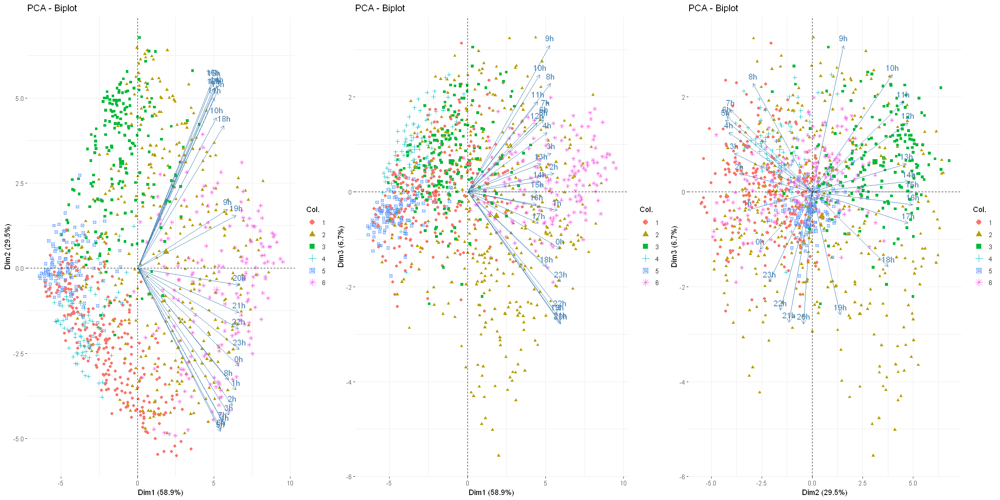

In [103]:
options(repr.plot.width = 20, repr.plot.height = 10)

grid.arrange(
    fviz_pca(acp1, axes=c(1,2), geom = c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp1, axes=c(1,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    fviz_pca(acp1, axes=c(2,3), geom=c("point"), col.ind=as.factor(resBIC$classification)),
    ncol=3
)

In [41]:
cluster_palette <- colorFactor(c("#E41A1C","#377EB8","#4DAF4A","#FF7F00","#984EA3","#FF33CC"), domain = unique(resBIC$classification))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(resBIC$classification),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~resBIC$classification,
            title = "Cluster",
            opacity = 1)
### pareil que pour la première carte

HTML widgets cannot be represented in plain text (need html)

In [ ]:
### cluster 1 : globalement vides, et plutot pleines la nuit (début de nuit)
### cluster 2 : tout le temps pleines, de jour comme de nuit 
### cluster 3 : globalement vides, et plutot pleines le jour
### cluster 4 : =1, mais pleines en fin de nuit
### cluster 5 : tout le temps vides
### cluster 6 : très pleines la nuit plus soirée

###" TABLEAU :
###          jour    nuit
### plein    2     2,6
### vide     3      1,4       5 : tout le temps vides

In [42]:
contingency_table <- table(reskmeans$cluster, resBIC$classification)
contingency_table

   
      1   2   3   4   5   6
  1  47 175   2   0   0 154
  2 207  78  36  78 122   8
  3   0 126 134   1   0  21

In [15]:
library(gplots)
library(graphics)


Attachement du package : 'gplots'


L'objet suivant est masqué depuis 'package:stats':

    lowess




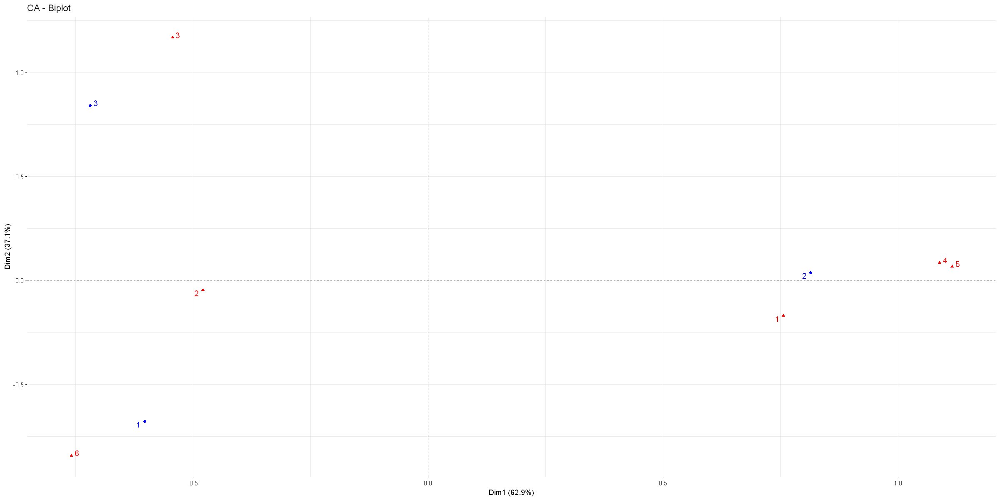

In [44]:
res.ca = CA(contingency_table, graph=FALSE)
fviz_ca_biplot(res.ca, repel=TRUE)

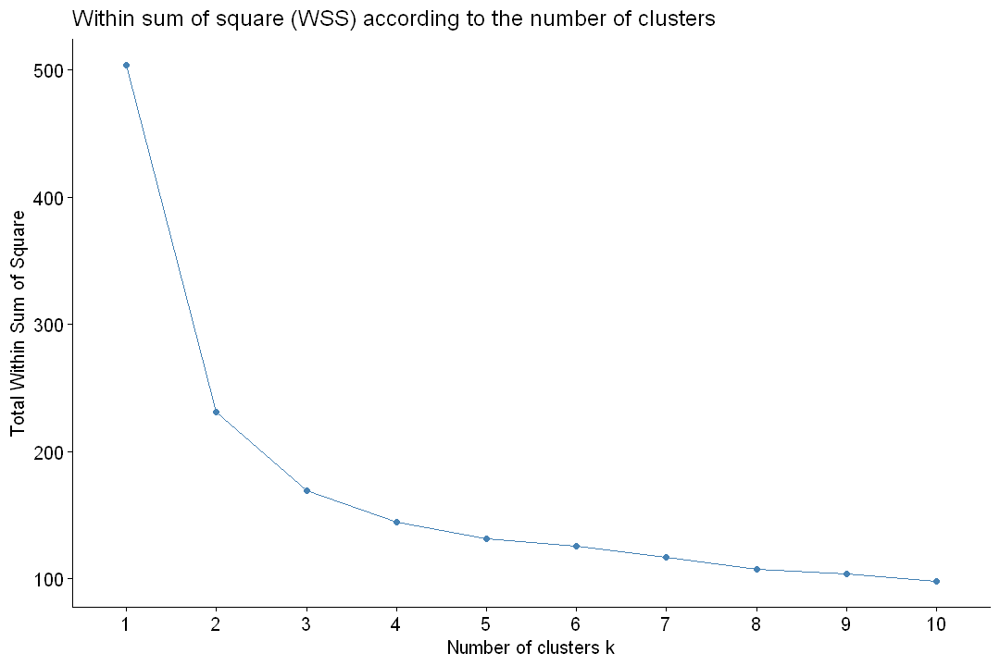

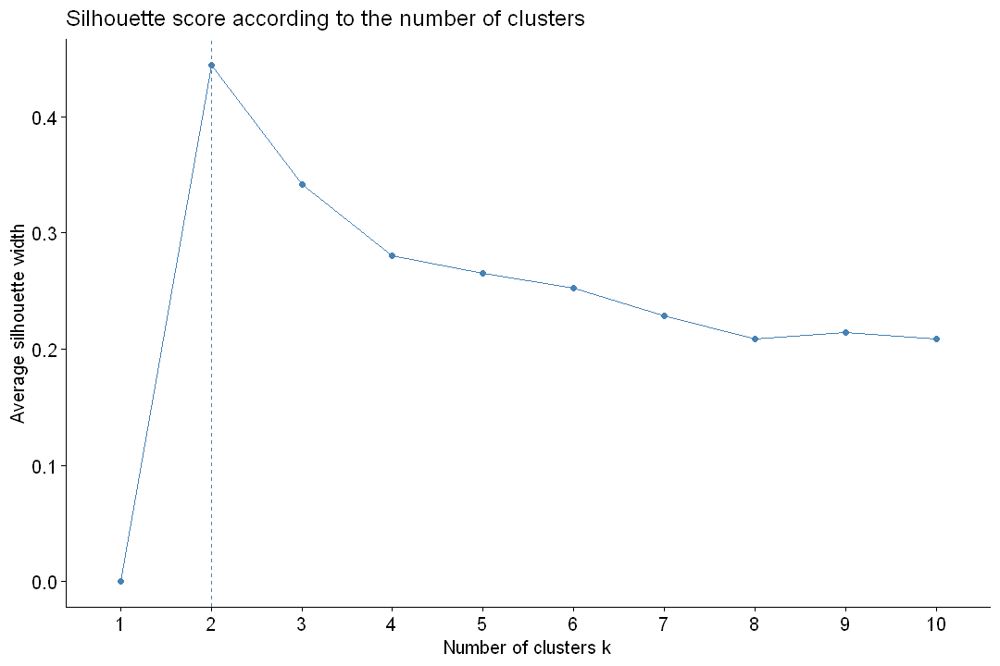

In [45]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_nbclust(df2[,-c(8,9)], FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(df2[,-c(8,9)], FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

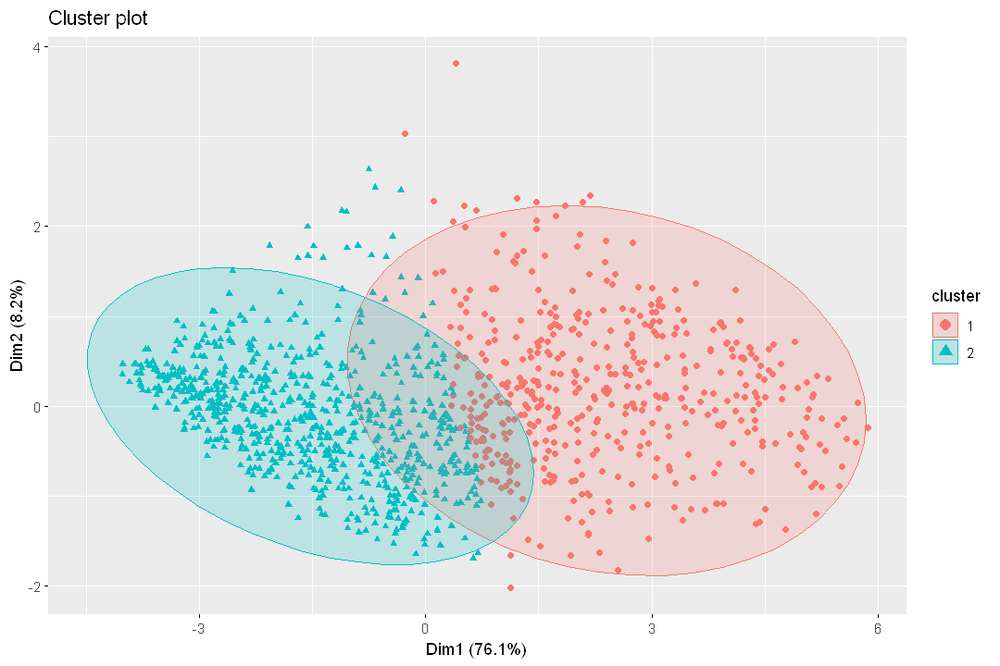

In [46]:
reskmeans = kmeans(df2[,-c(8,9)], centers=2) 

fviz_cluster(reskmeans, data=df2[,-c(8,9)], ellipse.type="norm", labelsize=8, geom=c("point"))

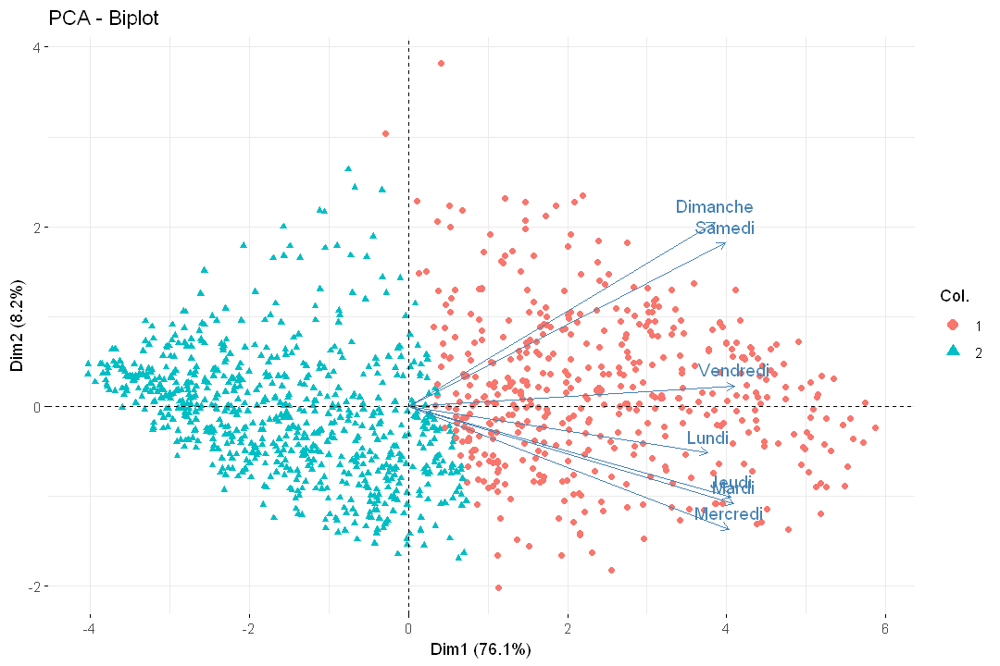

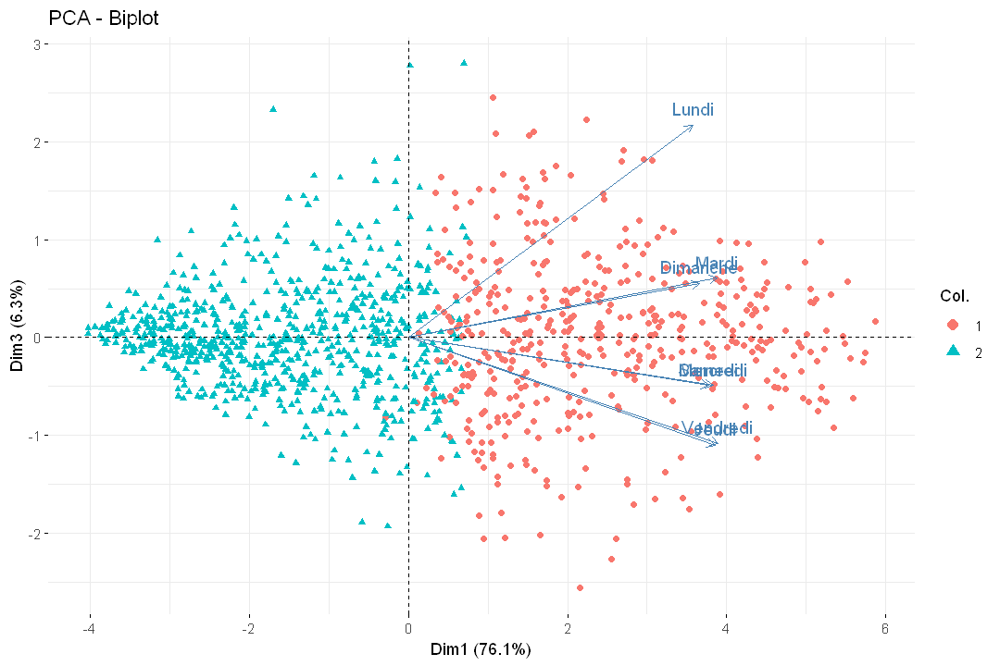

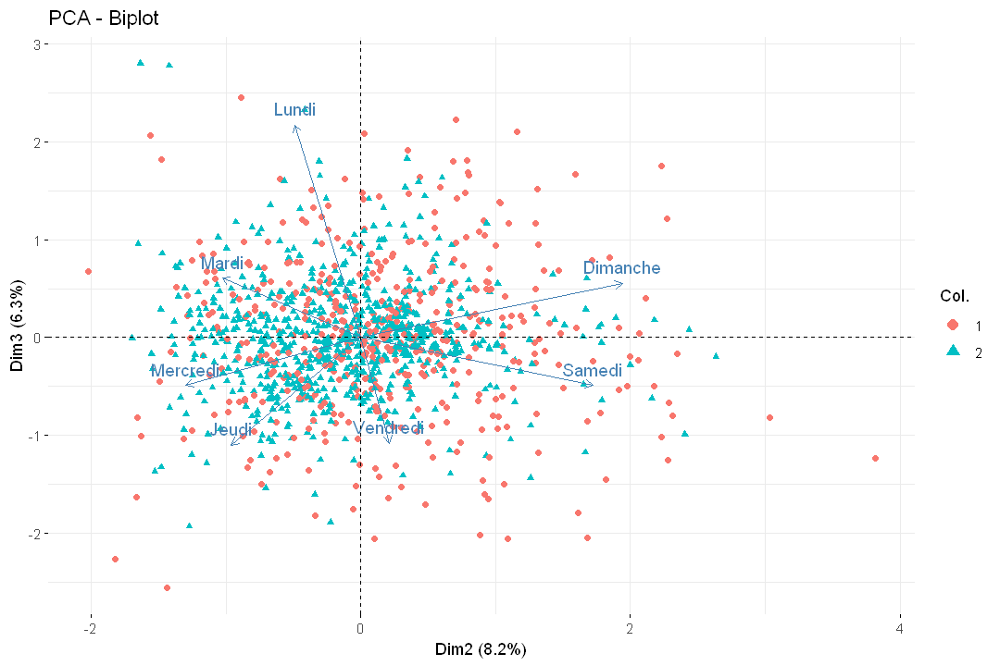

In [47]:
options(repr.plot.width = 9, repr.plot.height = 6)

fviz_pca(acp2, axes=c(1,2), geom = c("point"), col.ind=as.factor(reskmeans$cluster)) 
fviz_pca(acp2, axes=c(1,3), geom=c("point"), col.ind=as.factor(reskmeans$cluster))
fviz_pca(acp2, axes=c(2,3), geom=c("point"), col.ind=as.factor(reskmeans$cluster))

In [48]:
cluster_palette <- colorFactor(c("#E41A1C","#4DAF4A","#377EB8"), domain = unique(reskmeans$cluster))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(reskmeans$cluster),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~reskmeans$cluster,
            title = "Cluster",
            opacity = 1)
### pareil

HTML widgets cannot be represented in plain text (need html)

In [ ]:
### le glm fait la même chose, partitionne les stations du plus au moins vides, seulement avec + de clusters (8)

In [129]:
minuit_am <- rowMeans(loading[,c(1,25,49,73,97,121,145)])
une_am <- rowMeans(loading[,c(2,26,50,74,98,122,146)])
deux_am <- rowMeans(loading[,c(3,27,51,75,99,123,147)])
trois_am <- rowMeans(loading[,c(4,28,52,76,100,124,148)])
quatre_am <- rowMeans(loading[,c(5,29,53,77,101,125,149)])
cinq_am <- rowMeans(loading[,c(6,30,54,78,102,126,150)])
six_am <- rowMeans(loading[,c(7,31,55,79,103,127,151)])
sept_am <- rowMeans(loading[,c(8,32,56,80,104,128,152)])
huit_am <- rowMeans(loading[,c(9,33,57,81,105,129,153)])
neuf_am <- rowMeans(loading[,c(10,34,58,82,106,130,154)])
dix_am <- rowMeans(loading[,c(11,35,59,83,107,131,155)])
onze_am <- rowMeans(loading[,c(12,36,60,84,108,132,156)])
minuit_pm <- rowMeans(loading[,c(13,37,61,85,109,133,157)])
une_pm <- rowMeans(loading[,c(14,38,62,86,110,134,158)])
deux_pm <- rowMeans(loading[,c(15,39,63,87,111,135,159)])
trois_pm <- rowMeans(loading[,c(16,40,64,88,112,136,160)])
quatre_pm <- rowMeans(loading[,c(17,41,65,89,113,137,161)])
cinq_pm <- rowMeans(loading[,c(18,42,66,90,114,138,162)])
six_pm <- rowMeans(loading[,c(19,43,67,91,115,139,163)])
sept_pm <- rowMeans(loading[,c(20,44,68,92,116,140,164)])
huit_pm <- rowMeans(loading[,c(21,45,69,93,117,141,165)])
neuf_pm <- rowMeans(loading[,c(22,46,70,94,118,142,166)])
dix_pm <- rowMeans(loading[,c(23,47,71,95,119,143,167)])
onze_pm <- rowMeans(loading[,c(24,48,72,96,120,144,168)])
#zerothree <- rowMeans(loading[,c(1,25,49,73,97,121,145,2,26,50,74,98,122,146,3,27,51,75,99,123,147,4,28,52,76,100,124,148)])
#fourseven <- rowMeans(loading[,c(5,29,53,77,101,125,149,6,30,54,78,102,126,150,7,31,55,79,103,127,151,8,32,56,80,104,128,152)])
#eighteleven <- rowMeans(loading[,c(9,33,57,81,105,129,153,10,34,58,82,106,130,154,11,35,59,83,107,131,155,12,36,60,84,108,132,156)])
#twelvefifteen <- rowMeans(loading[,c(13,37,61,85,109,133,157,14,38,62,86,110,134,158,15,39,63,87,111,135,159,16,40,64,88,112,136,160)])
#sixteennineteen <- rowMeans(loading[,c(17,41,65,89,113,137,161,18,42,66,90,114,138,162,19,43,67,91,115,139,163,20,44,68,92,116,140,164)])
#twentytwentythree <- rowMeans(loading[,c(21,45,69,93,117,141,165,22,46,70,94,118,142,166,23,47,71,95,119,143,167,24,48,72,96,120,144,168)])
df1 <- data.frame(Minuit = minuit_am, "une h" = une_am, "2h" = deux_am, "3h" = trois_am, "4h" = quatre_am, "5h" = cinq_am, "6h" = six_am, "7h" = sept_am, "8h" = huit_am, "9h" = neuf_am
                 , "10h" = dix_am, "11h" = onze_am, "12h" = minuit_pm, "13h" = une_pm, "14h" = deux_pm, "15h" = trois_pm, "16h" = quatre_pm, "17h" = cinq_pm, "18h" = six_pm, 
                "19h" = sept_pm, "20h" = huit_pm, "21h" = neuf_pm, "22h" = dix_pm, "23h" = onze_pm)

colnames(df1) <- list("0h", "1h", "2h","3h", "4h", "5h", "6h", "7h", "8h", "9h", "10h", "11h", "12h", "13h", "14h", "15h", "16h", "17h", "18h", "19h", "20h", "21h", "22h", "23h")
#df1 <- data.frame("0-3h" = zerothree, "4-7h" = fourseven, "8-11h" = eighteleven, "12-15h" = twelvefifteen, "16-19h" = sixteennineteen, "20-23h" = twentytwentythree)
#colnames(df1) <- list("0-3h", "4-7h", "8-11h","12-15h", "16-19h", "20-23h")
remplacer_valeurs <- function(valeur) {
  ifelse(valeur >= 0 & valeur <= 0.2, "--", 
         ifelse(valeur > 0.2 & valeur <= 0.4, "-",
                ifelse(valeur > 0.4 & valeur <= 0.6, "=", 
                       ifelse(valeur > 0.6 & valeur <= 0.8, "+", "++"))))
}
df1 <- as.data.frame(sapply(df1, remplacer_valeurs))
df1$Station <- velib$names
df1$Hill <- as.factor(coord$bonus)
df1$Station <- as.factor(df1$Station)
df1[] <- lapply(df1, as.factor)
head(df1)

,0h,1h,2h,3h,4h,5h,6h,7h,8h,9h,⋯,16h,17h,18h,19h,20h,21h,22h,23h,Station,Hill
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,-,-,-,-,-,=,=,-,-,--,⋯,--,--,--,-,=,=,=,=,EURYALE DEHAYNIN,0
2,++,++,++,++,++,++,++,++,+,-,⋯,--,--,--,=,+,+,+,++,LEMERCIER,0
3,=,=,-,-,-,-,-,-,-,-,⋯,=,=,=,=,=,=,=,=,MEZIERES RENNES,0
4,-,-,-,-,-,-,-,-,=,+,⋯,+,+,-,-,-,-,-,--,FARMAN,0
5,=,=,=,=,-,-,-,-,-,=,⋯,+,+,+,=,=,=,=,=,QUAI DE LA RAPEE,0
6,=,=,=,=,=,=,=,=,-,--,⋯,-,-,--,=,-,=,=,=,CHOISY POINT D'IVRY,0


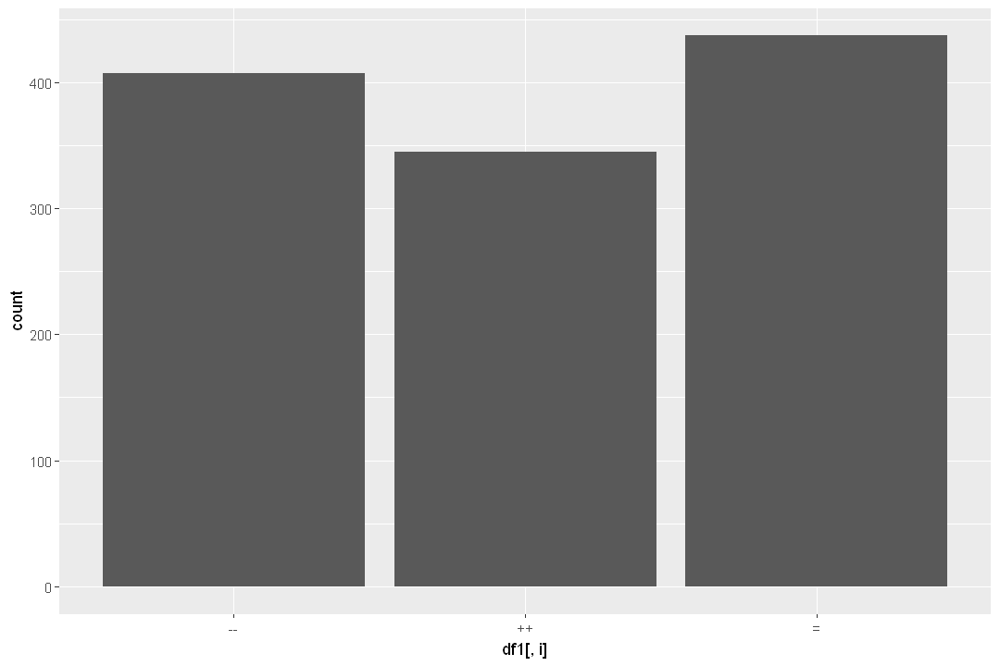

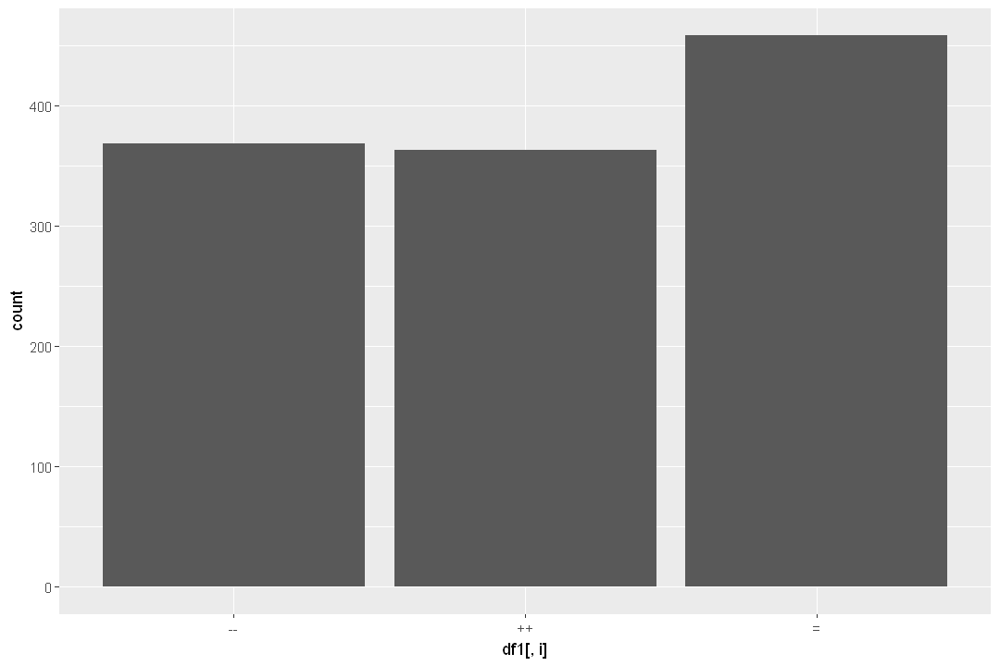

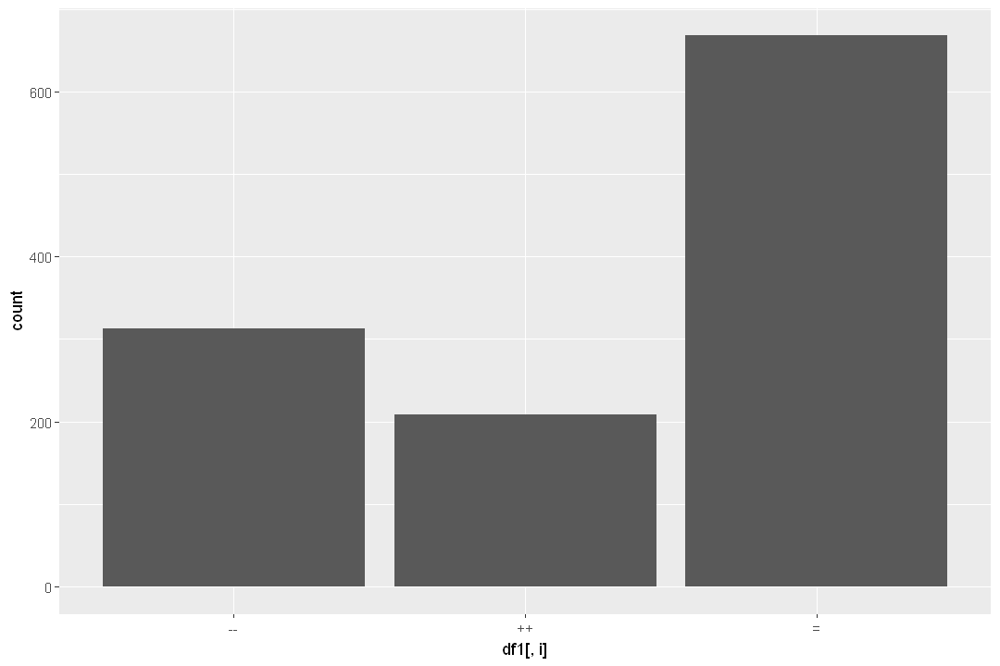

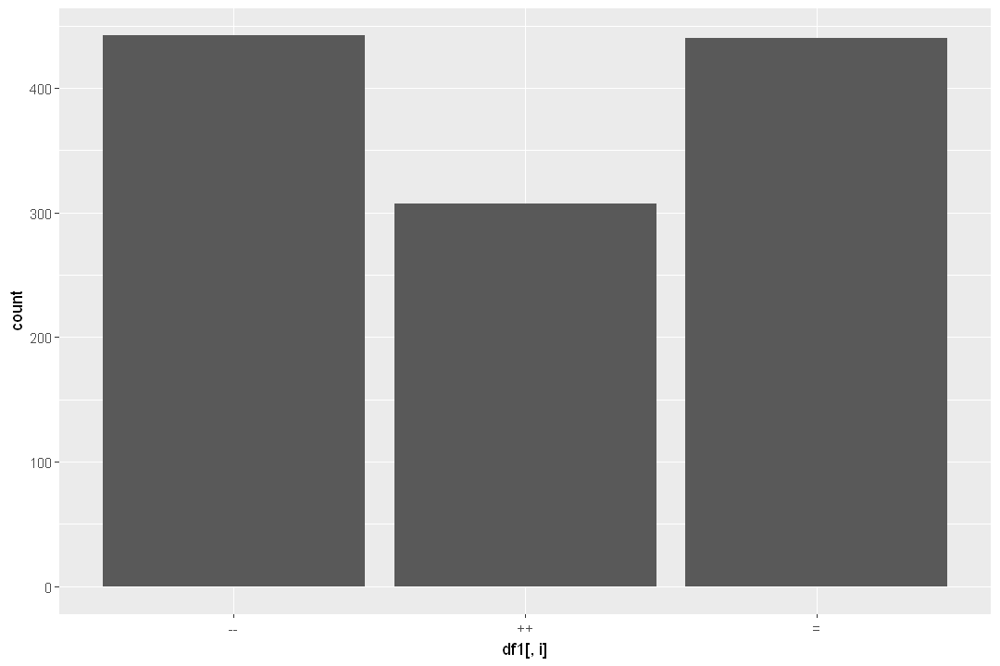

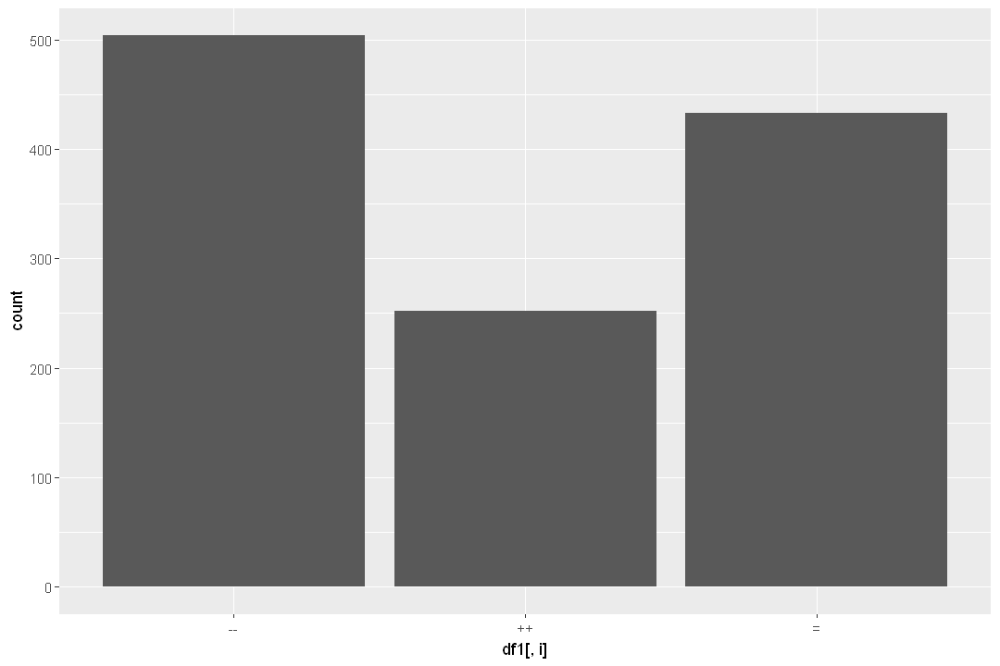

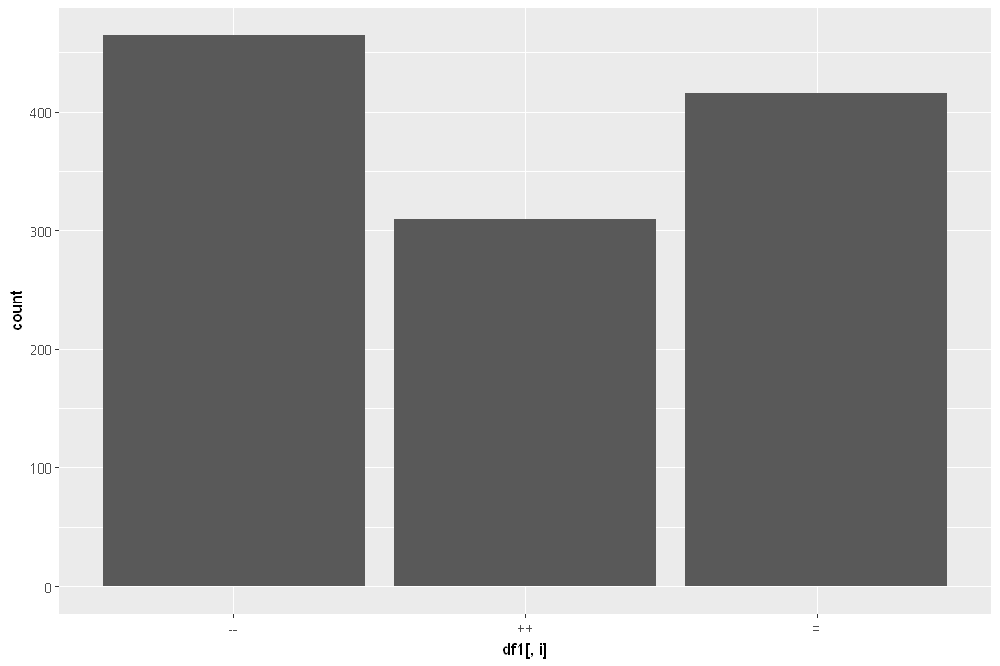

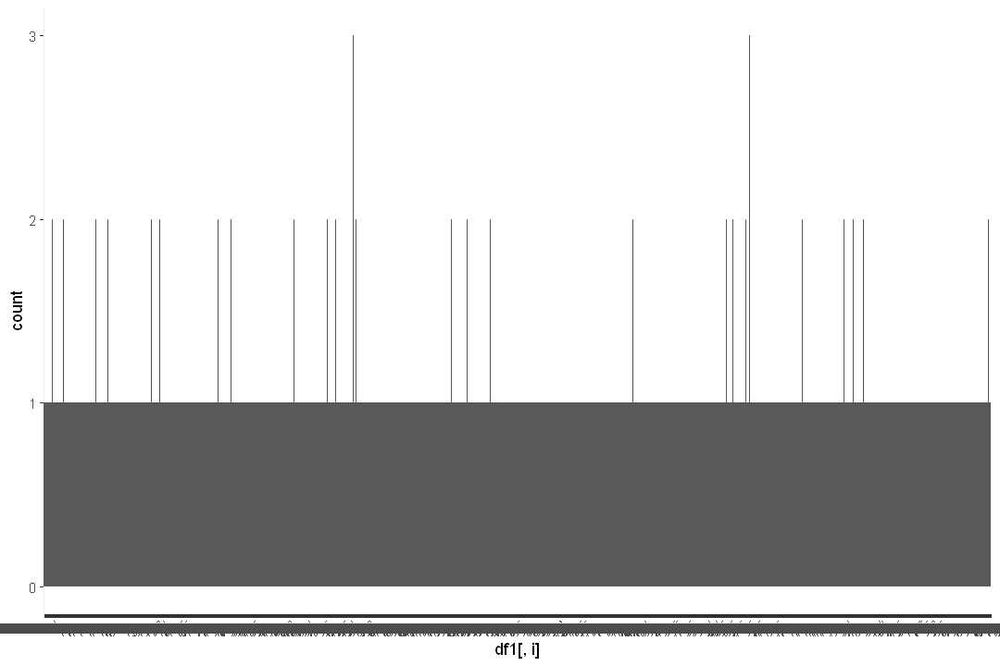

ERROR: [1m[33mError[39m in `geom_bar()`:[22m
[1m[22m[33m![39m Problem while computing aesthetics.
[36mℹ[39m Error occurred in the 1st layer.
[1mCaused by error in `[.data.frame`:[22m
[33m![39m colonnes non définies sélectionnées


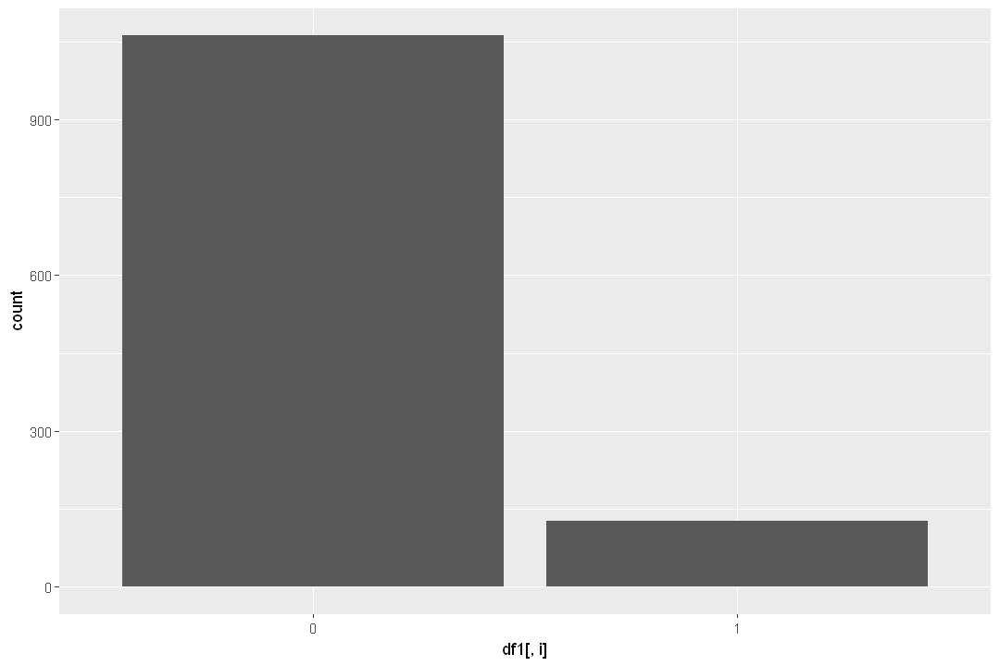

In [94]:
for (i in 1:24) {
    print(ggplot(data = df1, aes(x=df1[,i])) + geom_bar())
}

,eigenvalue,percentage of variance,cumulative percentage of variance
dim 1,0.5886904,14.717260,14.71726
dim 2,0.3799802,9.499505,24.21676
dim 3,0.2760961,6.902404,31.11917
dim 4,0.2694495,6.736238,37.85541
dim 5,0.2488198,6.220496,44.07590
dim 6,0.1938963,4.847408,48.92331


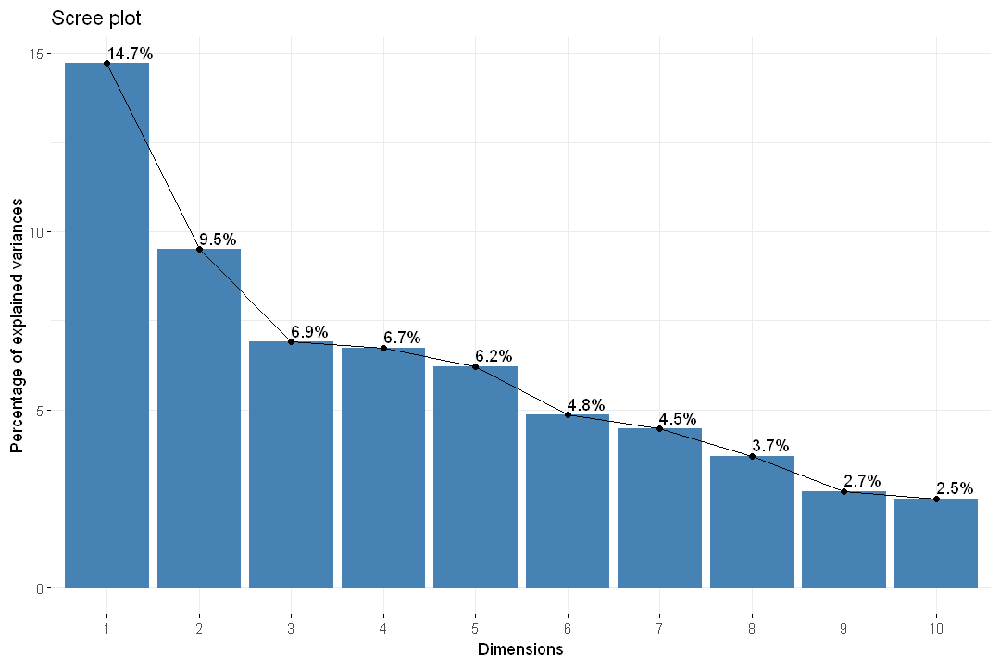

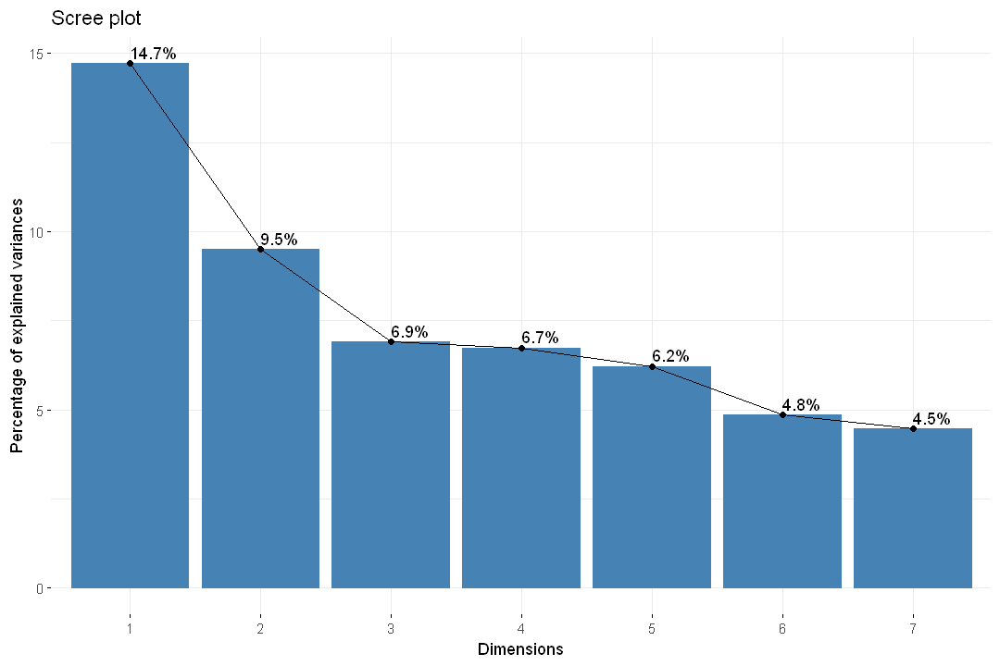

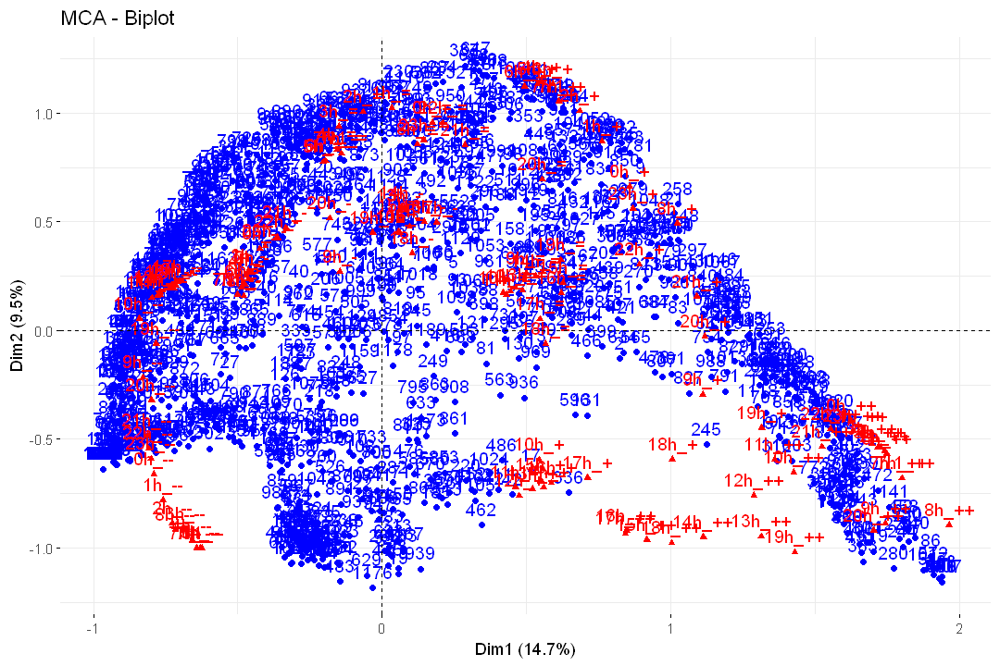

In [130]:
res.mca1 = MCA(df1[c((1:24),8)],graph=FALSE)
head(res.mca1$eig)

fviz_screeplot(res.mca1, addlabels=TRUE)
fviz_screeplot(res.mca1, addlabels=TRUE, ncp=7)
fviz_mca_biplot(res.mca1)

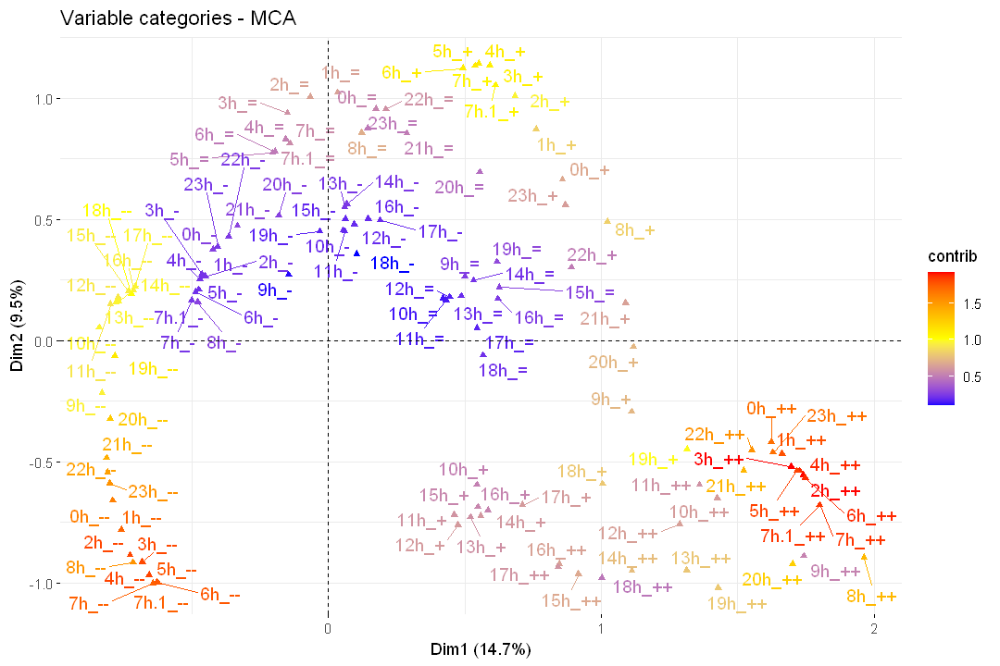

In [131]:
fviz_mca_var(res.mca1, col.var = "contrib",
             gradient.cols = c("blue", "yellow", "red"), axes=c(1,2),
             repel = TRUE)

In [9]:
lundi <- rowMeans(loading[,c(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24)])
mardi <- rowMeans(loading[,c(25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48)])
mercredi <- rowMeans(loading[,c(49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72)])
jeudi <- rowMeans(loading[,c(73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96)])
vendredi <- rowMeans(loading[,c(97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120)])
samedi <- rowMeans(loading[,c(121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144)])
dimanche <- rowMeans(loading[,c(145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168)])

df2 <- data.frame(lundi,mardi,mercredi,jeudi,vendredi,samedi,dimanche)

colnames(df2) <- list("Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche")
remplacer_valeurs <- function(valeur) {
  ifelse(valeur >= 0 & valeur <= 0.2, "-", 
         ifelse(valeur > 0.2 & valeur <= 0.6, "=","+"))
}
df2 <- as.data.frame(sapply(df2, remplacer_valeurs))
df2$Station <- velib$names
df2$Hill <- as.factor(coord$bonus)
df2$Station <- as.factor(df2$Station)
df2[] <- lapply(df2, as.factor)
head(df2)

,Lundi,Mardi,Mercredi,Jeudi,Vendredi,Samedi,Dimanche,Station,Hill
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,-,=,=,=,=,=,-,EURYALE DEHAYNIN,0
2,=,=,=,=,=,+,=,LEMERCIER,0
3,=,+,=,=,=,=,=,MEZIERES RENNES,0
4,+,=,=,=,=,=,+,FARMAN,0
5,+,+,=,=,=,=,=,QUAI DE LA RAPEE,0
6,=,=,=,=,=,+,-,CHOISY POINT D'IVRY,0


,eigenvalue,percentage of variance,cumulative percentage of variance
dim 1,0.60075654,32.040349,32.04035
dim 2,0.38514649,20.541146,52.58149
dim 3,0.14757564,7.870701,60.45220
dim 4,0.10123839,5.399381,65.85158
dim 5,0.09826788,5.240954,71.09253
dim 6,0.07965815,4.248435,75.34096


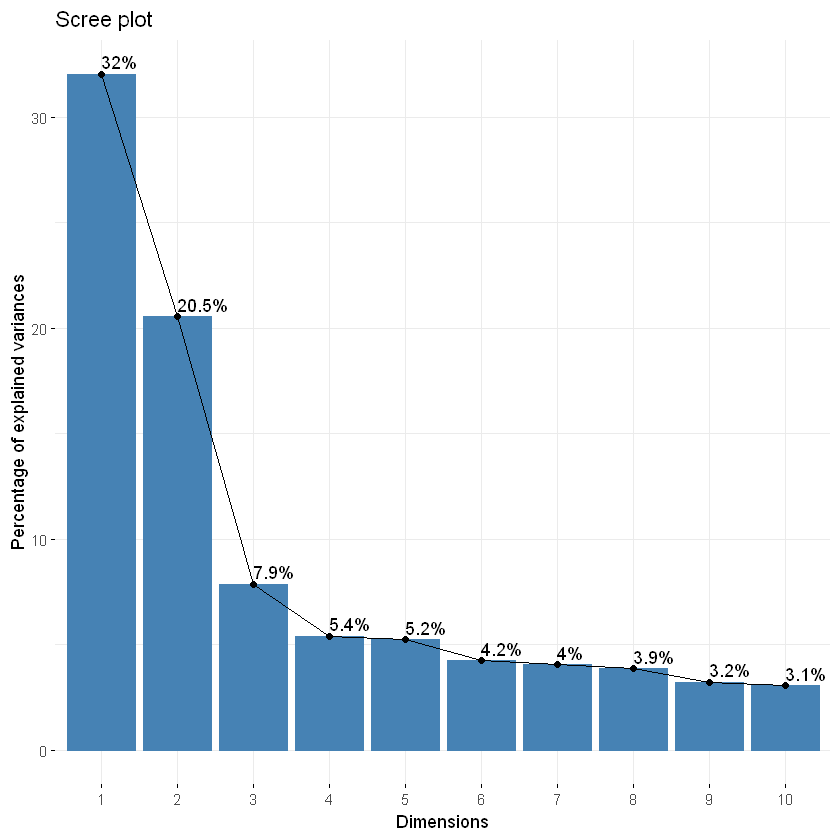

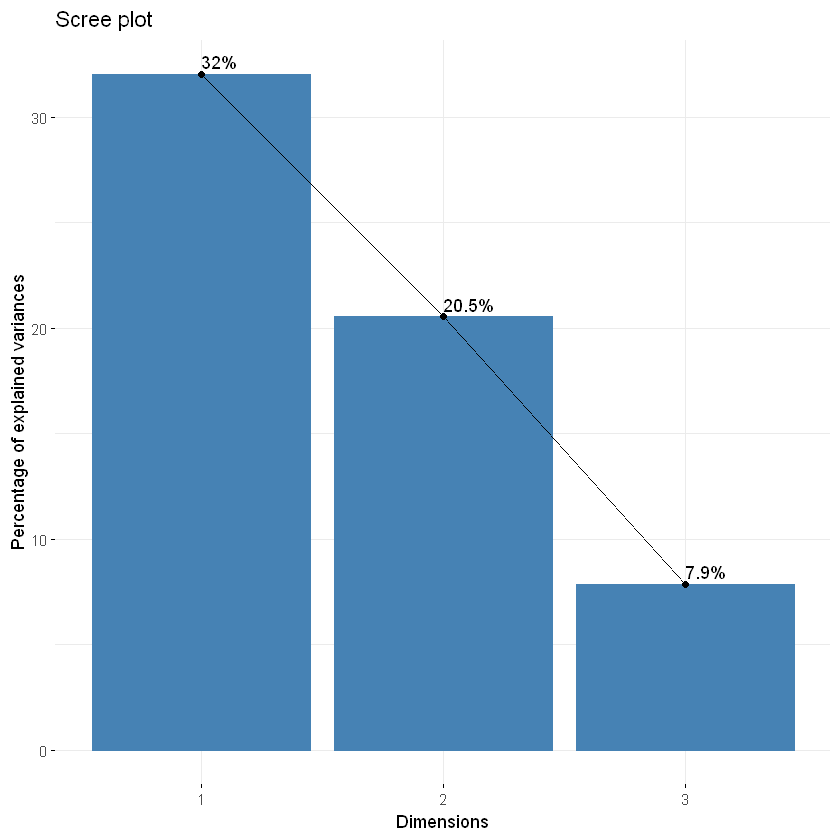

In [10]:
res.mca2 = MCA(df2[c((1:7),9)], graph=FALSE)
head(res.mca2$eig)

fviz_screeplot(res.mca2, addlabels=TRUE)
fviz_screeplot(res.mca2, addlabels=TRUE, ncp=3)

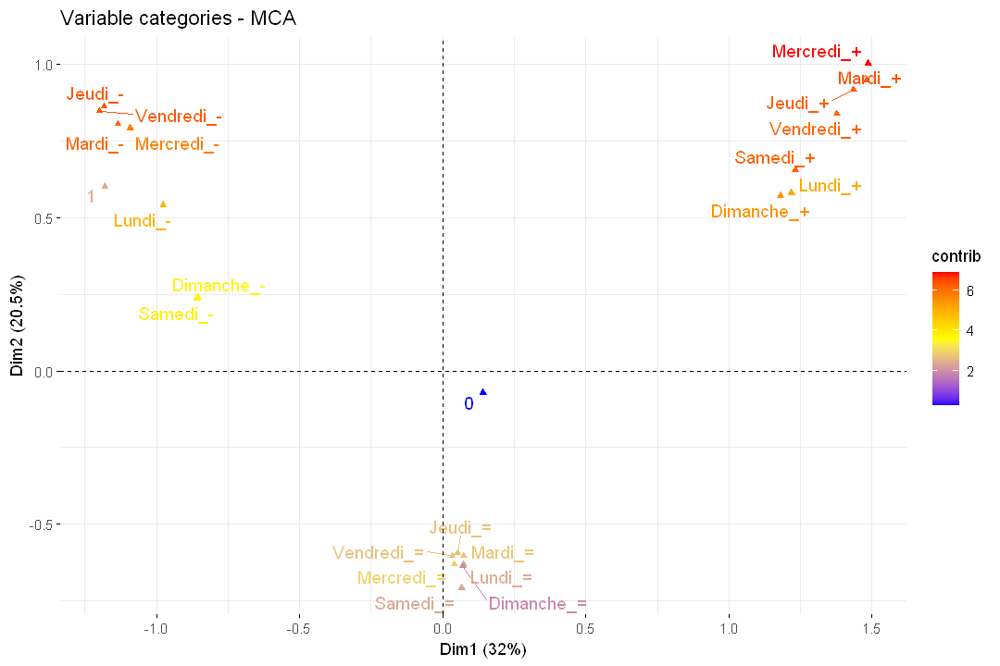

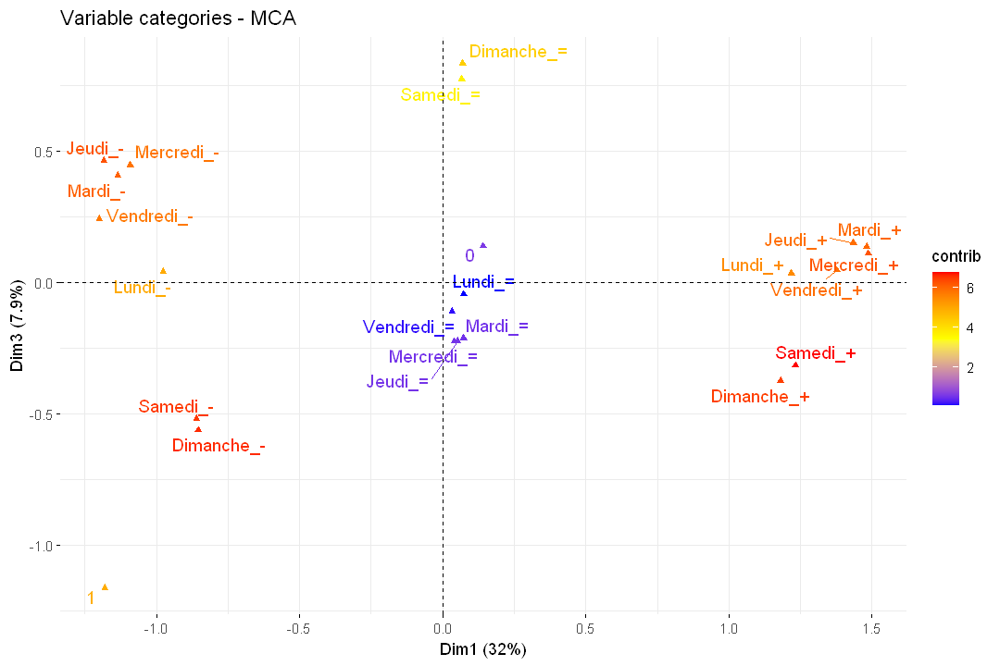

In [23]:
fviz_mca_var(res.mca2, col.var = "contrib",
             gradient.cols = c("blue", "yellow", "red"), axes=c(1,2),
             repel = TRUE)
fviz_mca_var(res.mca2, col.var = "contrib",
             gradient.cols = c("blue", "yellow", "red"), axes=c(1,3),
             repel = TRUE)

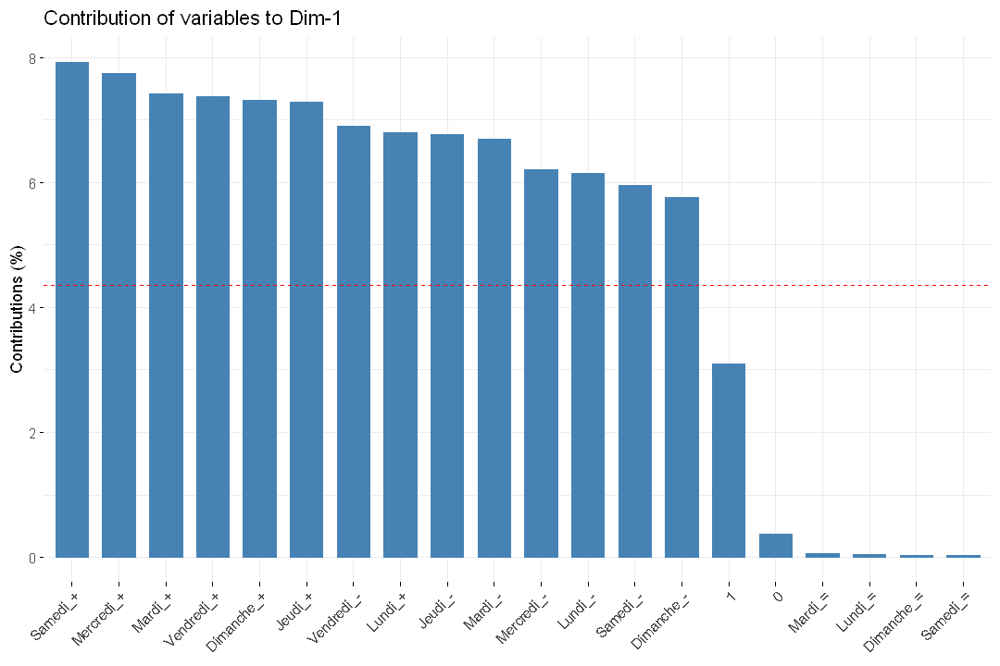

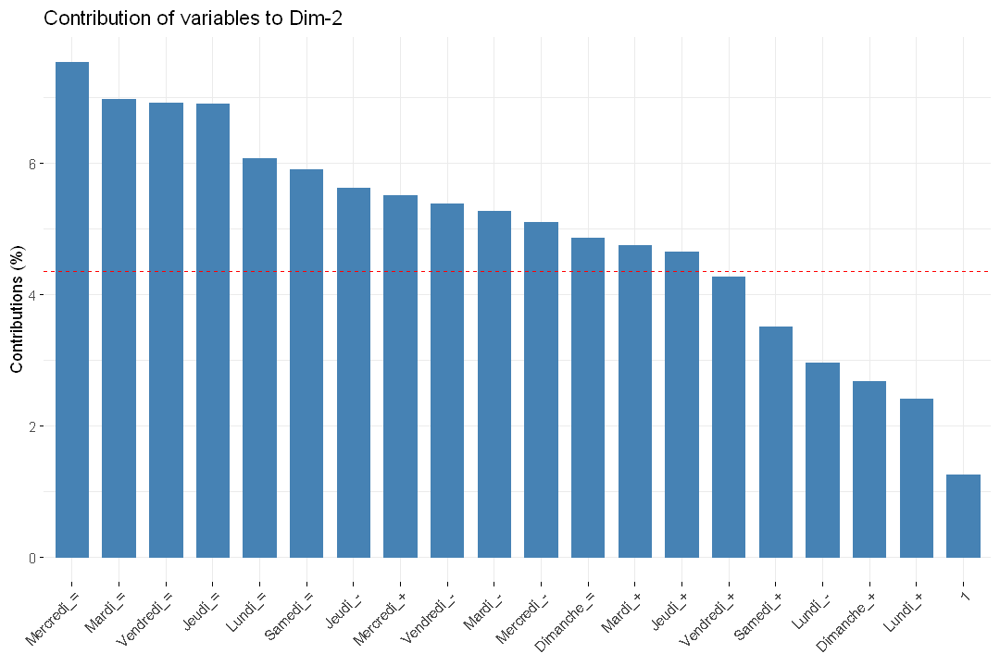

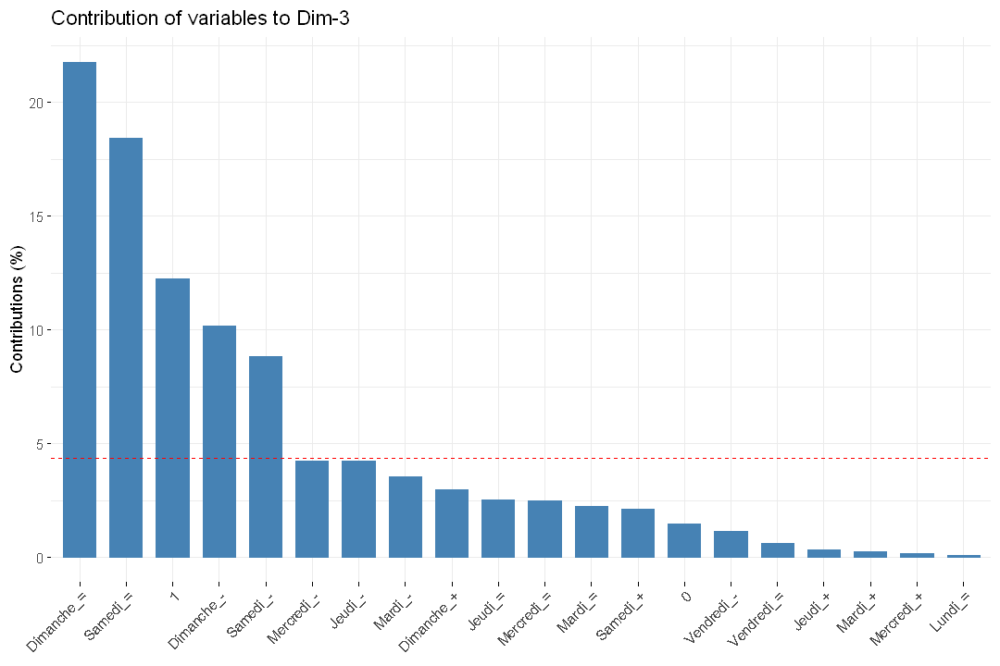

In [24]:
# Contributions of hobbies to dimension 1
fviz_contrib(res.mca2, choice="var", axes=1, top=20)

# Contributions of hobbies to dimension 2
fviz_contrib(res.mca2, choice="var", axes=2, top=20)


# Contributions of hobbies to dimension 2
fviz_contrib(res.mca2, choice="var", axes=3, top=20)

In [25]:
### dim 3 : contribution largement apportée par Samedi= et Dimanche=. D'ailleurs sur les cartes, on voit que ce sont ces 
### stations "=" dont le taux de chargement varie le plus entre semaine et week-end (station en orange en centre ville).

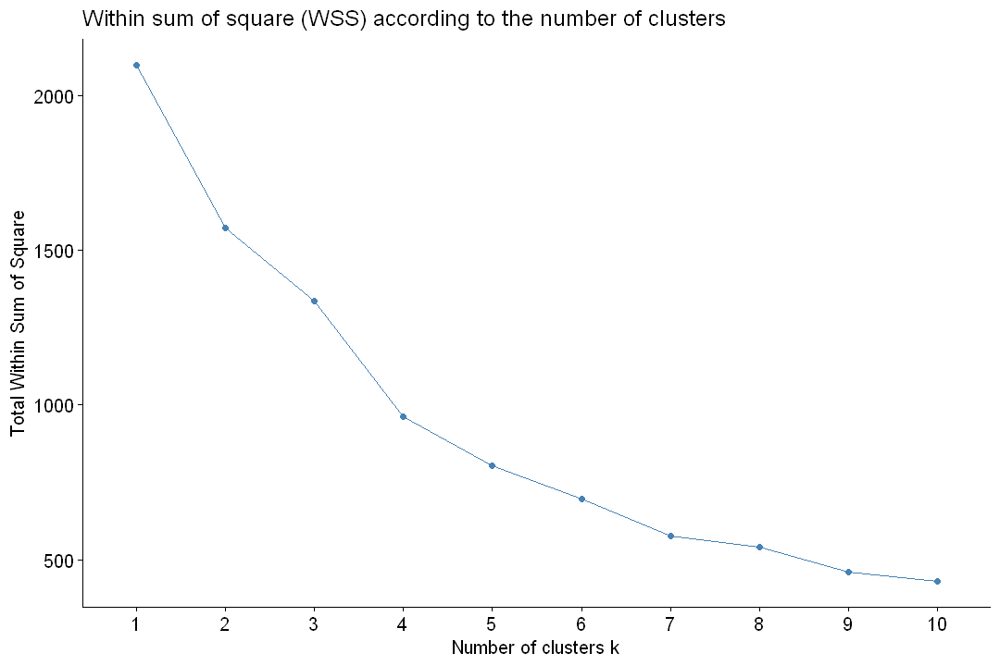

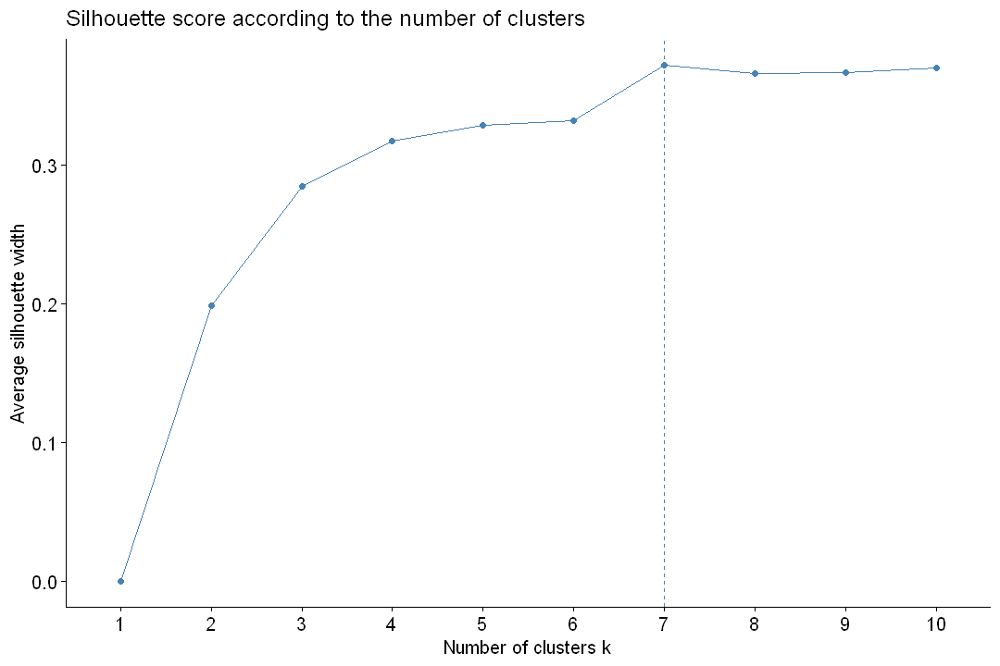

In [132]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_nbclust(res.mca1$ind$coord, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(res.mca1$ind$coord, FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")
### partie cluster : se poser la question si à conserver ou non

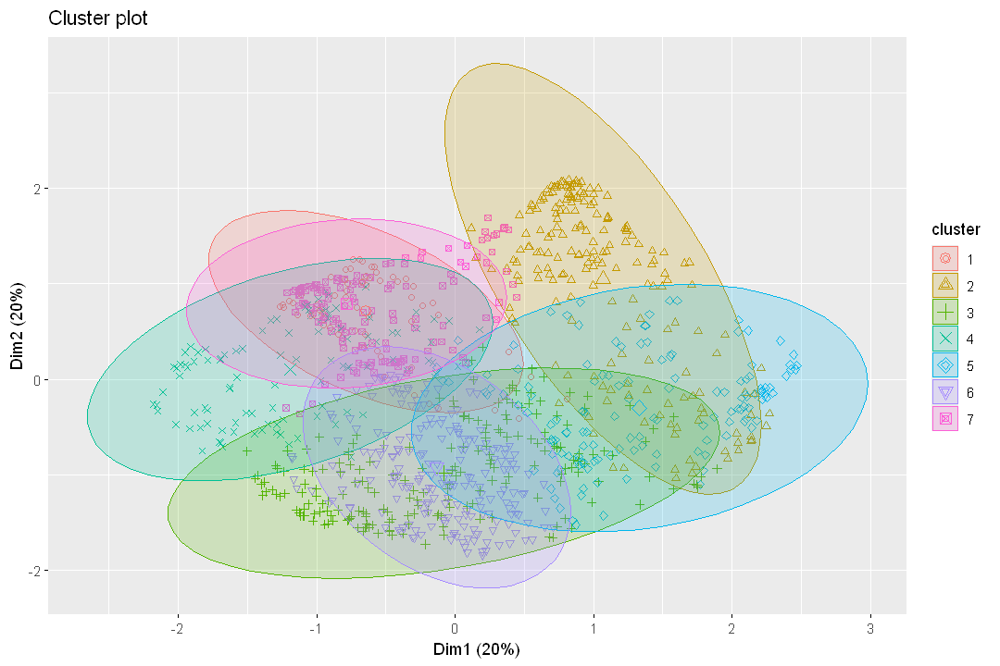

In [133]:
reskmeans = kmeans(res.mca1$ind$coord, centers=7) 

fviz_cluster(reskmeans, data=res.mca1$ind$coord, ellipse.type="norm", labelsize=8, geom=c("point"))

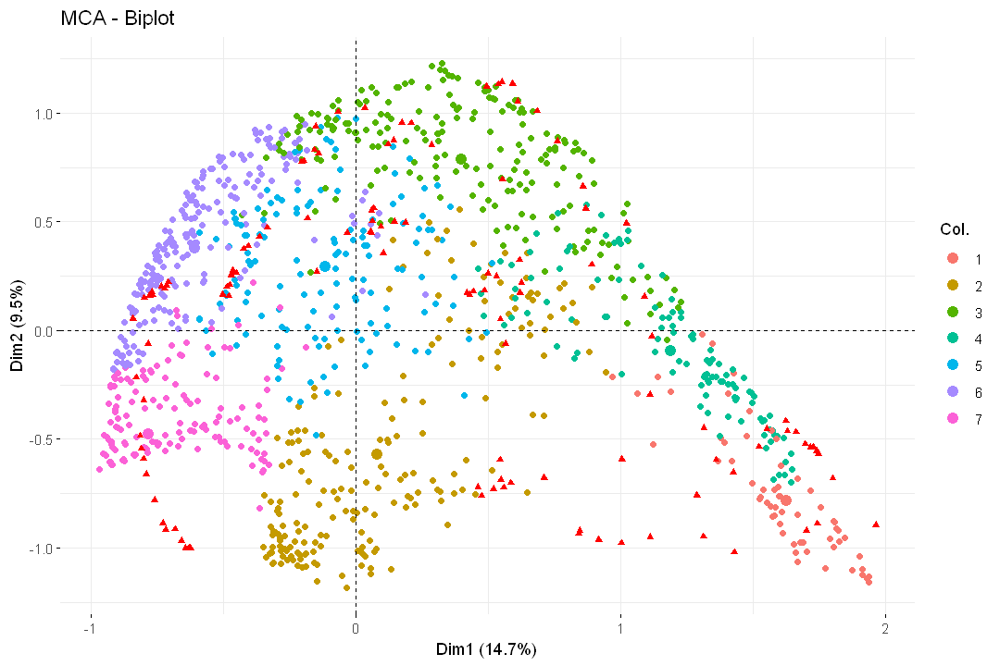

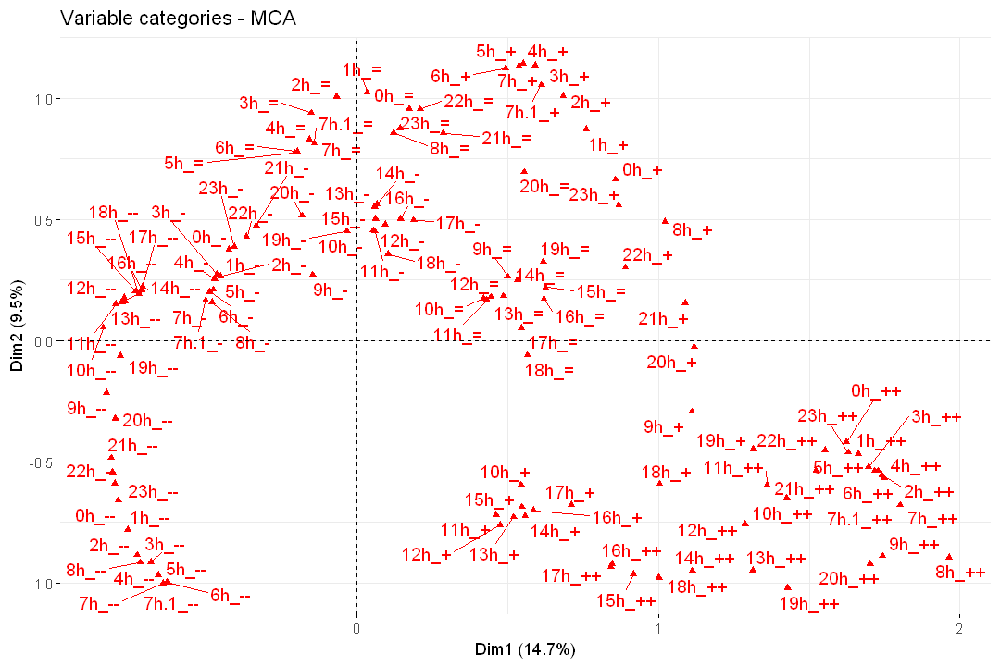

In [134]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_mca_biplot(res.mca1, col.ind = as.factor(reskmeans$cluster), geom = c("point"))
fviz_mca_var(res.mca1, repel = TRUE)

In [135]:
cluster_palette <- colorFactor(c("#E41A1C","#4DAF4A","#377EB8"), domain = unique(reskmeans$cluster))  # Utiliser la palette viridis avec 10 couleurs

leaflet(velib$position) %>% 
  addTiles(urlTemplate = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png", 
           attribution = 'Map tiles by Carto, under CC BY 3.0. Data by OpenStreetMap, under ODbL.') %>% 
  addCircleMarkers(radius = 3,
                   color = ~cluster_palette(reskmeans$cluster),
                   stroke = FALSE, 
                   fillOpacity = 0.9) %>%
addLegend(position = "bottomright", 
            pal = cluster_palette, 
            values = ~reskmeans$cluster,
            title = "Cluster",
            opacity = 1)

HTML widgets cannot be represented in plain text (need html)

In [ ]:
### la MCA sur les heures ne donne pas de résultats satifaisants (pareil avec mclust)

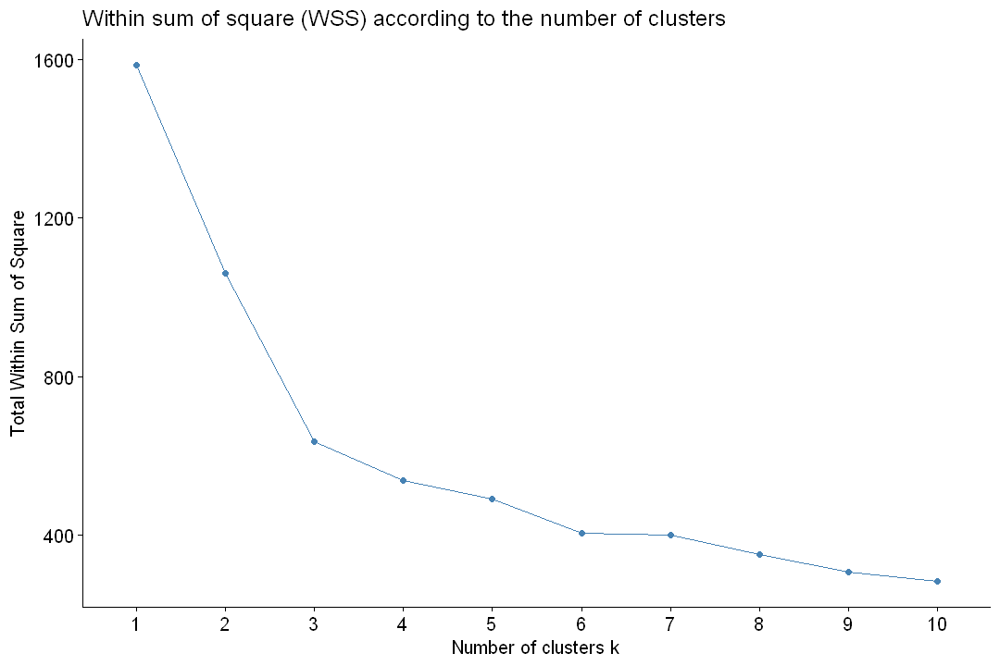

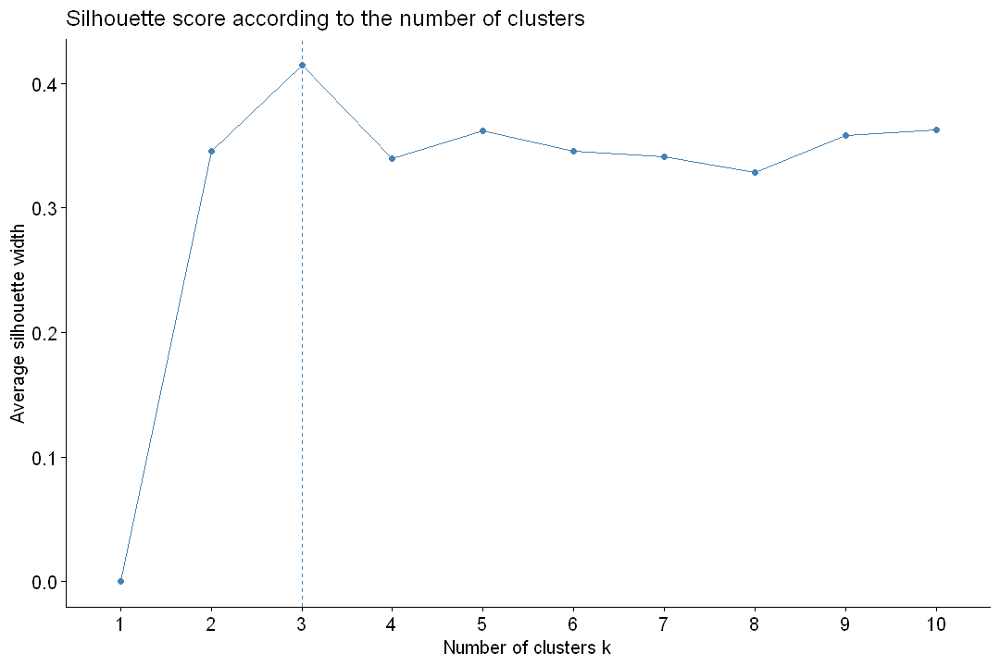

In [16]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_nbclust(res.mca2$ind$coord, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(res.mca2$ind$coord, FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

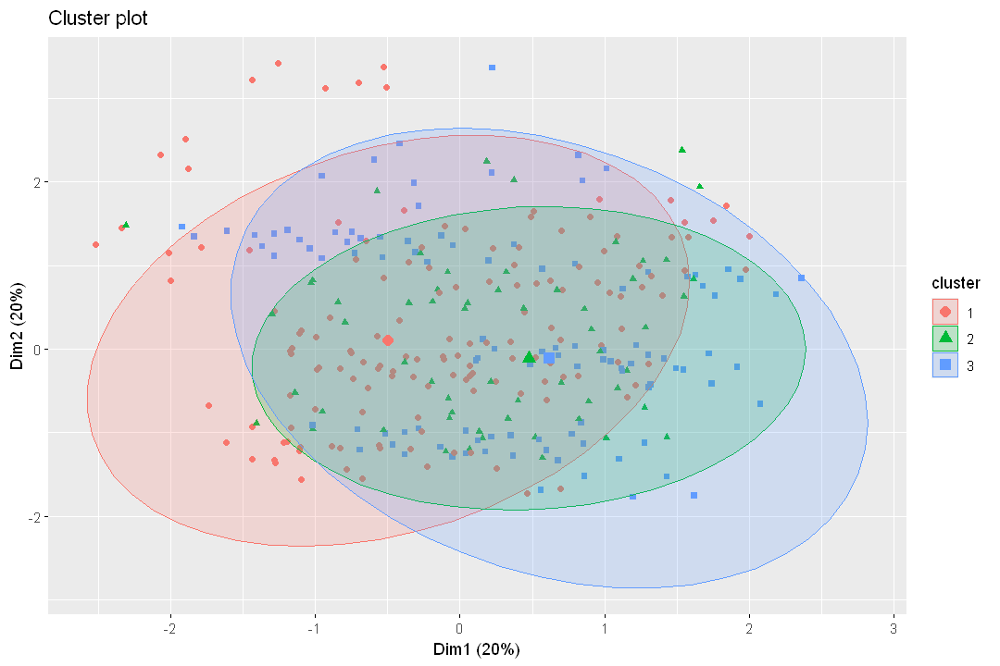

In [17]:
reskmeans = kmeans(res.mca2$ind$coord, centers=3) 

fviz_cluster(reskmeans, data=res.mca2$ind$coord, ellipse.type="norm", labelsize=8, geom=c("point"))

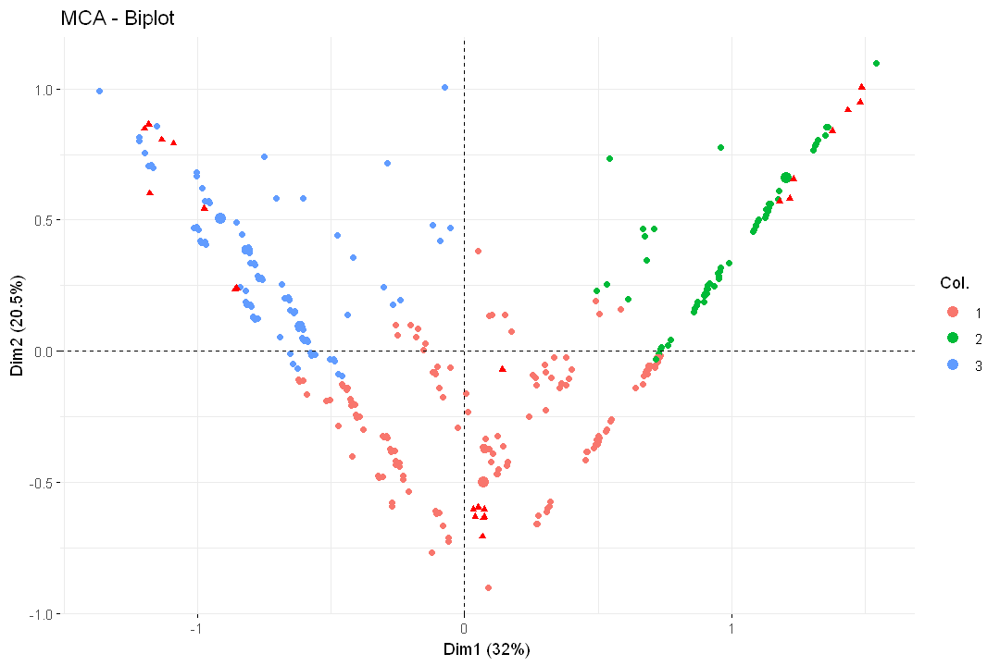

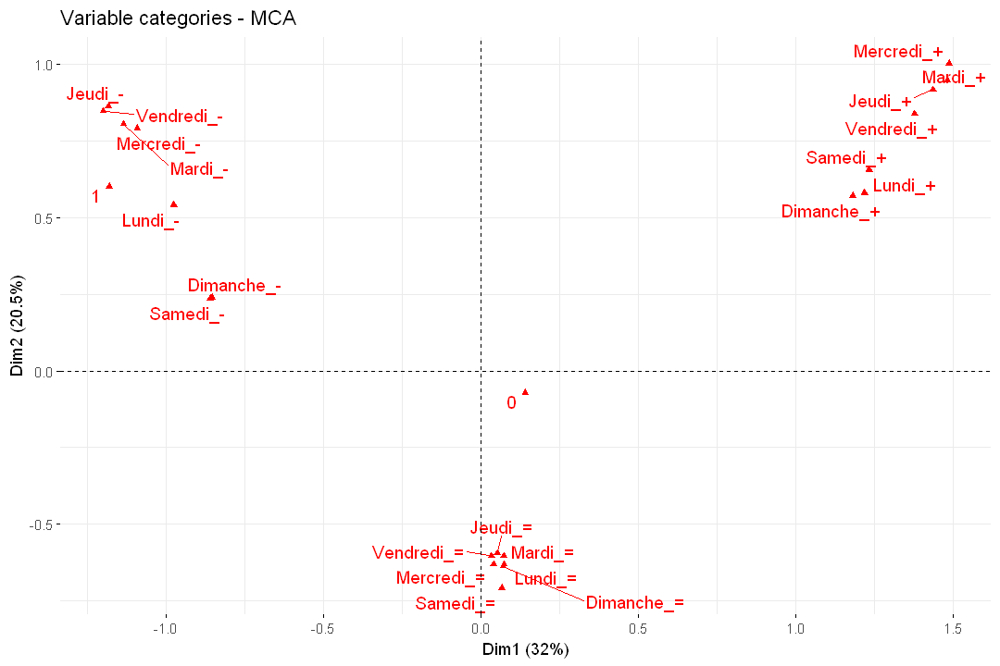

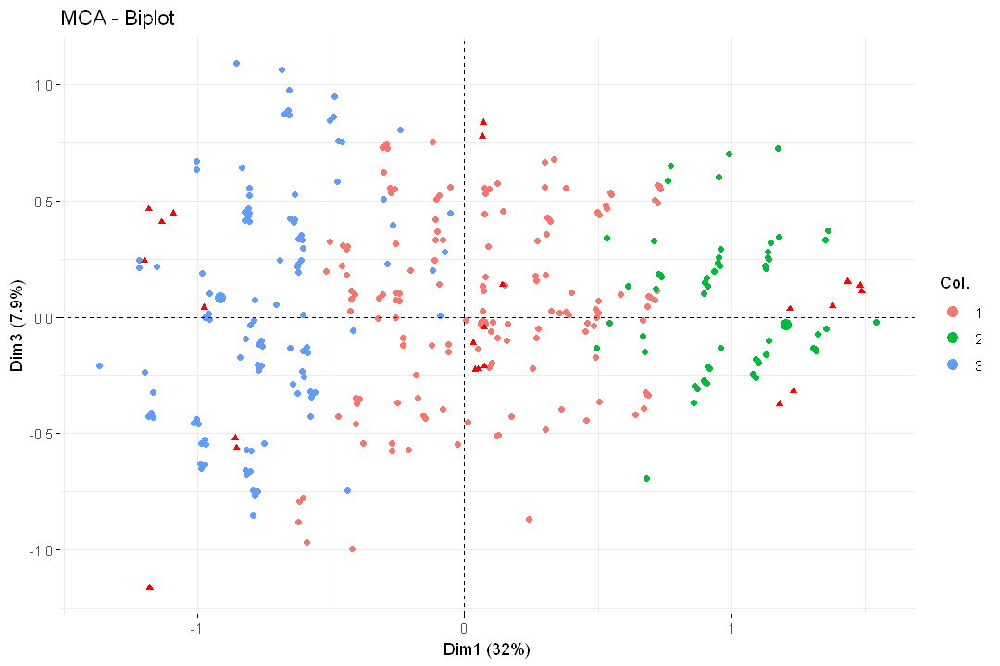

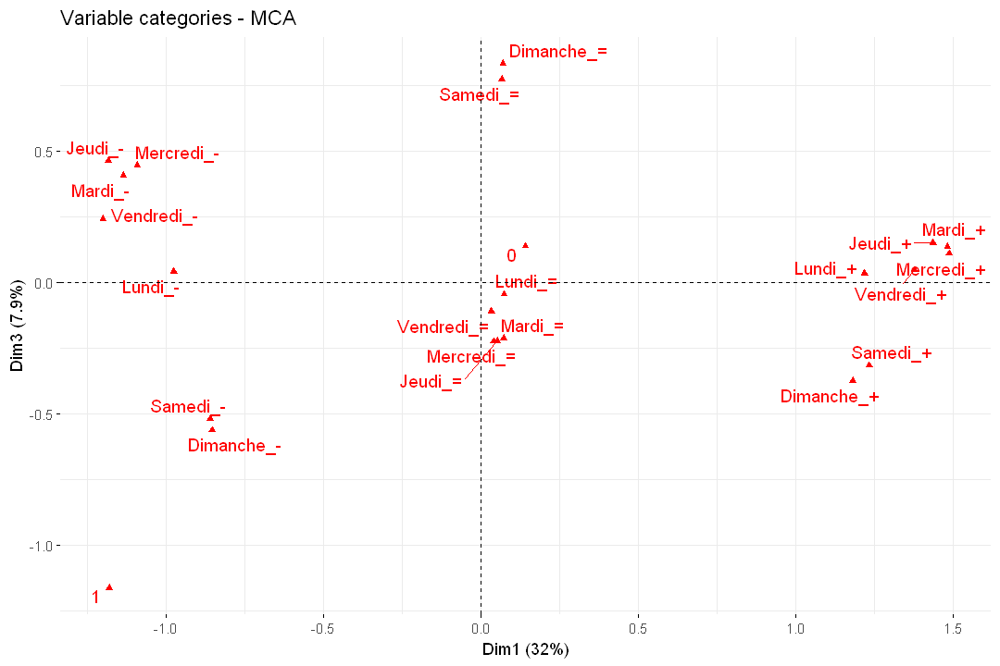

In [18]:
options(repr.plot.width = 9, repr.plot.height = 6)
fviz_mca_biplot(res.mca2, col.ind = as.factor(reskmeans$cluster), geom = c("point"))
fviz_mca_var(res.mca2, repel = TRUE)

fviz_mca_biplot(res.mca2, col.ind = as.factor(reskmeans$cluster), geom = c("point"), axes = c(1,3))
fviz_mca_var(res.mca2, repel = TRUE, axes = c(1,3))

In [28]:
### le cluster fait encore une réparation entre stations vides et pleines
### glm ne donne pas non plus des résultats satisfaisants (voir ci-dessous)
### conclu : pas de station qui ait un comportement plus marqué en semaine que le week-end et inversement 
### (d'ailleurs si on se souvient bien, il n'y avait que 8% de l'info sur la dim 2, censée exprimée le décalage semaine/week-end).

Best BIC values:
           EEV,19    EEV,20    EEV,16
BIC      7369.158 6463.1436 6454.2556
BIC diff    0.000 -906.0147 -914.9027

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust EEV (ellipsoidal, equal volume and shape) model with 19 components: 

 log-likelihood    n  df      BIC      ICL
       4775.033 1189 308 7369.158 7194.089

Clustering table:
  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
379 125  41  49 119 115  38  21  16  73   8  26   7  31  33  10  38  13  47 

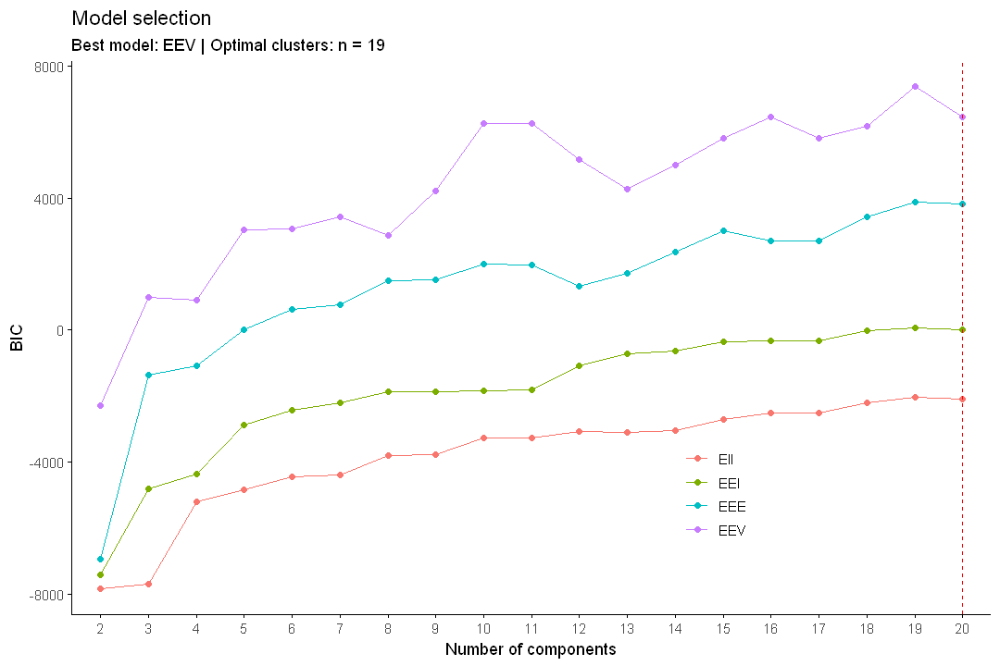

In [113]:
resBICall = mclustBIC(res.mca2$ind$coord, G=2:20)
summary(resBICall)

# --- #

resBICall = Mclust(res.mca2$ind$coord, G=2:20)
summary(resBICall)


fviz_mclust(resBICall, what="BIC")

Package 'mclust' version 6.1
Type 'citation("mclust")' for citing this R package in publications.


Attachement du package : 'mclust'


L'objet suivant est masqué depuis 'package:purrr':

    map




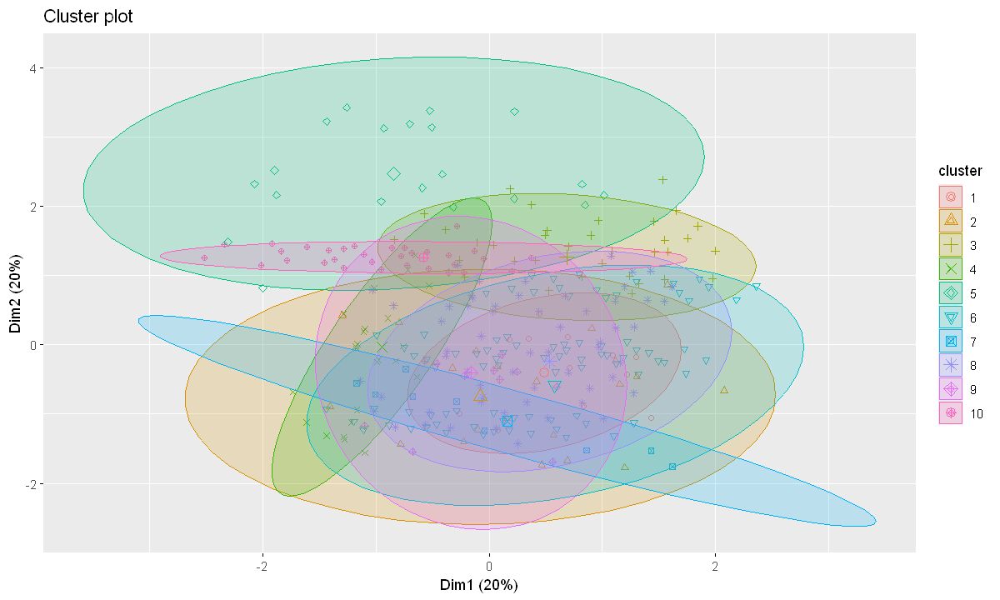

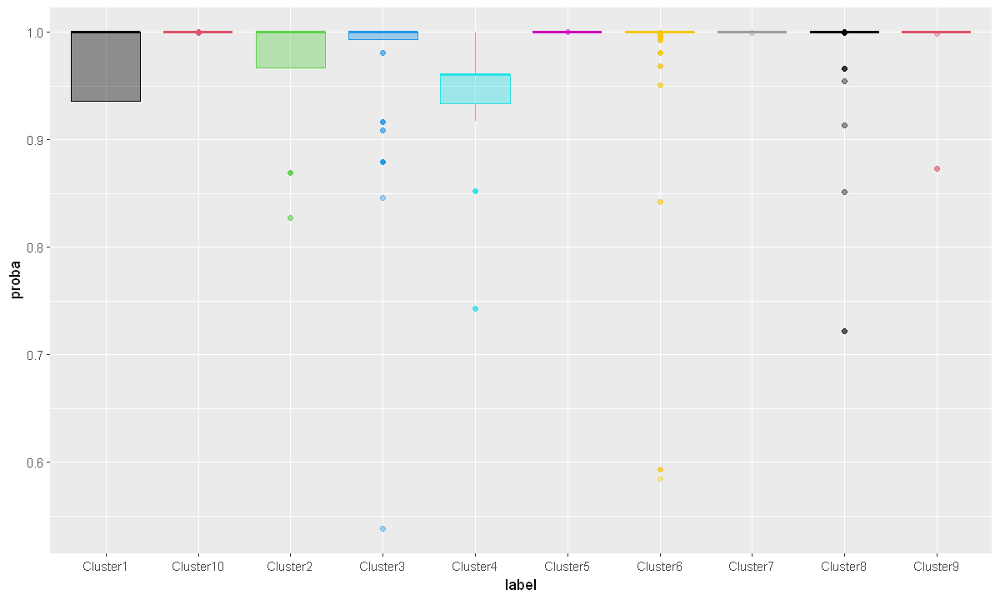

In [20]:
options(repr.plot.width = 10, repr.plot.height = 6)

resBIC = Mclust(res.mca2$ind$coord, G=10, modelNames = "EEV")
fviz_cluster(resBIC, data=res.mca2$ind$coord, ellipse.type="norm", geom="point")

# --- #

aux = data.frame(
    label = paste("Cluster", resBIC$classification, sep=""), 
    proba = apply(resBIC$z, 1, max))

ggplot(aux, aes(x=label, y=proba)) + 
    geom_boxplot(colour=1:10, fill=1:10, alpha=.4)

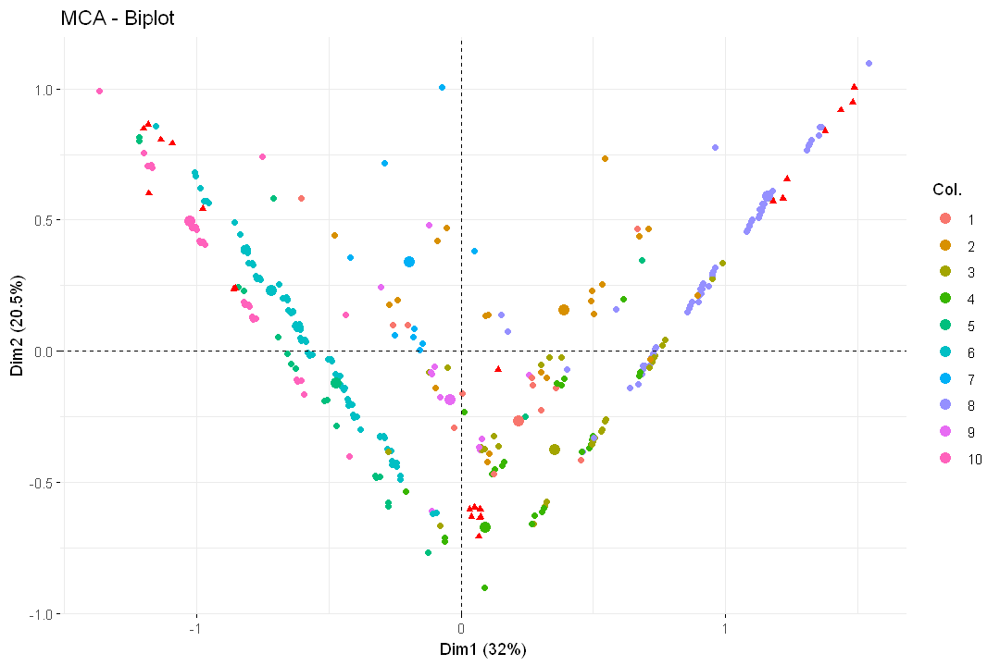

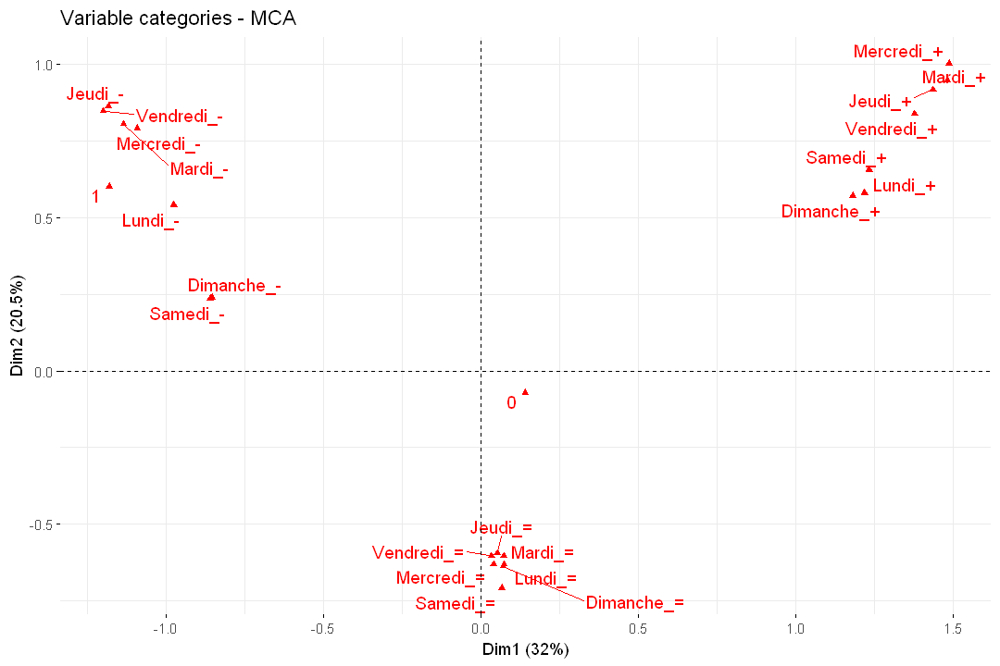

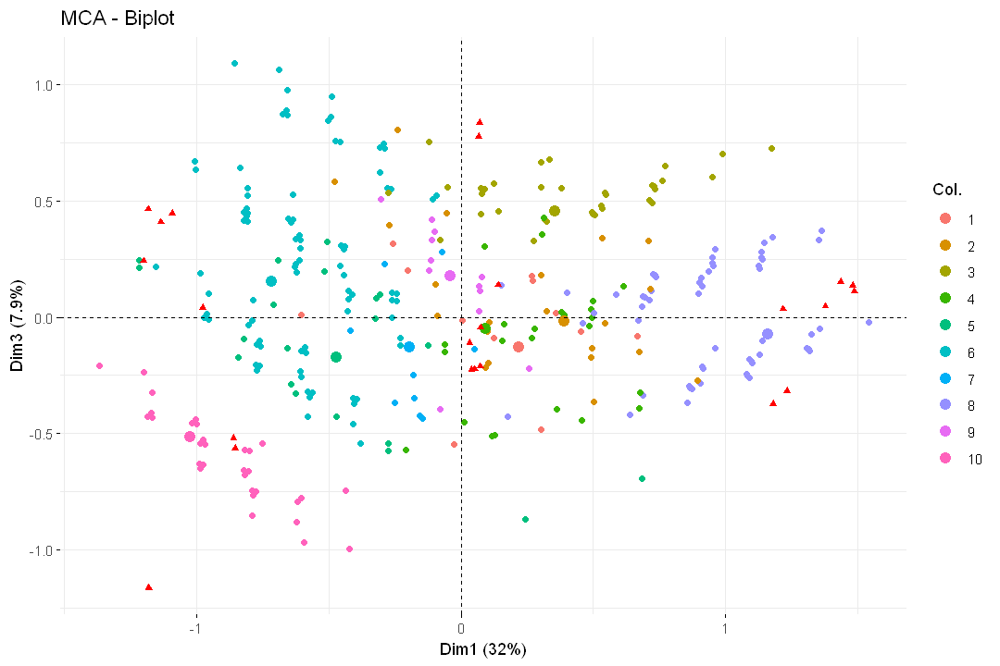

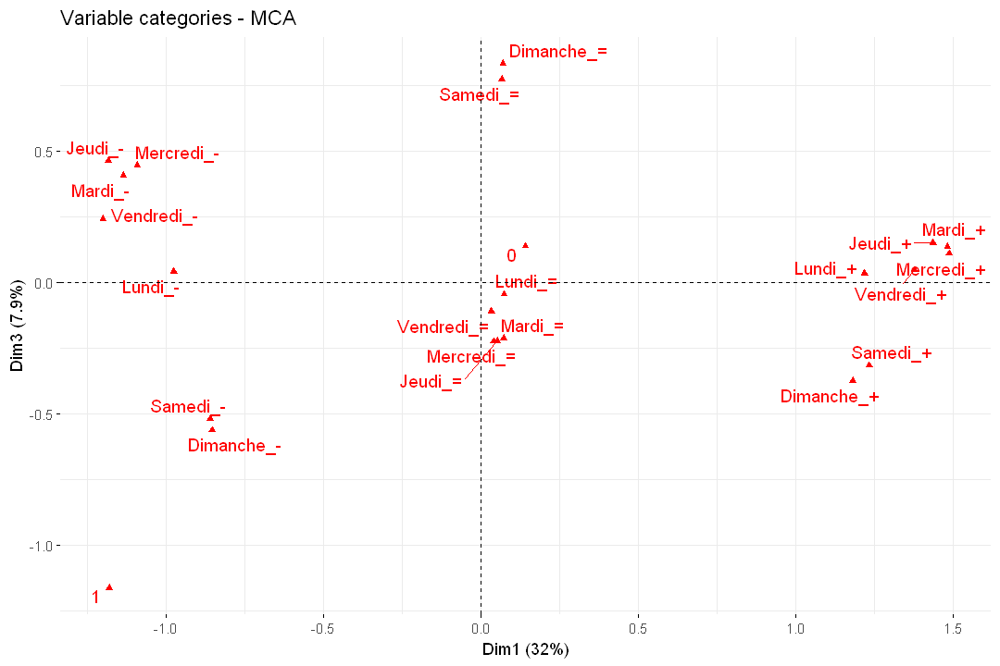

In [22]:
options(repr.plot.width = 9, repr.plot.height = 6)

fviz_mca_biplot(res.mca2, col.ind = as.factor(resBIC$classification), geom = c("point"), axes=c(1,2))
fviz_mca_var(res.mca2, repel = TRUE, axes = c(1,2))
fviz_mca_biplot(res.mca2, col.ind = as.factor(resBIC$classification), geom = c("point"), axes=c(1,3))
fviz_mca_var(res.mca2, repel = TRUE, axes = c(1,3))

In [2]:
### essaie avec les arbres
### à supprimer

Warning message:
"The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>."


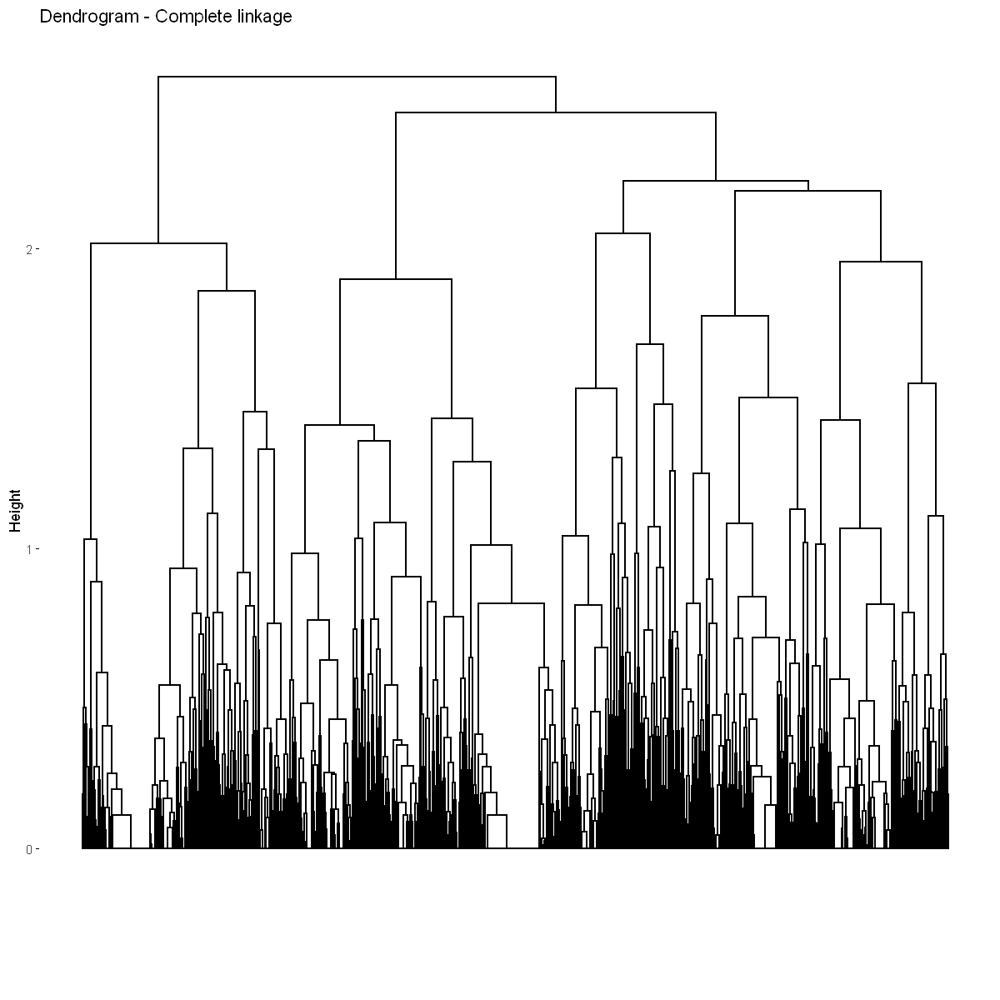

In [32]:
d = dist(res.mca1$ind$coord, method="euclidean")

# Clustering
hclustcomplete = hclust(d, method="complete")

# --- #
#Dendograms visualization
options(repr.plot.width=10, repr.plot.height=10)

fviz_dend(hclustcomplete, show_labels=FALSE, main='Dendrogram - Complete linkage')

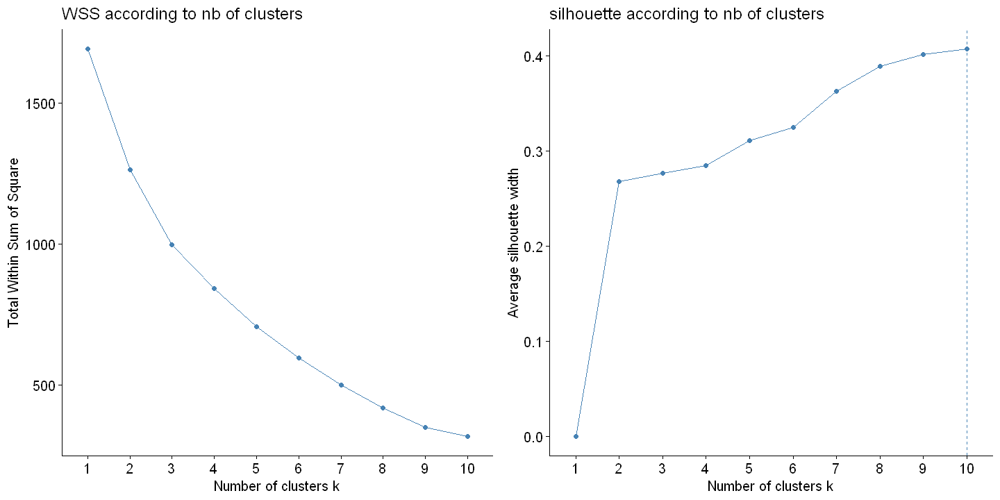

In [33]:
options(repr.plot.width = 12, repr.plot.height = 6)

grid.arrange(
    fviz_nbclust(res.mca1$ind$coord, FUNcluster=hcut, method="wss") + ggtitle("WSS according to nb of clusters"),
    fviz_nbclust(res.mca1$ind$coord, FUNcluster=hcut, method="silhouette") + ggtitle("silhouette according to nb of clusters"),
    ncol=2
)

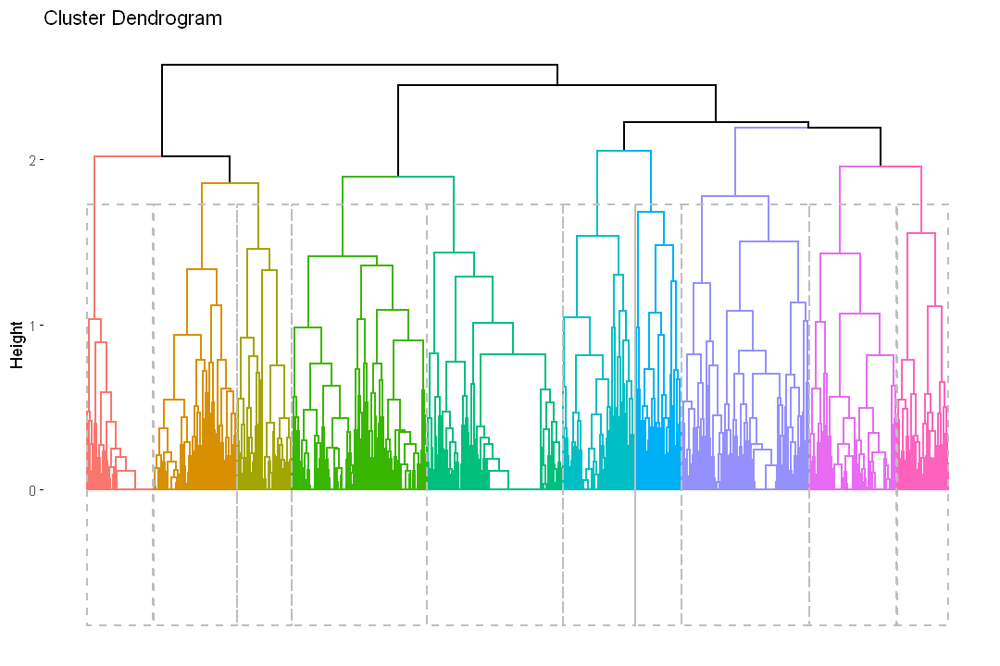

In [37]:
reshclust = cutree(hclustcomplete, 10)

# --- #

fviz_dend(hclustcomplete, k=10, show_labels=FALSE, rect=TRUE)

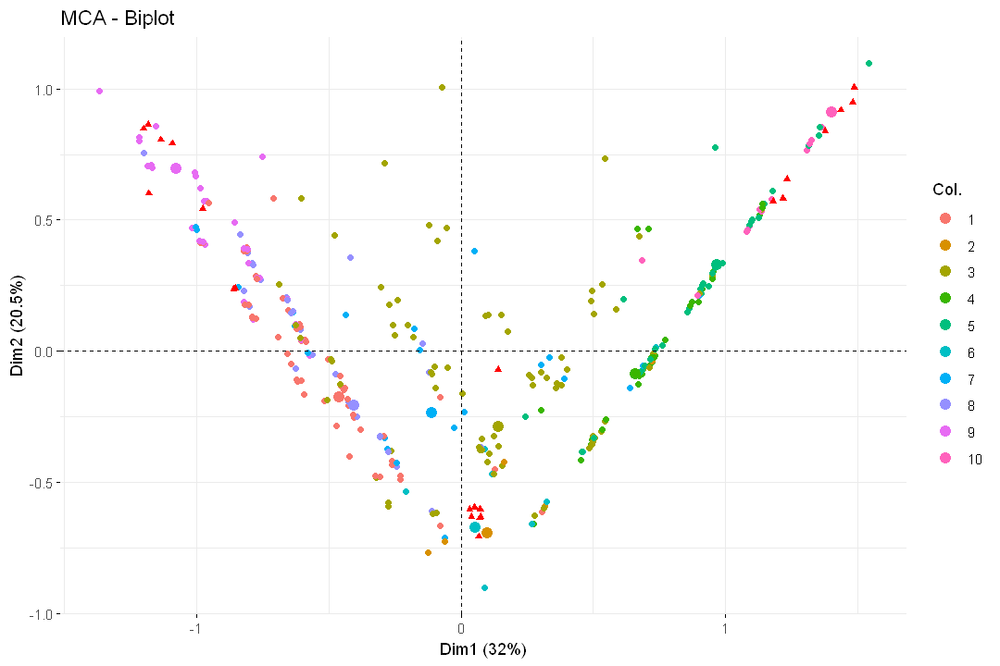

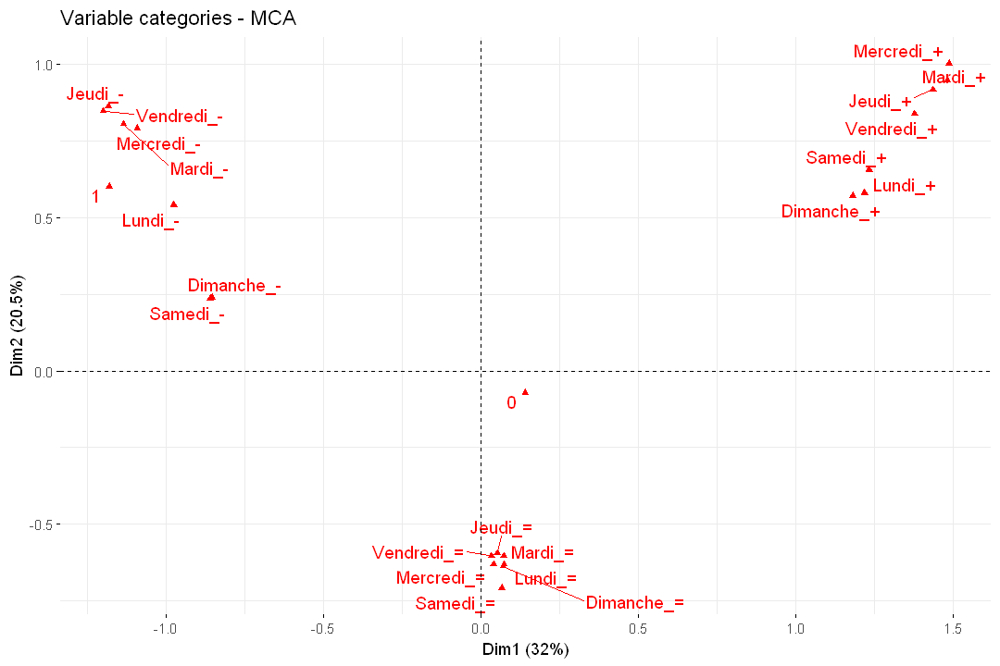

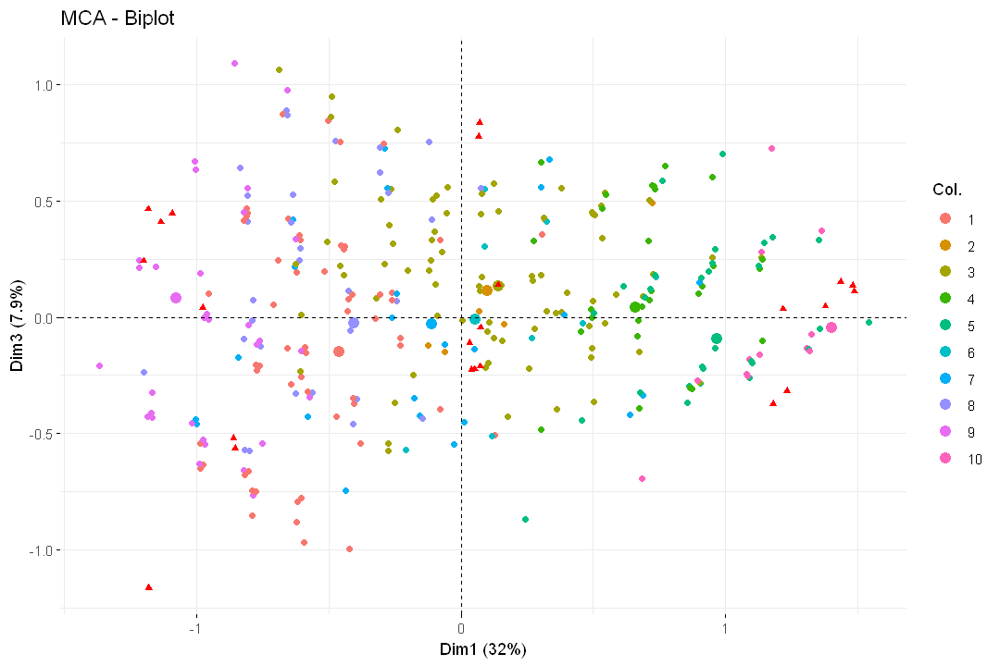

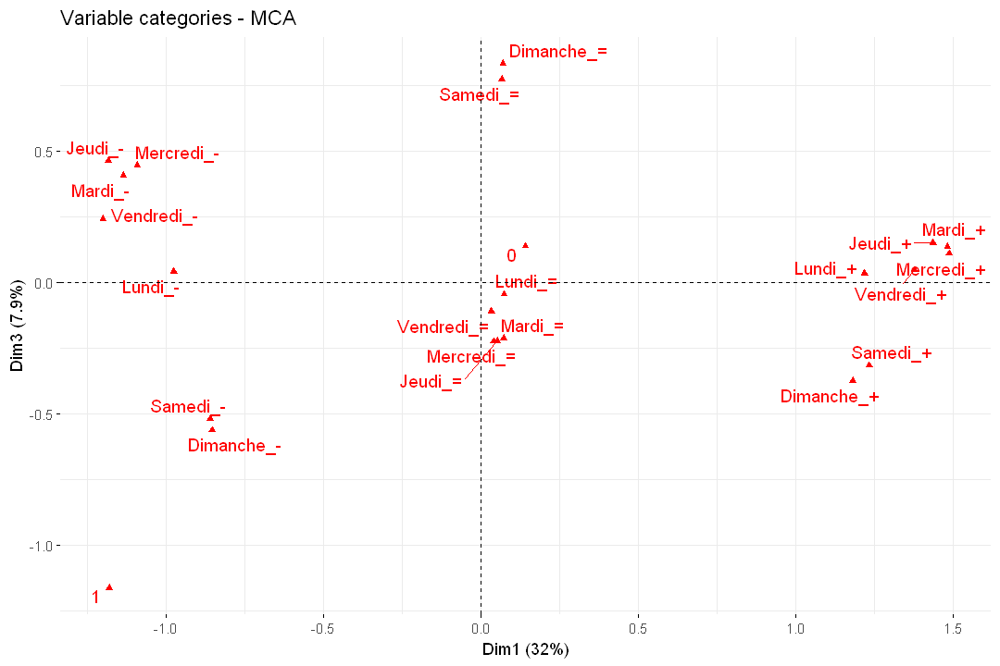

In [38]:
options(repr.plot.width = 9, repr.plot.height = 6)

fviz_mca_biplot(res.mca2, col.ind = as.factor(reshclust), geom = c("point"), axes=c(1,2))
fviz_mca_var(res.mca2, repel = TRUE, axes = c(1,2))
fviz_mca_biplot(res.mca2, col.ind = as.factor(reshclust), geom = c("point"), axes=c(1,3))
fviz_mca_var(res.mca2, repel = TRUE, axes = c(1,3))